In [1]:
import os
import csv
import optuna
import numpy as np
import pandas as pd
from tensorflow import keras
from tensorflow.keras.optimizers import Adam, RMSprop, SGD
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Input, LSTM, Dense, Activation, Dropout
from pandas import DataFrame
from pandas import Series
from pandas import concat
from pandas import read_csv
from datetime import datetime
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from math import sqrt
from matplotlib import pyplot as plt
from matplotlib.patches import Patch
from numpy import array
import keras.backend as K
import itertools
#!pip install pydot

# date-time parsing function for loading the dataset
def parser(x):
    return datetime.strptime('190'+x, '%Y-%m')
    
def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))
    
def mape (y_true, y_pred):
    return 100*K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def pearson (y_true, y_pred):
    return (K.square(K.mean((y_true - K.mean(y_true))*(y_pred - K.mean(y_pred)))))/(K.mean(K.square(y_true - K.mean(y_true)))*K.mean(K.square(y_pred - K.mean(y_pred))))
    
# convert time series into a supervised learning problem
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
# convert time series into a supervised learning problem
def series_to_supervised(data, n_in=1, n_out=1, dropnan=True):

    n_vars = 1 if type(data) is list else data.shape[1]
    cols, names = list(), list()
    df = DataFrame(data)
    # input sequence (t-n, ... t-1)
    for i in range(n_in, 0, -1):
    	cols.append(df.shift(i))
    	names += [('var%d(t-%d)' % (j+1, i)) for j in range(n_vars)]
    # forecast sequence (t, t+1, ... t+n)
    for i in range(0, n_out):
        cols.append(df[0].shift(-i)) # df[0] for specific humidity
        if i == 0:
            names += [('var%d(t)' % (1))] # % (1) for specific humidity
        else:            
            names += [('var%d(t+%d)' % (1, i))] # % (1) for specific humidity
    
    # put it all together
    agg = concat(cols, axis=1)

    if dropnan:
        #Drop rows containing NaN
        agg.dropna(inplace=True)

    agg.columns = names

    return agg
     
# create a differenced series
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def difference(dataset, interval=1):
    diff = list()
    for i in range(interval, len(dataset)):
        value = dataset[i] - dataset[i - interval]
        diff.append(value)
    return Series(diff)
     
# transform series into training sets for supervised learning
def prepare_training_data(data, n_lag, n_seq, n_time_steps):
    
    #Prepare data for time series forecasting.
        
    #Parameters:
    #x (array-like): Input features.
    #y (array-like): Target values.
    #n_test (int): Number of test samples (rows).
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations.
    #n_train (int): Number of training samples (rows).
        
    #Returns:
    #tuple: Training and test datasets.
    
    n_vars = len(data[0][0])

    # Each weather station has 227 time steps (the first 180 have no nan values)
    # Loop through data, grabbing one weather station (ws) at a time, 
    # differencing on each ws and separating by training (first 226-n_lag-n_seq-n_test time steps) 
    # and testing (n_test time steps) to scale data on training only.
    # We then recombine the training and testing datasets to change each ws to a supervised learning problem by taking all the first 180 time steps for all 12 predictors
    # and changing these to (t-n_lag) to (t-1) since we lose one row through differencing. We then shift forward only one dependent variable (temperature or specific humidity)
    # for time steps t to (t+n_seq)


    diff_values = []
    
    for ws in range(84):
        
        # transform data to be stationary
        diff_series = difference(data[ws], 1)
        for i in range(len(diff_series)):
            diff_values_row = []
            for j in range(len(diff_series[0])):
                diff_values_row.append(diff_series[i][j])
            diff_values.append(diff_values_row)
    
    # rescale values to 0, 1
    scaler_all_features =  MinMaxScaler(feature_range=(0, 1))
    scaler =  MinMaxScaler(feature_range=(0, 1))
    train_scaled_values = scaler_all_features.fit_transform(diff_values)
    response_train_values = []
    for i in range(len(diff_values)):
        response_train_values.append(diff_values[i][0]) # Uses first column (specific_humidity) as response variable
    response_train_values = np.array(response_train_values)
    response_train_values = response_train_values.reshape(len(response_train_values), 1)

    # Fit the scaler for just the response variable for use later when forecasting
    response_scaled_values = scaler.fit_transform(response_train_values) 
    scaled_values = scaler_all_features.transform(diff_values)

    train = []

    # Transform each weather station as a separate "batch"
    for ws in range(84):
        # transform into supervised learning problem X, y
        first = (n_time_steps-1)*ws
        last = (n_time_steps-1)*ws+(n_time_steps-2)
        scaled_values_batch = scaled_values[first:last]
        supervised = series_to_supervised(scaled_values_batch, n_lag, n_seq)
        supervised_values = supervised.values
        train.append([supervised_values])
    
    return scaler, scaler_all_features, train

# transform series into testing and validation sets for supervised learning
def prepare_testing_and_validation_data(data, n_lag, n_seq, n_time_steps, scaler_all_features):
    
    #Prepare data for time series forecasting.
        
    #Parameters:
    #x (array-like): Input features.
    #y (array-like): Target values.
    #n_test (int): Number of test samples (rows).
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations.
    #n_train (int): Number of training samples (rows).
        
    #Returns:
    #tuple: Training and test datasets.
    
    n_vars = len(data[0][0])

    # Each weather station has 227 time steps (the first 180 have no nan values)
    # Loop through data, grabbing one weather station (ws) at a time, 
    # differencing on each ws and separating by training (first 226-n_lag-n_seq-n_test time steps) 
    # and testing (n_test time steps) to scale data on training only.
    # We then recombine the training and testing datasets to change each ws to a supervised learning problem by taking all the first 180 time steps for all 12 predictors
    # and changing these to (t-n_lag) to (t-1) since we lose one row through differencing. We then shift forward only one dependent variable (temperature or specific humidity)
    # for time steps t to (t+n_seq)


    diff_values = []
    
    for ws in range(21):
        
        # transform data to be stationary
        diff_series = difference(data[ws], 1)
        for i in range(len(diff_series)):
            diff_values_row = []
            for j in range(len(diff_series[0])):
                diff_values_row.append(diff_series[i][j])
            diff_values.append(diff_values_row)

    # rescale values to 0, 1
    scaled_values = scaler_all_features.transform(diff_values)

    validation = []
    test = []

    # Transform each weather station as a separate "batch"
    for ws in range(21):
        # transform into supervised learning problem X, y
        first = (n_time_steps-1)*ws
        last = (n_time_steps-1)*ws+(n_time_steps-2)
        scaled_values_batch = scaled_values[first:last]
        supervised = series_to_supervised(scaled_values_batch, n_lag, n_seq)
        supervised_values = supervised.values
        # training/test/validation split is 80%/10%/10%
        if ws < 11:
            test.append([supervised_values])
        else:
            validation.append([supervised_values])
    
    return validation, test
    
def plot_kfold(cv, X, y, ax, n_splits, xlim_max=105):
    
    #Plots the indices for a cross-validation object.
    #Taken from https://www.geeksforgeeks.org/cross-validation-using-k-fold-with-scikit-learn/
    
    #Parameters:
    #cv: Cross-validation object
    #X: Feature set
    #y: Target variable
    #ax: Matplotlib axis object
    #n_splits: Number of folds in the cross-validation
    #xlim_max: Maximum limit for the x-axis
        
    # Set color map for the plot
    cmap_cv = plt.cm.coolwarm
    cv_split = cv.split(X=X, y=y)
        
    for i_split, (train_idx, test_idx) in enumerate(cv_split):
        # Create an array of NaNs and fill in training/testing indices
        indices = np.full(len(X), np.nan)
        indices[test_idx], indices[train_idx] = 1, 0
            
        # Plot the training and testing indices
        ax_x = range(len(indices))
        ax_y = [i_split + 0.5] * len(indices)
        ax.scatter(ax_x, ax_y, c=indices, marker="_", 
                   lw=10, cmap=cmap_cv, vmin=-0.2, vmax=1.2)
    
        # Set y-ticks and labels
        y_ticks = np.arange(n_splits) + 0.5
        ax.set(yticks=y_ticks, yticklabels=range(n_splits),
               xlabel="Weather Station index (file_id)", ylabel="Fold",
               ylim=[n_splits, -0.2], xlim=[0, xlim_max])
    
        # Set plot title and create legend
        ax.set_title("KFold", fontsize=14)
        legend_patches = [Patch(color=cmap_cv(0.8), label="Testing set"), 
                          Patch(color=cmap_cv(0.02), label="Training set")]
        ax.legend(handles=legend_patches, loc=(1.03, 0.8))
    
#Main

#Configure
n_seq = 12
if n_seq > 46:
    n_lag = 179 - n_seq + 46
else:
    n_lag = 179
n_time_steps = 227
n_test = 1

print("Model Parameters:")
print("n_lag (number of input time steps): "+str(n_lag))
print("n_seq (number of output/future prediction time steps): "+str(n_seq))

# Create 2D array with file_ids to use for sample creation
array = np.array([
    6501, 6541, 6640, 6668, 6678, 
    6687, 6697, 6714, 6744, 6772, 
    6783, 6840, 6844, 6854, 6870, 
    6891, 6895, 6899, 6901, 6909, 
    6929, 6950, 6963, 6969, 6994, 
    7032, 7057, 7094, 7095, 7100, 
    7108, 7116, 7119, 7131, 7139, 
    7152, 7155, 7156, 7182, 7193, 
    7202, 7239, 7280, 7286, 7287, 
    7311, 7321, 7329, 7347, 7350, 
    7354, 7357, 7361, 7414, 7423, 
    7424, 7432, 7463, 7482, 7489, 
    7528, 7531, 7534, 7538, 7549, 
    7553, 7555, 7562, 7571, 7573, 
    7574, 7575, 7585, 7599, 7603, 
    7606, 7622, 7652, 7671, 7704, 
    7786, 7805, 7816, 7838, 7861, 
    7862, 7863, 7870, 7892, 7907, 
    7938, 7962, 7979, 7987, 7999, 
    8000, 8034, 8083, 8120, 8133, 
    8184, 8186, 8247, 8248, 9858])
    
#Create arrays holding the 5-fold cross-validation indices gathered for consistency across models
train_array = []
test_array = []
    
train_array.append([1, 2, 3, 5, 6, 7, 8, 9, 11, 13, 14, 15, 16, 17, 19, 20, 21, 22, 
                        23, 24, 25, 27, 28, 29, 32, 34, 35, 36, 37, 38, 39, 40, 41, 42, 
                        43, 44, 46, 48, 49, 50, 51, 52, 54, 55, 56, 57, 58, 59, 60, 61, 
                        62, 63, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 78, 79, 81, 
                        82, 83, 84, 85, 86, 87, 88, 90, 91, 92, 93, 95, 97, 98, 100, 101, 102, 103])
test_array.append([0, 4, 10, 12, 18, 26, 30, 31, 33, 45, 47, 53, 64, 65, 77, 80, 89, 94, 96, 99, 104])
    
train_array.append([0, 1, 2, 3, 4, 6, 7, 8, 10, 12, 13, 14, 17, 18, 19, 20, 21, 23, 
                        24, 25, 26, 27, 29, 30, 31, 32, 33, 34, 36, 37, 38, 41, 43, 45, 
                        46, 47, 48, 49, 50, 51, 52, 53, 54, 57, 58, 59, 60, 61, 63, 64, 
                        65, 66, 67, 68, 69, 70, 71, 73, 74, 75, 77, 80, 81, 82, 83, 84, 
                        86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 104])
test_array.append([5, 9, 11, 15, 16, 22, 28, 35, 39, 40, 42, 44, 55, 56, 62, 72, 76, 78, 79, 85, 103])
    
train_array.append([0, 1, 2, 4, 5, 9, 10, 11, 12, 14, 15, 16, 18, 20, 21, 22, 23, 26, 
                    28, 29, 30, 31, 32, 33, 35, 36, 37, 39, 40, 41, 42, 44, 45, 46, 47, 
                    48, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 
                    70, 71, 72, 74, 75, 76, 77, 78, 79, 80, 82, 83, 85, 86, 87, 88, 89, 
                    90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104])
test_array.append([3, 6, 7, 8, 13, 17, 19, 24, 25, 27, 34, 38, 43, 49, 66, 67, 68, 69, 73, 81, 84])
    
train_array.append([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 
                        18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 33, 34, 
                        35, 37, 38, 39, 40, 42, 43, 44, 45, 47, 49, 51, 52, 53, 55, 56, 
                        60, 62, 64, 65, 66, 67, 68, 69, 71, 72, 73, 74, 76, 77, 78, 79, 
                        80, 81, 82, 84, 85, 86, 87, 88, 89, 92, 93, 94, 95, 96, 99, 102, 103, 104])
test_array.append([32, 36, 41, 46, 48, 50, 54, 57, 58, 59, 61, 63, 70, 75, 83, 90, 91, 97, 98, 100, 101])
    
train_array.append([0, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 15, 16, 17, 18, 19, 22,
                        24, 25, 26, 27, 28, 30, 31, 32, 33, 34, 35, 36, 38, 39, 40, 41, 
                        42, 43, 44, 45, 46, 47, 48, 49, 50, 53, 54, 55, 56, 57, 58, 59, 
                        61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 72, 73, 75, 76, 77, 78, 
                        79, 80, 81, 83, 84, 85, 89, 90, 91, 94, 96, 97, 98, 99, 100, 101, 103, 104])
test_array.append([1, 2, 14, 20, 21, 23, 29, 37, 51, 52, 60, 71, 74, 82, 86, 87, 88, 92, 93, 95, 102])
    
# Equations for three Principal Components from PCA using response variables combined with other predictors
#PC1=-0.0002714X1+0.02612X2+0.03858X3-0.007658X4+0.001592X5-0.02087X6+0.8564X7-0.1468X8+0.01192X9-0.0001049X10+0.01913X11+0.02076X12
#PC2=0.0003944X1+0.002204X2+0.01052X3+0.3248X4-0.0009976X5-0.04421X6+2.3406X7+0.06103X8+0.08841X9+0.00009018X10+0.05678X11-0.002022X12
#PC3=-0.00007998X1-0.0006124X2-0.001063X3-0.01855X4+0.00001956X5+0.01170X6+0.6076X7+0.4664X8-0.002995X9+0.008185X10+0.8815X11-0.0004730X12
    
# Equations for three Principal Components from PCA omitting both response variables,
#PC-1=-0.0004514X1+0.03194X2-0.04343X3+0.002243X4-0.02252X5+0.9877X6-0.2265X7+0.006144X8-0.0001488X9+0.02943X10
#PC-2=0.0001702X1+0.005484X2+0.2057X3-0.0003188X4-0.02584X5+1.6963X6-0.05890X7+0.05809X8+1.9748X9+0.03686X10
#PC-3=-0.00006323X1-0.001180X2-0.02384X3-0.00002833X4+0.01170X5+0.5204X6+0.4791X7-0.004318X8+0.008271X9+0.8765X10
    
# Get the current working directory 
current_directory = os.getcwd() 
    
# Print the current working directory 
print(current_directory)
    
# Define the directory containing the files 
path = current_directory+"\\Modeling\\"
print(path)
    
filename = path + 'Final_Monthly_Dataset.csv'
    
# load dataset
df = read_csv(filename, header=0, parse_dates=[0], index_col=0, date_format='%Y-%m')

# Swap columns 'temperatures' and 'specific_humidity' directly
df['A'] = df['temperatures']
df['temperatures'] = df['specific_humidity']
df['specific_humidity'] = df['A']
df = df.drop(columns=['A'])
# Rename columns
df = df.rename(columns={'temperatures': 'specific_humidity', 'specific_humidity': 'temperatures'})

print(df)
    
df = df.rename(columns={'Unnamed: 0' : 'indices'})

#Remove unused columns
df = df.drop(['Day', 'vapor_pressure'], axis=1)
    
# Round numbers in columns to reasonable precision,
df['temperatures'] = np.round(df['temperatures'], 2)
df['slp'] = np.round(df['slp'], 2)
df['wet_bulb_temperature'] = np.round(df['wet_bulb_temperature'], 2)
df['specific_humidity'] = np.round(df['specific_humidity'], 2)
df['GHI'] = np.round(df['GHI'], 2)
df['PRCP'] = np.round(df['PRCP'], 2)
df['SNDP'] = np.round(df['SNDP'], 2)
df['solar_activity'] = np.round(df['solar_activity'], 2)
df['ONI'] = np.round(df['ONI'], 2)
df['water'] = np.round(df['water'], 0)
df['region'] = np.round(df['region'], 0)
    
df_trimmed = df[df['file_id'] != 7533] # Remove file_id 7533 so there are 105 weather stations for 5-fold CV
df_trimmed = df_trimmed.drop(['Year', 'Month', 'date', 'latitude', 'longitude', 'elevation'], axis=1)

#Test model and accuracy when solar activity is removed as a predictor
df_trimmed = df_trimmed.drop(['ONI'], axis=1)

n_vars = df_trimmed.shape[1]-1
    
X = []
y = []
    
for i in array:
    add_to_X = [] # create list to store each column to add to X
    new_df = df_trimmed[df_trimmed['file_id'] == i].drop(['file_id'], axis=1)
    #new_df = new_df.iloc[:180, :]
    add_to_y = []
    for j in range(new_df.shape[0]):
        add_to_y.append(new_df['specific_humidity'].iloc[j])
    y.append(add_to_y)
    #new_df = new_df.drop(['specific_humidity'], axis=1)
    columns_list = new_df.columns.tolist()
    for j in range(new_df.shape[0]):
        l=0
        new_row = []
        for m in columns_list:
            new_row.append(new_df.iloc[j, l])
            l += 1
        add_to_X.append(new_row)
    X.append(add_to_X)
    
#Perform k-fold cross-validation
#Taken from: https://www.geeksforgeeks.org/cross-validation-using-k-fold-with-scikit-learn/
    
#k = 5  # Number of folds
#kf = KFold(n_splits=k, shuffle=True, random_state=42)
    
#for i, (train_index, test_index) in enumerate(kf.split(X)):
#    print(f"Fold {i}:")
#    print(f"  Training dataset index: {train_index}")
#    print(f"  Test dataset index: {test_index}")
    
#for train_indices, test_indices in kf.split(X):
#    print('Train: %s | test: %s' % (train_indices, test_indices))
    
# Create figure and axis
#fig, ax = plt.subplots(figsize=(6, 3))
#plot_kfold(kf, X, y, ax, k)
#plt.tight_layout()
#fig.subplots_adjust(right=0.6)
    
#Create train and test sets for each cross-validation split
train_X = []
train_y = []
val_X = []
val_y = []
for i in range(5):
    print(f"Fold {i+1}")
    #Add each corresponding sample for each entry of train index 
    train_X_rows = [] # Stores all the samples for one fold of train_X
    train_y_rows = [] # Stores all the samples for one fold of train_y
    for j in train_array[i]:
        train_X_rows.append(X[j])
        train_y_rows.append(y[j])
    # Stores one fold of train dataset
    train_X.append(train_X_rows)
    train_y.append(train_y_rows)
    #Add each corresponding sample for each entry of the validation index 
    val_X_rows = [] # Stores all the samples for one fold of val_X
    val_y_rows = [] # Stores all the samples for one fold of val_y
    for j in test_array[i]: 
            val_X_rows.append(X[j])
            val_y_rows.append(y[j])
    # Stores one fold of validation dataset
    val_X.append(val_X_rows)
    val_y.append(val_y_rows) 
    
#Convert 3D arrays to DataFrames
df_X = []
df_y = []
val_df_X = []
val_df_y = []
dataset = []
dataset_test = []
scaler = []
scaler_all_features = []
train = []
test = []
validation = []

for i in range(5):
    dataset_scaling = [] # Holds all 84 weather station rows to train the scaling function
    dataset_testing = [] # Holds remaining 21 weather station rows for testing and validation
    print("Fold "+str(i+1)+":")
    #Transform train_X to the correct format
    df1 = []
    dataset_df = [] # captures each weather station's dataset as values for training scaler mapping
    df_X.append(pd.DataFrame(train_X[i]))
    X_t = df_X[i].transpose()
    for k in range(84):
        X = np.array(X_t.iloc[:, k])
        df = pd.DataFrame()
        for j in range(n_time_steps):
            new_row = pd.DataFrame(X[j]).transpose()
            new_row.columns = new_df.columns
            # Add the new row
            df = pd.concat([df, new_row], ignore_index=True)
        df.columns = new_df.columns
        df1.append(df)
        dataset_df.append(df.values)
        dataset_scaling.append(df.values)
    df_X[i] = df1
    dataset.append(dataset_df)

    #print(len(dataset))
    #print(len(dataset[0]))
    #print(len(dataset_scaling))
    #print(len(dataset_scaling[:][0]))
    #print("Stop")
    
    #Transform train_y to the correct format
    df2 = []
    df_y.append(pd.DataFrame(train_y[i]))
    y_t = df_y[i].transpose()
    
    for j in range(84):
        y = np.array(y_t.iloc[:, j])
        y = pd.DataFrame(y)
        y.columns = ['specific_humidity']
        df2.append(y)
    df_y[i] = df2

    #Transform val_X to the correct format
    df3 = []
    dataset_vl_df = [] # captures each weather station's dataset as values for training scaler mapping
    val_df_X.append(pd.DataFrame(val_X[i]))
    val_X_t = val_df_X[i].transpose()
    for k in range(21):
        vl_X = np.array(val_X_t.iloc[:, k])
        vl_df = pd.DataFrame()
        for j in range(n_time_steps):
            new1_row = pd.DataFrame(vl_X[j]).transpose()
            new1_row.columns = new_df.columns
            # Add the new row
            vl_df = pd.concat([vl_df, new1_row], ignore_index=True)
        vl_df.columns = new_df.columns
        df3.append(vl_df)
        dataset_vl_df.append(vl_df.values)
        dataset_testing.append(vl_df.values)
    val_df_X[i] = df3
    dataset_test.append(dataset_vl_df)

    #Transform val_y to the correct format
    df4 = []
    val_df_y.append(pd.DataFrame(train_y[i]))
    val_y_t = val_df_y[i].transpose()
    
    for j in range(21):
        v_y = np.array(val_y_t.iloc[:, j])
        v_y = pd.DataFrame(v_y)
        v_y.columns = ['specific_humidity']
        df4.append(v_y)
    val_df_y[i] = df4
    
    scaler.append(MinMaxScaler(feature_range=(0, 1)))
    scaler_all_features.append(MinMaxScaler(feature_range=(0, 1)))
    train.append([1])
    test.append([1])
    validation.append([1])
    
    # prepare data
    scaler[i], scaler_all_features[i], train[i] = prepare_training_data(dataset_scaling, n_lag, n_seq, n_time_steps)

    validation[i], test[i] = prepare_testing_and_validation_data(dataset_testing, n_lag, n_seq, n_time_steps, scaler_all_features[i])

    #Reshape dimensionality
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]
    print(np.array(train1).shape)
    print(np.array(test1).shape)
    print(np.array(validation1).shape)
    train2 = []
    test2 = []
    validation2 = []

    for k in range(84):
        train2.append(train1[k][0])
        
    for k in range(11):
        test2.append(test1[k][0])

    for k in range(10):
        validation2.append(validation1[k][0])

    print(np.array(train2).shape)
    print(np.array(test2).shape)
    print(np.array(validation2).shape)

    train[i] = train2
    test[i] = test2
    validation[i] = validation2

    #Reshape dimensionality (again)
    dim_size = n_seq + n_vars*n_lag
    train1 = np.array(train[i]).reshape(84, dim_size)
    test1 = np.array(test[i]).reshape(11, dim_size)
    validation1 = np.array(validation[i]).reshape(10, dim_size)
    train2 = pd.DataFrame(train1).values
    test2 = pd.DataFrame(test1).values
    validation2 = pd.DataFrame(validation1).values
    print(np.array(train2).shape)
    print(np.array(test2).shape)
    print(np.array(validation2).shape)

    print(train2)

    train[i] = train2
    test[i] = test2
    validation[i] = validation2
    
    #X_train = train1[:][:-n_seq]
    #y_train = train1[:][-n_seq:]
    #X_test = test1[:][:-n_seq]
    #y_test = test1[:][-n_seq:]

print("Finished")

Model Parameters:
n_lag (number of input time steps): 179
n_seq (number of output/future prediction time steps): 12
C:\Users\User
C:\Users\User\Modeling\
             date  file_id  specific_humidity          slp  vapor_pressure  \
0      2006-01-31     6501           5.386935  1018.534543        8.674922   
1      2006-02-28     6501           4.299929  1021.230347        6.942276   
2      2006-03-31     6501           6.505135  1018.968548       10.468176   
3      2006-04-30     6501          10.211263  1014.686944       16.358802   
4      2006-05-31     6501          11.737971  1014.236828       18.798749   
...           ...      ...                ...          ...             ...   
24057  2024-07-31     9858          15.211417  1013.969355       23.769169   
24058  2024-08-31     9858          15.149811  1015.112097       23.699154   
24059  2024-09-30     9858          10.720199  1014.393750       16.790240   
24060  2024-10-31     9858           6.989922  1018.230376       1

In [2]:
print(n_seq)
print(n_lag)
print(np.array(train[1]).shape)
print(np.array(test[1]).shape)

12
179
(84, 1981)
(11, 1981)


[I 2025-05-26 09:14:58,154] A new study created in memory with name: no-name-fa2c7021-96ae-4673-99e3-a58abafe8087
[I 2025-05-26 09:16:24,211] Trial 0 finished with value: 0.06325630992650985 and parameters: {'lr': 0.5297779000316719, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.12148318170127044}. Best is trial 0 with value: 0.06325630992650985.


Cross Validation Accuracies:
[0.05088694393634796, 0.06067792326211929, 0.07179145514965057, 0.0743144080042839, 0.05861081928014755]
Mean Cross Validation Accuracy:
0.06325630992650985
Standard Deviation of Cross Validation Accuracy:
0.008675945057604877


[I 2025-05-26 09:18:51,171] Trial 1 finished with value: 2.2712876319885256 and parameters: {'lr': 0.3230024327711781, 'optimizer': 'Adam', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.39124446362134513}. Best is trial 0 with value: 0.06325630992650985.


Cross Validation Accuracies:
[3.154165506362915, 2.0312845706939697, 2.056999444961548, 1.784519910812378, 2.3294687271118164]
Mean Cross Validation Accuracy:
2.2712876319885256
Standard Deviation of Cross Validation Accuracy:
0.4739877829224447


[I 2025-05-26 09:23:57,406] Trial 2 finished with value: 0.23490450978279115 and parameters: {'lr': 0.020620228822616608, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.4789225884671561}. Best is trial 0 with value: 0.06325630992650985.


Cross Validation Accuracies:
[0.23500122129917145, 0.24211421608924866, 0.2929113209247589, 0.2071179300546646, 0.19737786054611206]
Mean Cross Validation Accuracy:
0.23490450978279115
Standard Deviation of Cross Validation Accuracy:
0.033457802596473574


[I 2025-05-26 09:26:19,316] Trial 3 finished with value: 0.0760516494512558 and parameters: {'lr': 0.00577340643063206, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.43857433712136273}. Best is trial 0 with value: 0.06325630992650985.


Cross Validation Accuracies:
[0.06106724962592125, 0.06082409247756004, 0.08142530173063278, 0.08755451440811157, 0.08938708901405334]
Mean Cross Validation Accuracy:
0.0760516494512558
Standard Deviation of Cross Validation Accuracy:
0.01261298314341993


[I 2025-05-26 09:29:05,134] Trial 4 finished with value: 0.06590290293097496 and parameters: {'lr': 0.0011521795483352226, 'optimizer': 'Adam', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.19540619022857963}. Best is trial 0 with value: 0.06325630992650985.


Cross Validation Accuracies:
[0.052990034222602844, 0.06546545028686523, 0.07478488236665726, 0.08143023401498795, 0.05484391376376152]
Mean Cross Validation Accuracy:
0.06590290293097496
Standard Deviation of Cross Validation Accuracy:
0.011038318293875


[I 2025-05-26 09:31:07,882] Trial 5 finished with value: 0.08072577267885209 and parameters: {'lr': 0.001464602542590548, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.35538076835084575}. Best is trial 0 with value: 0.06325630992650985.


Cross Validation Accuracies:
[0.05518556013703346, 0.12626971304416656, 0.07903927564620972, 0.08718287199735641, 0.05595144256949425]
Mean Cross Validation Accuracy:
0.08072577267885209
Standard Deviation of Cross Validation Accuracy:
0.026018680969250405


[I 2025-05-26 09:32:55,028] Trial 6 finished with value: 0.06686404943466187 and parameters: {'lr': 0.7910449120914479, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.11324071017279076}. Best is trial 0 with value: 0.06325630992650985.


Cross Validation Accuracies:
[0.06748965382575989, 0.0633893609046936, 0.07489240169525146, 0.07677407562732697, 0.051774755120277405]
Mean Cross Validation Accuracy:
0.06686404943466187
Standard Deviation of Cross Validation Accuracy:
0.00897568608296872


[I 2025-05-26 09:35:02,110] Trial 7 finished with value: 0.07540458738803864 and parameters: {'lr': 0.003379782780995616, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.3143909785938537}. Best is trial 0 with value: 0.06325630992650985.


Cross Validation Accuracies:
[0.0789630189538002, 0.06308573484420776, 0.09792084991931915, 0.08515731245279312, 0.05189602077007294]
Mean Cross Validation Accuracy:
0.07540458738803864
Standard Deviation of Cross Validation Accuracy:
0.016242949191587256


[I 2025-05-26 09:38:33,552] Trial 8 finished with value: 0.06958025842905044 and parameters: {'lr': 0.00897240249339362, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.44962998048363645}. Best is trial 0 with value: 0.06325630992650985.


Cross Validation Accuracies:
[0.063062883913517, 0.057917311787605286, 0.08049722760915756, 0.08406100422143936, 0.06236286461353302]
Mean Cross Validation Accuracy:
0.06958025842905044
Standard Deviation of Cross Validation Accuracy:
0.010577934422262117


[I 2025-05-26 09:41:15,266] Trial 9 finished with value: 4.586151838302612 and parameters: {'lr': 0.6721740652904845, 'optimizer': 'Adam', 'activation_function': 'tanh', 'lstm_units': 512, 'dropout_rate': 0.4838931408694217}. Best is trial 0 with value: 0.06325630992650985.


Cross Validation Accuracies:
[2.4681596755981445, 4.544065475463867, 3.754585027694702, 4.826312065124512, 7.337636947631836]
Mean Cross Validation Accuracy:
4.586151838302612
Standard Deviation of Cross Validation Accuracy:
1.6004694726939812


[I 2025-05-26 09:44:15,767] Trial 10 finished with value: 0.1041669100522995 and parameters: {'lr': 0.10987344521565004, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.23864655299973478}. Best is trial 0 with value: 0.06325630992650985.


Cross Validation Accuracies:
[0.09027828276157379, 0.10375034809112549, 0.10564500838518143, 0.11312144249677658, 0.10803946852684021]
Mean Cross Validation Accuracy:
0.1041669100522995
Standard Deviation of Cross Validation Accuracy:
0.007621451659727117


[I 2025-05-26 09:46:11,420] Trial 11 finished with value: 0.4684694766998291 and parameters: {'lr': 0.07418509997911568, 'optimizer': 'Adam', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.11860042708951318}. Best is trial 0 with value: 0.06325630992650985.


Cross Validation Accuracies:
[0.524169385433197, 0.5796791315078735, 0.3623099625110626, 0.5952930450439453, 0.280895859003067]
Mean Cross Validation Accuracy:
0.4684694766998291
Standard Deviation of Cross Validation Accuracy:
0.12490635624467684


[I 2025-05-26 09:47:59,817] Trial 12 finished with value: 0.07029926329851151 and parameters: {'lr': 0.03352230328825371, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.20060007969065452}. Best is trial 0 with value: 0.06325630992650985.


Cross Validation Accuracies:
[0.05393088236451149, 0.06354769319295883, 0.09109748154878616, 0.08973454684019089, 0.05318571254611015]
Mean Cross Validation Accuracy:
0.07029926329851151
Standard Deviation of Cross Validation Accuracy:
0.01683257164771489


[I 2025-05-26 09:49:49,226] Trial 13 finished with value: 0.1867588311433792 and parameters: {'lr': 0.001005186915960207, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.18943697872461307}. Best is trial 0 with value: 0.06325630992650985.


Cross Validation Accuracies:
[0.18684209883213043, 0.1549130529165268, 0.22387851774692535, 0.20850545167922974, 0.15965503454208374]
Mean Cross Validation Accuracy:
0.1867588311433792
Standard Deviation of Cross Validation Accuracy:
0.02683118690204372


[I 2025-05-26 09:51:47,624] Trial 14 finished with value: 0.614210057258606 and parameters: {'lr': 0.19482516564370014, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.16796047003066106}. Best is trial 0 with value: 0.06325630992650985.


Cross Validation Accuracies:
[0.8630695939064026, 0.7264931201934814, 0.4232255220413208, 0.4623175859451294, 0.5959444642066956]
Mean Cross Validation Accuracy:
0.614210057258606
Standard Deviation of Cross Validation Accuracy:
0.16396255830280823


[I 2025-05-26 09:55:37,412] Trial 15 finished with value: 0.18327312767505646 and parameters: {'lr': 0.02616315007414196, 'optimizer': 'Adam', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.25219607414183537}. Best is trial 0 with value: 0.06325630992650985.


Cross Validation Accuracies:
[0.19803649187088013, 0.1392018049955368, 0.20677700638771057, 0.1366053968667984, 0.23574493825435638]
Mean Cross Validation Accuracy:
0.18327312767505646
Standard Deviation of Cross Validation Accuracy:
0.039099459648189505


[I 2025-05-26 09:57:26,686] Trial 16 finished with value: 0.06387159153819084 and parameters: {'lr': 0.0027306201259504953, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.10111942447660648}. Best is trial 0 with value: 0.06325630992650985.


Cross Validation Accuracies:
[0.055975135415792465, 0.058169350028038025, 0.0722162202000618, 0.07733110338449478, 0.05566614866256714]
Mean Cross Validation Accuracy:
0.06387159153819084
Standard Deviation of Cross Validation Accuracy:
0.009088345910709065


[I 2025-05-26 09:59:28,673] Trial 17 finished with value: 0.06242534071207047 and parameters: {'lr': 0.012427264818437998, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.10001715235269806}. Best is trial 17 with value: 0.06242534071207047.


Cross Validation Accuracies:
[0.0520470030605793, 0.05904815346002579, 0.07222525775432587, 0.07624155282974243, 0.05256473645567894]
Mean Cross Validation Accuracy:
0.06242534071207047
Standard Deviation of Cross Validation Accuracy:
0.010032675553016677


[I 2025-05-26 10:01:31,179] Trial 18 finished with value: 0.06270212307572365 and parameters: {'lr': 0.009419285878139656, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.14911046877314219}. Best is trial 17 with value: 0.06242534071207047.


Cross Validation Accuracies:
[0.05358732119202614, 0.058438654989004135, 0.07262933254241943, 0.07642154395580292, 0.052433762699365616]
Mean Cross Validation Accuracy:
0.06270212307572365
Standard Deviation of Cross Validation Accuracy:
0.009934465213635816


[I 2025-05-26 10:03:41,524] Trial 19 finished with value: 0.06299548298120498 and parameters: {'lr': 0.012690687406743773, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.15404152080414313}. Best is trial 17 with value: 0.06242534071207047.


Cross Validation Accuracies:
[0.052225612103939056, 0.060460664331912994, 0.07483960688114166, 0.07667950540781021, 0.05077202618122101]
Mean Cross Validation Accuracy:
0.06299548298120498
Standard Deviation of Cross Validation Accuracy:
0.010948644310303809


[I 2025-05-26 10:06:28,051] Trial 20 finished with value: 0.09332196861505508 and parameters: {'lr': 0.06397023902898029, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.275319053016054}. Best is trial 17 with value: 0.06242534071207047.


Cross Validation Accuracies:
[0.08740295469760895, 0.0836714506149292, 0.09903934597969055, 0.10980454087257385, 0.08669155091047287]
Mean Cross Validation Accuracy:
0.09332196861505508
Standard Deviation of Cross Validation Accuracy:
0.009762102791067971


[I 2025-05-26 10:08:43,841] Trial 21 finished with value: 0.06364325135946274 and parameters: {'lr': 0.013125513432526532, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.15308811330356642}. Best is trial 17 with value: 0.06242534071207047.


Cross Validation Accuracies:
[0.06075168028473854, 0.05635813623666763, 0.0753500834107399, 0.0748765841126442, 0.05087977275252342]
Mean Cross Validation Accuracy:
0.06364325135946274
Standard Deviation of Cross Validation Accuracy:
0.009875000285598646


[I 2025-05-26 10:10:46,812] Trial 22 finished with value: 0.06270623356103897 and parameters: {'lr': 0.0070858635093187525, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.1409804268337374}. Best is trial 17 with value: 0.06242534071207047.


Cross Validation Accuracies:
[0.05157569423317909, 0.05815470591187477, 0.07289675623178482, 0.07826212793588638, 0.05264188349246979]
Mean Cross Validation Accuracy:
0.06270623356103897
Standard Deviation of Cross Validation Accuracy:
0.010878686079460558


[I 2025-05-26 10:13:15,780] Trial 23 finished with value: 0.06340994983911515 and parameters: {'lr': 0.0058725451602200844, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.21677576086311345}. Best is trial 17 with value: 0.06242534071207047.


Cross Validation Accuracies:
[0.0568210706114769, 0.058309271931648254, 0.07254564017057419, 0.07580965012311935, 0.05356411635875702]
Mean Cross Validation Accuracy:
0.06340994983911515
Standard Deviation of Cross Validation Accuracy:
0.008984253853053273


[I 2025-05-26 10:15:25,417] Trial 24 finished with value: 0.06302236691117287 and parameters: {'lr': 0.00362706666369827, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.1570600716286687}. Best is trial 17 with value: 0.06242534071207047.


Cross Validation Accuracies:
[0.054960206151008606, 0.057856619358062744, 0.0725238248705864, 0.07726950943470001, 0.05250167474150658]
Mean Cross Validation Accuracy:
0.06302236691117287
Standard Deviation of Cross Validation Accuracy:
0.009956175180000313


[I 2025-05-26 10:17:33,542] Trial 25 finished with value: 0.07074915915727616 and parameters: {'lr': 0.04106845917226378, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.13776232321242654}. Best is trial 17 with value: 0.06242534071207047.


Cross Validation Accuracies:
[0.052645109593868256, 0.06731025874614716, 0.07534416764974594, 0.09590446949005127, 0.06254179030656815]
Mean Cross Validation Accuracy:
0.07074915915727616
Standard Deviation of Cross Validation Accuracy:
0.014566037835098855


[I 2025-05-26 10:20:19,788] Trial 26 finished with value: 0.25760053992271426 and parameters: {'lr': 0.017947486909087797, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.3018175762899944}. Best is trial 17 with value: 0.06242534071207047.


Cross Validation Accuracies:
[0.2324213832616806, 0.17782463133335114, 0.33898037672042847, 0.23455947637557983, 0.30421683192253113]
Mean Cross Validation Accuracy:
0.25760053992271426
Standard Deviation of Cross Validation Accuracy:
0.057139885627881984


[I 2025-05-26 10:23:35,277] Trial 27 finished with value: 0.06335758343338967 and parameters: {'lr': 0.00763664498598315, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.23013288565432682}. Best is trial 17 with value: 0.06242534071207047.


Cross Validation Accuracies:
[0.05707646906375885, 0.05737372860312462, 0.07292860001325607, 0.07566817849874496, 0.05374094098806381]
Mean Cross Validation Accuracy:
0.06335758343338967
Standard Deviation of Cross Validation Accuracy:
0.009065250548225788


[I 2025-05-26 10:26:05,307] Trial 28 finished with value: 0.06358151733875275 and parameters: {'lr': 0.0020250166637317837, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.17913520984014628}. Best is trial 17 with value: 0.06242534071207047.


Cross Validation Accuracies:
[0.05738670006394386, 0.05812273919582367, 0.07268811762332916, 0.07650353014469147, 0.05320649966597557]
Mean Cross Validation Accuracy:
0.06358151733875275
Standard Deviation of Cross Validation Accuracy:
0.009227389612369482


[I 2025-05-26 10:29:20,010] Trial 29 finished with value: 0.06341328397393227 and parameters: {'lr': 0.004744251339522128, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.12599985984985068}. Best is trial 17 with value: 0.06242534071207047.


Cross Validation Accuracies:
[0.05782463774085045, 0.05712071433663368, 0.07245334982872009, 0.0767684206366539, 0.05289929732680321]
Mean Cross Validation Accuracy:
0.06341328397393227
Standard Deviation of Cross Validation Accuracy:
0.00939633737701741


[I 2025-05-26 10:32:56,844] Trial 30 finished with value: 0.06284799203276634 and parameters: {'lr': 0.011187599503798959, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.2634291565239424}. Best is trial 17 with value: 0.06242534071207047.


Cross Validation Accuracies:
[0.049438055604696274, 0.062091704457998276, 0.07312380522489548, 0.07475286722183228, 0.05483352765440941]
Mean Cross Validation Accuracy:
0.06284799203276634
Standard Deviation of Cross Validation Accuracy:
0.009919157173866681


[I 2025-05-26 10:36:16,259] Trial 31 finished with value: 0.06326257288455964 and parameters: {'lr': 0.010630353507257297, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.10238425723769419}. Best is trial 17 with value: 0.06242534071207047.


Cross Validation Accuracies:
[0.05616423115134239, 0.05710701644420624, 0.07217199355363846, 0.07941823452711105, 0.051451388746500015]
Mean Cross Validation Accuracy:
0.06326257288455964
Standard Deviation of Cross Validation Accuracy:
0.01065987411710173


[I 2025-05-26 10:39:31,998] Trial 32 finished with value: 0.061861292272806165 and parameters: {'lr': 0.017583845587229037, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.3461745448164391}. Best is trial 32 with value: 0.061861292272806165.


Cross Validation Accuracies:
[0.05304917320609093, 0.053859177976846695, 0.07394406199455261, 0.07805933803319931, 0.05039471015334129]
Mean Cross Validation Accuracy:
0.061861292272806165
Standard Deviation of Cross Validation Accuracy:
0.011675099928981676


[I 2025-05-26 10:42:35,311] Trial 33 finished with value: 0.06577214449644089 and parameters: {'lr': 0.017075329061791867, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.3448002613610233}. Best is trial 32 with value: 0.061861292272806165.


Cross Validation Accuracies:
[0.055921152234077454, 0.05671818554401398, 0.07852356880903244, 0.07780136913061142, 0.05989644676446915]
Mean Cross Validation Accuracy:
0.06577214449644089
Standard Deviation of Cross Validation Accuracy:
0.010206283480307214


[I 2025-05-26 10:45:38,617] Trial 34 finished with value: 0.07695017531514167 and parameters: {'lr': 0.044731580101505894, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.3832636506196009}. Best is trial 32 with value: 0.061861292272806165.


Cross Validation Accuracies:
[0.07345391809940338, 0.07356278598308563, 0.07555462419986725, 0.1047259122133255, 0.05745363608002663]
Mean Cross Validation Accuracy:
0.07695017531514167
Standard Deviation of Cross Validation Accuracy:
0.015344395630355624


[I 2025-05-26 10:50:41,848] Trial 35 finished with value: 0.06639624759554863 and parameters: {'lr': 0.02401445717997779, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.40292737577580096}. Best is trial 32 with value: 0.061861292272806165.


Cross Validation Accuracies:
[0.060181960463523865, 0.060463353991508484, 0.07301768660545349, 0.07726573199033737, 0.06105250492691994]
Mean Cross Validation Accuracy:
0.06639624759554863
Standard Deviation of Cross Validation Accuracy:
0.0072713316848439504


[I 2025-05-26 10:52:32,584] Trial 36 finished with value: 0.06388647183775902 and parameters: {'lr': 0.008115099304687257, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.32675704530074}. Best is trial 32 with value: 0.061861292272806165.


Cross Validation Accuracies:
[0.05727878585457802, 0.058309707790613174, 0.07316496223211288, 0.0780506283044815, 0.052628275007009506]
Mean Cross Validation Accuracy:
0.06388647183775902
Standard Deviation of Cross Validation Accuracy:
0.00988152336010675


[I 2025-05-26 10:54:02,651] Trial 37 finished with value: 0.06372806131839752 and parameters: {'lr': 0.005077827058008931, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.13393275393024126}. Best is trial 32 with value: 0.061861292272806165.


Cross Validation Accuracies:
[0.0575685054063797, 0.05746325105428696, 0.07264599204063416, 0.07716318964958191, 0.05379936844110489]
Mean Cross Validation Accuracy:
0.06372806131839752
Standard Deviation of Cross Validation Accuracy:
0.009335942165332706


[I 2025-05-26 10:56:52,121] Trial 38 finished with value: 0.06590405330061913 and parameters: {'lr': 0.016218701545781488, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.28403557237039767}. Best is trial 32 with value: 0.061861292272806165.


Cross Validation Accuracies:
[0.05668344348669052, 0.058960869908332825, 0.07437869161367416, 0.08455370366573334, 0.05494355782866478]
Mean Cross Validation Accuracy:
0.06590405330061913
Standard Deviation of Cross Validation Accuracy:
0.011601627948081023


[I 2025-05-26 10:59:59,054] Trial 39 finished with value: 0.07073880955576897 and parameters: {'lr': 0.006687464876569287, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.37548307352454985}. Best is trial 32 with value: 0.061861292272806165.


Cross Validation Accuracies:
[0.058654699474573135, 0.06804828345775604, 0.0748363733291626, 0.08307236433029175, 0.06908232718706131]
Mean Cross Validation Accuracy:
0.07073880955576897
Standard Deviation of Cross Validation Accuracy:
0.008061205657090858


[I 2025-05-26 11:01:43,712] Trial 40 finished with value: 0.3505327820777893 and parameters: {'lr': 0.0018318481986102863, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.21332336640286442}. Best is trial 32 with value: 0.061861292272806165.


Cross Validation Accuracies:
[0.33894532918930054, 0.35623493790626526, 0.3571451008319855, 0.353593647480011, 0.3467448949813843]
Mean Cross Validation Accuracy:
0.3505327820777893
Standard Deviation of Cross Validation Accuracy:
0.0068443172122264


[I 2025-05-26 11:04:30,677] Trial 41 finished with value: 0.06470744386315345 and parameters: {'lr': 0.0118370141546814, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.41627849265883154}. Best is trial 32 with value: 0.061861292272806165.


Cross Validation Accuracies:
[0.054539754986763, 0.05753398314118385, 0.07459161430597305, 0.08179400116205215, 0.05507786571979523]
Mean Cross Validation Accuracy:
0.06470744386315345
Standard Deviation of Cross Validation Accuracy:
0.011289078586908804


[I 2025-05-26 11:07:50,510] Trial 42 finished with value: 0.06345700174570083 and parameters: {'lr': 0.004039492181434466, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.2613397183288545}. Best is trial 32 with value: 0.061861292272806165.


Cross Validation Accuracies:
[0.05697077512741089, 0.05731669440865517, 0.07283785939216614, 0.07694903761148453, 0.05321064218878746]
Mean Cross Validation Accuracy:
0.06345700174570083
Standard Deviation of Cross Validation Accuracy:
0.009537273363950306


[I 2025-05-26 11:10:38,054] Trial 43 finished with value: 0.06528827026486397 and parameters: {'lr': 0.009577586489677613, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.35359590209568803}. Best is trial 32 with value: 0.061861292272806165.


Cross Validation Accuracies:
[0.06153104081749916, 0.0596199668943882, 0.07397495210170746, 0.07753466814756393, 0.05378072336316109]
Mean Cross Validation Accuracy:
0.06528827026486397
Standard Deviation of Cross Validation Accuracy:
0.008990025298637691


[I 2025-05-26 11:13:21,782] Trial 44 finished with value: 0.06455763727426529 and parameters: {'lr': 0.023891544514845257, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.14778338534847033}. Best is trial 32 with value: 0.061861292272806165.


Cross Validation Accuracies:
[0.05922114476561546, 0.05718635022640228, 0.07108284533023834, 0.07475470006465912, 0.06054314598441124]
Mean Cross Validation Accuracy:
0.06455763727426529
Standard Deviation of Cross Validation Accuracy:
0.007006976453195097


[I 2025-05-26 11:16:02,216] Trial 45 finished with value: 0.06355621293187141 and parameters: {'lr': 0.002683246094267206, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.17710512923582003}. Best is trial 32 with value: 0.061861292272806165.


Cross Validation Accuracies:
[0.056828130036592484, 0.05786717310547829, 0.07281970977783203, 0.07680989801883698, 0.053456153720617294]
Mean Cross Validation Accuracy:
0.06355621293187141
Standard Deviation of Cross Validation Accuracy:
0.009392720711939079


[I 2025-05-26 11:17:48,849] Trial 46 finished with value: 0.06341975331306457 and parameters: {'lr': 0.014786505536142263, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.33553667147293964}. Best is trial 32 with value: 0.061861292272806165.


Cross Validation Accuracies:
[0.05166542902588844, 0.05925822630524635, 0.07497280091047287, 0.07722857594490051, 0.0539737343788147]
Mean Cross Validation Accuracy:
0.06341975331306457
Standard Deviation of Cross Validation Accuracy:
0.010666454063620134


[I 2025-05-26 11:20:50,654] Trial 47 finished with value: 0.4281409680843353 and parameters: {'lr': 0.03523148490654675, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.11532592587866385}. Best is trial 32 with value: 0.061861292272806165.


Cross Validation Accuracies:
[0.4067588746547699, 0.3414570987224579, 0.5787219405174255, 0.4141990542411804, 0.3995678722858429]
Mean Cross Validation Accuracy:
0.4281409680843353
Standard Deviation of Cross Validation Accuracy:
0.07956973689914094


[I 2025-05-26 11:22:24,808] Trial 48 finished with value: 0.06698815077543259 and parameters: {'lr': 0.05653063716978263, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.31939822745546265}. Best is trial 32 with value: 0.061861292272806165.


Cross Validation Accuracies:
[0.06140929087996483, 0.060707077383995056, 0.07606085389852524, 0.07655405253171921, 0.0602094791829586]
Mean Cross Validation Accuracy:
0.06698815077543259
Standard Deviation of Cross Validation Accuracy:
0.0076203197782140275


[I 2025-05-26 11:25:47,961] Trial 49 finished with value: 0.07106675431132317 and parameters: {'lr': 0.007089330935921952, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.4296748543052632}. Best is trial 32 with value: 0.061861292272806165.


Cross Validation Accuracies:
[0.05622025579214096, 0.08667921274900436, 0.0781693309545517, 0.08144447207450867, 0.05282049998641014]
Mean Cross Validation Accuracy:
0.07106675431132317
Standard Deviation of Cross Validation Accuracy:
0.013821988240358771


[I 2025-05-26 11:27:16,779] Trial 50 finished with value: 0.06095163747668266 and parameters: {'lr': 0.026818099745858137, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.4597414198770463}. Best is trial 50 with value: 0.06095163747668266.


Cross Validation Accuracies:
[0.04958920180797577, 0.055570315569639206, 0.07319633662700653, 0.07492363452911377, 0.05147869884967804]
Mean Cross Validation Accuracy:
0.06095163747668266
Standard Deviation of Cross Validation Accuracy:
0.010889898942954524


[I 2025-05-26 11:28:47,707] Trial 51 finished with value: 0.06875069439411163 and parameters: {'lr': 0.021714062686319823, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.4839800335992668}. Best is trial 50 with value: 0.06095163747668266.


Cross Validation Accuracies:
[0.059750691056251526, 0.06167316064238548, 0.07631901651620865, 0.08750268071889877, 0.058507923036813736]
Mean Cross Validation Accuracy:
0.06875069439411163
Standard Deviation of Cross Validation Accuracy:
0.01135713344145454


[I 2025-05-26 11:30:22,590] Trial 52 finished with value: 0.0688175268471241 and parameters: {'lr': 0.3991173698691729, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.4484033857064261}. Best is trial 50 with value: 0.06095163747668266.


Cross Validation Accuracies:
[0.0762929916381836, 0.05744023621082306, 0.07501281052827835, 0.07960514724254608, 0.05573644861578941]
Mean Cross Validation Accuracy:
0.0688175268471241
Standard Deviation of Cross Validation Accuracy:
0.010111322539067104


[I 2025-05-26 11:32:12,073] Trial 53 finished with value: 0.06375404521822929 and parameters: {'lr': 0.010441779450159217, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.2953638675017886}. Best is trial 50 with value: 0.06095163747668266.


Cross Validation Accuracies:
[0.05877387896180153, 0.055579815059900284, 0.07380573451519012, 0.07542624324560165, 0.05518455430865288]
Mean Cross Validation Accuracy:
0.06375404521822929
Standard Deviation of Cross Validation Accuracy:
0.00897031697974093


[I 2025-05-26 11:34:05,111] Trial 54 finished with value: 0.09176132082939148 and parameters: {'lr': 0.12861063689961252, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.462226933675035}. Best is trial 50 with value: 0.06095163747668266.


Cross Validation Accuracies:
[0.10659263283014297, 0.09158208966255188, 0.08921948820352554, 0.10250992327928543, 0.06890247017145157]
Mean Cross Validation Accuracy:
0.09176132082939148
Standard Deviation of Cross Validation Accuracy:
0.013149299301488157


[I 2025-05-26 11:35:40,806] Trial 55 finished with value: 0.06556503996253013 and parameters: {'lr': 0.019089447807434174, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.3684415715874907}. Best is trial 50 with value: 0.06095163747668266.


Cross Validation Accuracies:
[0.05861147865653038, 0.061028894037008286, 0.07670744508504868, 0.07847046107053757, 0.05300692096352577]
Mean Cross Validation Accuracy:
0.06556503996253013
Standard Deviation of Cross Validation Accuracy:
0.010171903198285077


[I 2025-05-26 11:37:39,440] Trial 56 finished with value: 0.0635683111846447 and parameters: {'lr': 0.029872016356232906, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.1992084050916435}. Best is trial 50 with value: 0.06095163747668266.


Cross Validation Accuracies:
[0.057397712022066116, 0.0523977130651474, 0.07051081210374832, 0.08500586450099945, 0.05252945423126221]
Mean Cross Validation Accuracy:
0.0635683111846447
Standard Deviation of Cross Validation Accuracy:
0.012589534784201363


[I 2025-05-26 11:39:39,175] Trial 57 finished with value: 0.06373062878847122 and parameters: {'lr': 0.013057059836082451, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.4665279297829078}. Best is trial 50 with value: 0.06095163747668266.


Cross Validation Accuracies:
[0.05056917667388916, 0.06145809590816498, 0.07343123853206635, 0.07964836061000824, 0.053546272218227386]
Mean Cross Validation Accuracy:
0.06373062878847122
Standard Deviation of Cross Validation Accuracy:
0.011221277662960518


[I 2025-05-26 11:41:11,724] Trial 58 finished with value: 0.06542743220925332 and parameters: {'lr': 0.009079695218139339, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.13685497636170896}. Best is trial 50 with value: 0.06095163747668266.


Cross Validation Accuracies:
[0.05698639526963234, 0.06031966581940651, 0.0717795118689537, 0.07972746342420578, 0.05832412466406822]
Mean Cross Validation Accuracy:
0.06542743220925332
Standard Deviation of Cross Validation Accuracy:
0.008861570616347559


[I 2025-05-26 11:44:06,386] Trial 59 finished with value: 0.06347019225358963 and parameters: {'lr': 0.006242381377169291, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.17052392442643785}. Best is trial 50 with value: 0.06095163747668266.


Cross Validation Accuracies:
[0.057215794920921326, 0.055620454251766205, 0.07247792929410934, 0.0781378373503685, 0.053898945450782776]
Mean Cross Validation Accuracy:
0.06347019225358963
Standard Deviation of Cross Validation Accuracy:
0.009885583213231394


[I 2025-05-26 11:46:26,484] Trial 60 finished with value: 1.2824871778488158 and parameters: {'lr': 0.04926043768342664, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.24315103214472333}. Best is trial 50 with value: 0.06095163747668266.


Cross Validation Accuracies:
[1.0684666633605957, 1.2130112648010254, 1.296898365020752, 1.2640676498413086, 1.569991946220398]
Mean Cross Validation Accuracy:
1.2824871778488158
Standard Deviation of Cross Validation Accuracy:
0.16360784594862654


[I 2025-05-26 11:48:12,712] Trial 61 finished with value: 0.06371569037437438 and parameters: {'lr': 0.01404996128465322, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.15982405755367496}. Best is trial 50 with value: 0.06095163747668266.


Cross Validation Accuracies:
[0.05637012794613838, 0.05679953098297119, 0.07456198334693909, 0.07683929055929184, 0.05400751903653145]
Mean Cross Validation Accuracy:
0.06371569037437438
Standard Deviation of Cross Validation Accuracy:
0.009858094054122165


[I 2025-05-26 11:49:51,123] Trial 62 finished with value: 0.06824883297085763 and parameters: {'lr': 0.030051096873844673, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.1014240721523124}. Best is trial 50 with value: 0.06095163747668266.


Cross Validation Accuracies:
[0.06458277255296707, 0.05667215585708618, 0.07672972977161407, 0.08456907421350479, 0.05869043245911598]
Mean Cross Validation Accuracy:
0.06824883297085763
Standard Deviation of Cross Validation Accuracy:
0.010743354756222925


[I 2025-05-26 11:51:33,100] Trial 63 finished with value: 0.06512103825807572 and parameters: {'lr': 0.019146391757197265, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.14682555146522125}. Best is trial 50 with value: 0.06095163747668266.


Cross Validation Accuracies:
[0.05579780042171478, 0.05950266495347023, 0.07473213225603104, 0.07789295166730881, 0.057679641991853714]
Mean Cross Validation Accuracy:
0.06512103825807572
Standard Deviation of Cross Validation Accuracy:
0.009266694779744062


[I 2025-05-26 11:53:13,156] Trial 64 finished with value: 0.06331237778067589 and parameters: {'lr': 0.008540995775069116, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.12333160131314637}. Best is trial 50 with value: 0.06095163747668266.


Cross Validation Accuracies:
[0.05749218165874481, 0.05784336104989052, 0.07274843007326126, 0.07610426843166351, 0.052373647689819336]
Mean Cross Validation Accuracy:
0.06331237778067589
Standard Deviation of Cross Validation Accuracy:
0.009339295393071071


[I 2025-05-26 11:55:15,851] Trial 65 finished with value: 0.06556011140346527 and parameters: {'lr': 0.004519277967583764, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 512, 'dropout_rate': 0.2205317968741227}. Best is trial 50 with value: 0.06095163747668266.


Cross Validation Accuracies:
[0.061692412942647934, 0.05761226266622543, 0.07421689480543137, 0.07749713212251663, 0.05678185448050499]
Mean Cross Validation Accuracy:
0.06556011140346527
Standard Deviation of Cross Validation Accuracy:
0.00863270001859176


[I 2025-05-26 11:57:30,268] Trial 66 finished with value: 0.06262900680303574 and parameters: {'lr': 0.011692237790424257, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.19452771144144143}. Best is trial 50 with value: 0.06095163747668266.


Cross Validation Accuracies:
[0.04915180057287216, 0.05968818441033363, 0.07122863084077835, 0.07905702292919159, 0.054019395262002945]
Mean Cross Validation Accuracy:
0.06262900680303574
Standard Deviation of Cross Validation Accuracy:
0.011029435003072645


[I 2025-05-26 11:59:47,247] Trial 67 finished with value: 0.0996800035238266 and parameters: {'lr': 0.07769129183254143, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.26259259379336397}. Best is trial 50 with value: 0.06095163747668266.


Cross Validation Accuracies:
[0.07986122369766235, 0.10107322037220001, 0.10268774628639221, 0.10887008160352707, 0.10590774565935135]
Mean Cross Validation Accuracy:
0.0996800035238266
Standard Deviation of Cross Validation Accuracy:
0.010266585710234087


[I 2025-05-26 12:03:14,048] Trial 68 finished with value: 0.06451610624790191 and parameters: {'lr': 0.011173454693717999, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.18977566263757756}. Best is trial 50 with value: 0.06095163747668266.


Cross Validation Accuracies:
[0.058415964245796204, 0.05946476384997368, 0.07424134761095047, 0.07725388556718826, 0.05320456996560097]
Mean Cross Validation Accuracy:
0.06451610624790191
Standard Deviation of Cross Validation Accuracy:
0.009460549530435977


[I 2025-05-26 12:05:02,239] Trial 69 finished with value: 0.06770055517554283 and parameters: {'lr': 0.02618401606942604, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.11549972571176696}. Best is trial 50 with value: 0.06095163747668266.


Cross Validation Accuracies:
[0.05461452156305313, 0.06039164215326309, 0.079438216984272, 0.08381151407957077, 0.06024688109755516]
Mean Cross Validation Accuracy:
0.06770055517554283
Standard Deviation of Cross Validation Accuracy:
0.011640940203254223


[I 2025-05-26 12:06:41,182] Trial 70 finished with value: 0.06440789103507996 and parameters: {'lr': 0.005646953999981858, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.21059843950368037}. Best is trial 50 with value: 0.06095163747668266.


Cross Validation Accuracies:
[0.05370878055691719, 0.060978569090366364, 0.07371366024017334, 0.08046561479568481, 0.05317283049225807]
Mean Cross Validation Accuracy:
0.06440789103507996
Standard Deviation of Cross Validation Accuracy:
0.010926167052499772


[I 2025-05-26 12:08:25,508] Trial 71 finished with value: 0.06237796768546104 and parameters: {'lr': 0.01517349925568674, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.167286090390305}. Best is trial 50 with value: 0.06095163747668266.


Cross Validation Accuracies:
[0.053943242877721786, 0.05645544454455376, 0.07154710590839386, 0.0781414583325386, 0.051802586764097214]
Mean Cross Validation Accuracy:
0.06237796768546104
Standard Deviation of Cross Validation Accuracy:
0.010494000931013584


[I 2025-05-26 12:10:15,720] Trial 72 finished with value: 0.06395763531327248 and parameters: {'lr': 0.015677199925898767, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.16440176419835015}. Best is trial 50 with value: 0.06095163747668266.


Cross Validation Accuracies:
[0.05641467869281769, 0.05988721549510956, 0.07273631542921066, 0.07731682062149048, 0.053433146327733994]
Mean Cross Validation Accuracy:
0.06395763531327248
Standard Deviation of Cross Validation Accuracy:
0.009378298749327121


[I 2025-05-26 12:12:05,113] Trial 73 finished with value: 0.07599192038178444 and parameters: {'lr': 0.036914220848302384, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.1803347757618517}. Best is trial 50 with value: 0.06095163747668266.


Cross Validation Accuracies:
[0.07657039910554886, 0.06210465356707573, 0.08102689683437347, 0.09920629858970642, 0.06105135381221771]
Mean Cross Validation Accuracy:
0.07599192038178444
Standard Deviation of Cross Validation Accuracy:
0.01400478268374759


[I 2025-05-26 12:13:56,115] Trial 74 finished with value: 0.06431692093610764 and parameters: {'lr': 0.012469657738813276, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.12936738179805787}. Best is trial 50 with value: 0.06095163747668266.


Cross Validation Accuracies:
[0.058365799486637115, 0.058409713208675385, 0.07316635549068451, 0.07838939875364304, 0.05325333774089813]
Mean Cross Validation Accuracy:
0.06431692093610764
Standard Deviation of Cross Validation Accuracy:
0.009685669275991935


[I 2025-05-26 12:15:30,112] Trial 75 finished with value: 0.06293617710471153 and parameters: {'lr': 0.0074758291078578405, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.14261888950021487}. Best is trial 50 with value: 0.06095163747668266.


Cross Validation Accuracies:
[0.0560084730386734, 0.05667431280016899, 0.07347241789102554, 0.07723378390073776, 0.051291897892951965]
Mean Cross Validation Accuracy:
0.06293617710471153
Standard Deviation of Cross Validation Accuracy:
0.010375232012417685


[I 2025-05-26 12:18:12,100] Trial 76 finished with value: 0.063166281580925 and parameters: {'lr': 0.003232590271902332, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.11005527424991897}. Best is trial 50 with value: 0.06095163747668266.


Cross Validation Accuracies:
[0.055342890322208405, 0.05802645906805992, 0.07263588905334473, 0.0769144743680954, 0.05291169509291649]
Mean Cross Validation Accuracy:
0.063166281580925
Standard Deviation of Cross Validation Accuracy:
0.009710468998824684


[I 2025-05-26 12:20:35,459] Trial 77 finished with value: 0.20269013345241546 and parameters: {'lr': 0.020238631488422195, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.3992769477373787}. Best is trial 50 with value: 0.06095163747668266.


Cross Validation Accuracies:
[0.20535807311534882, 0.21422825753688812, 0.22352029383182526, 0.21799252927303314, 0.152351513504982]
Mean Cross Validation Accuracy:
0.20269013345241546
Standard Deviation of Cross Validation Accuracy:
0.025854522880643837


[I 2025-05-26 12:23:50,202] Trial 78 finished with value: 0.06283816769719124 and parameters: {'lr': 0.0101596438745139, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.4985129651267796}. Best is trial 50 with value: 0.06095163747668266.


Cross Validation Accuracies:
[0.053743015974760056, 0.056556519120931625, 0.07215551286935806, 0.07825944572687149, 0.05347634479403496]
Mean Cross Validation Accuracy:
0.06283816769719124
Standard Deviation of Cross Validation Accuracy:
0.010338794503091046


[I 2025-05-26 12:25:36,220] Trial 79 finished with value: 0.06904595717787743 and parameters: {'lr': 0.01589645229803721, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 512, 'dropout_rate': 0.46523394917680844}. Best is trial 50 with value: 0.06095163747668266.


Cross Validation Accuracies:
[0.057310279458761215, 0.06257142126560211, 0.07346507161855698, 0.08660445362329483, 0.065278559923172]
Mean Cross Validation Accuracy:
0.06904595717787743
Standard Deviation of Cross Validation Accuracy:
0.010214385921283996


[I 2025-05-26 12:28:21,748] Trial 80 finished with value: 0.06294039264321327 and parameters: {'lr': 0.008960483213573525, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.4961020112054472}. Best is trial 50 with value: 0.06095163747668266.


Cross Validation Accuracies:
[0.057040855288505554, 0.057205572724342346, 0.07279367744922638, 0.07593489438295364, 0.05172696337103844]
Mean Cross Validation Accuracy:
0.06294039264321327
Standard Deviation of Cross Validation Accuracy:
0.00958517598665838


[I 2025-05-26 12:31:15,029] Trial 81 finished with value: 0.06473770439624786 and parameters: {'lr': 0.010688718329973349, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.18487751047436557}. Best is trial 50 with value: 0.06095163747668266.


Cross Validation Accuracies:
[0.060998495668172836, 0.06018684804439545, 0.07162082940340042, 0.07571911811828613, 0.05516323074698448]
Mean Cross Validation Accuracy:
0.06473770439624786
Standard Deviation of Cross Validation Accuracy:
0.007672436096917408


[I 2025-05-26 12:34:44,157] Trial 82 finished with value: 0.0733285203576088 and parameters: {'lr': 0.9576530302140608, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.49024700910822183}. Best is trial 50 with value: 0.06095163747668266.


Cross Validation Accuracies:
[0.07102753967046738, 0.06946287304162979, 0.07658948004245758, 0.07566633820533752, 0.0738963708281517]
Mean Cross Validation Accuracy:
0.0733285203576088
Standard Deviation of Cross Validation Accuracy:
0.0027077461404791015


[I 2025-05-26 12:38:09,638] Trial 83 finished with value: 0.06288441494107247 and parameters: {'lr': 0.005579270770660296, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.43480934496015955}. Best is trial 50 with value: 0.06095163747668266.


Cross Validation Accuracies:
[0.05359278991818428, 0.05784567818045616, 0.07246050983667374, 0.07719064503908157, 0.05333245173096657]
Mean Cross Validation Accuracy:
0.06288441494107247
Standard Deviation of Cross Validation Accuracy:
0.009993327553349855


[I 2025-05-26 12:43:22,060] Trial 84 finished with value: 0.06352076977491379 and parameters: {'lr': 0.02583555526193724, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.3012493381595175}. Best is trial 50 with value: 0.06095163747668266.


Cross Validation Accuracies:
[0.06210029497742653, 0.05424816906452179, 0.07480693608522415, 0.075473353266716, 0.050975095480680466]
Mean Cross Validation Accuracy:
0.06352076977491379
Standard Deviation of Cross Validation Accuracy:
0.010155142718781778


[I 2025-05-26 12:45:21,620] Trial 85 finished with value: 0.06345996335148811 and parameters: {'lr': 0.012997429624065988, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.17086494261507834}. Best is trial 50 with value: 0.06095163747668266.


Cross Validation Accuracies:
[0.0583404079079628, 0.05893939733505249, 0.0715690553188324, 0.07648420333862305, 0.05196675285696983]
Mean Cross Validation Accuracy:
0.06345996335148811
Standard Deviation of Cross Validation Accuracy:
0.009100851084342823


[I 2025-05-26 12:48:45,628] Trial 86 finished with value: 0.06371838450431824 and parameters: {'lr': 0.007575542089970798, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.15601979697565427}. Best is trial 50 with value: 0.06095163747668266.


Cross Validation Accuracies:
[0.05759703740477562, 0.05868152156472206, 0.07230362296104431, 0.07709996402263641, 0.05290977656841278]
Mean Cross Validation Accuracy:
0.06371838450431824
Standard Deviation of Cross Validation Accuracy:
0.009299891116151796


[I 2025-05-26 12:51:06,294] Trial 87 finished with value: 0.06538547426462174 and parameters: {'lr': 0.017519991457419552, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.2387252333861571}. Best is trial 50 with value: 0.06095163747668266.


Cross Validation Accuracies:
[0.0623793751001358, 0.05696045234799385, 0.07252867519855499, 0.08043105900287628, 0.054627809673547745]
Mean Cross Validation Accuracy:
0.06538547426462174
Standard Deviation of Cross Validation Accuracy:
0.009727691541521796


[I 2025-05-26 12:54:37,332] Trial 88 finished with value: 0.06630300283432007 and parameters: {'lr': 0.022437892804960634, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.4733711583708644}. Best is trial 50 with value: 0.06095163747668266.


Cross Validation Accuracies:
[0.06583591550588608, 0.05772829055786133, 0.07417602092027664, 0.0792393609881401, 0.05453542619943619]
Mean Cross Validation Accuracy:
0.06630300283432007
Standard Deviation of Cross Validation Accuracy:
0.009397377263045325


[I 2025-05-26 12:56:30,296] Trial 89 finished with value: 0.06306225582957267 and parameters: {'lr': 0.009691878027862696, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.20214112511294371}. Best is trial 50 with value: 0.06095163747668266.


Cross Validation Accuracies:
[0.0557270273566246, 0.05683988705277443, 0.07249829173088074, 0.0763244554400444, 0.053921617567539215]
Mean Cross Validation Accuracy:
0.06306225582957267
Standard Deviation of Cross Validation Accuracy:
0.0093914794342632


[I 2025-05-26 12:59:08,129] Trial 90 finished with value: 0.06501005738973617 and parameters: {'lr': 0.014873743938329928, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.42183766004437023}. Best is trial 50 with value: 0.06095163747668266.


Cross Validation Accuracies:
[0.05957413837313652, 0.062010522931814194, 0.07344658672809601, 0.07762806117534637, 0.05239097774028778]
Mean Cross Validation Accuracy:
0.06501005738973617
Standard Deviation of Cross Validation Accuracy:
0.009253935817035833


[I 2025-05-26 13:02:40,481] Trial 91 finished with value: 0.062962806224823 and parameters: {'lr': 0.005339951984253378, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.4420071664558737}. Best is trial 50 with value: 0.06095163747668266.


Cross Validation Accuracies:
[0.05558440834283829, 0.05736949294805527, 0.07171743363142014, 0.07742460817098618, 0.052718088030815125]
Mean Cross Validation Accuracy:
0.062962806224823
Standard Deviation of Cross Validation Accuracy:
0.009761837697380236


[I 2025-05-26 13:06:38,935] Trial 92 finished with value: 0.06324844658374787 and parameters: {'lr': 0.006224489550738867, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.4538828273233553}. Best is trial 50 with value: 0.06095163747668266.


Cross Validation Accuracies:
[0.057143375277519226, 0.05589788034558296, 0.0730774849653244, 0.07577352970838547, 0.05434996262192726]
Mean Cross Validation Accuracy:
0.06324844658374787
Standard Deviation of Cross Validation Accuracy:
0.009208403111073613


[I 2025-05-26 13:10:11,032] Trial 93 finished with value: 0.06593700349330903 and parameters: {'lr': 0.011594314391779267, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.49969138100541666}. Best is trial 50 with value: 0.06095163747668266.


Cross Validation Accuracies:
[0.06509160250425339, 0.060054074972867966, 0.07485862821340561, 0.07705125212669373, 0.05262945964932442]
Mean Cross Validation Accuracy:
0.06593700349330903
Standard Deviation of Cross Validation Accuracy:
0.009116317066660416


[I 2025-05-26 13:13:44,234] Trial 94 finished with value: 0.06277608871459961 and parameters: {'lr': 0.004183278968779351, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.4824649538435148}. Best is trial 50 with value: 0.06095163747668266.


Cross Validation Accuracies:
[0.05392586812376976, 0.05688193812966347, 0.07211706787347794, 0.07757178694009781, 0.053383782505989075]
Mean Cross Validation Accuracy:
0.06277608871459961
Standard Deviation of Cross Validation Accuracy:
0.010074218671114554


[I 2025-05-26 13:20:08,701] Trial 95 finished with value: 0.07702796906232834 and parameters: {'lr': 0.003483210688856178, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.2287415687255263}. Best is trial 50 with value: 0.06095163747668266.


Cross Validation Accuracies:
[0.05730538070201874, 0.0713416114449501, 0.08054590225219727, 0.09315640479326248, 0.0827905461192131]
Mean Cross Validation Accuracy:
0.07702796906232834
Standard Deviation of Cross Validation Accuracy:
0.012058397422333736


[I 2025-05-26 13:23:29,858] Trial 96 finished with value: 0.06310146078467369 and parameters: {'lr': 0.004282806886796891, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.47665247758151547}. Best is trial 50 with value: 0.06095163747668266.


Cross Validation Accuracies:
[0.05452176555991173, 0.057092245668172836, 0.07298412919044495, 0.07754750549793243, 0.05336165800690651]
Mean Cross Validation Accuracy:
0.06310146078467369
Standard Deviation of Cross Validation Accuracy:
0.010108817312543414


[I 2025-05-26 13:26:17,463] Trial 97 finished with value: 0.06330093815922737 and parameters: {'lr': 0.002369312325274554, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.27400684398744013}. Best is trial 50 with value: 0.06095163747668266.


Cross Validation Accuracies:
[0.05695093050599098, 0.05751911178231239, 0.07284729182720184, 0.07668859511613846, 0.05249876156449318]
Mean Cross Validation Accuracy:
0.06330093815922737
Standard Deviation of Cross Validation Accuracy:
0.009600014164393229


[I 2025-05-26 13:29:50,029] Trial 98 finished with value: 0.07031122520565987 and parameters: {'lr': 0.007377303127978277, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.48398426445411674}. Best is trial 50 with value: 0.06095163747668266.


Cross Validation Accuracies:
[0.057763561606407166, 0.06312400102615356, 0.09072449803352356, 0.08112545311450958, 0.05881861224770546]
Mean Cross Validation Accuracy:
0.07031122520565987
Standard Deviation of Cross Validation Accuracy:
0.013227467169622273


[I 2025-05-26 13:32:26,354] Trial 99 finished with value: 0.06549730449914933 and parameters: {'lr': 0.009955029876142316, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.13434845476792295}. Best is trial 50 with value: 0.06095163747668266.


Cross Validation Accuracies:
[0.053730253130197525, 0.06091258302330971, 0.07541076838970184, 0.08017506450414658, 0.05725785344839096]
Mean Cross Validation Accuracy:
0.06549730449914933
Standard Deviation of Cross Validation Accuracy:
0.010402741250478204
Number of finished trials: 100
Best trial: {'lr': 0.026818099745858137, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.4597414198770463}
Best hyperparameters:  {'lr': 0.026818099745858137, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.4597414198770463}
Fold 1:
Epoch 1/100
84/84 [==============================] - 5s 20ms/step - loss: 0.1432 - val_loss: 0.1351
Epoch 2/100
84/84 [==============================] - 1s 8ms/step - loss: 0.0863 - val_loss: 0.1728
Epoch 3/100
84/84 [==============================] - 1s 8ms/step - loss: 0.0823 - val_loss: 0.0657
Epoch 4/100
84/84 [==============================] - 1s 8ms/step - loss: 0.0849 - val_loss: 0.

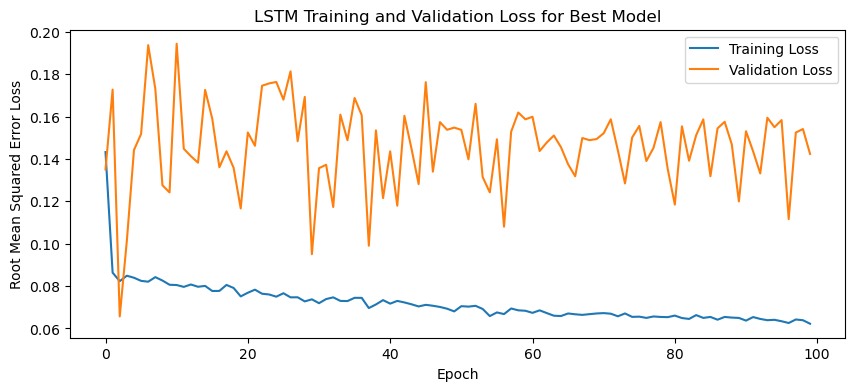

1/1 - 1s - loss: 0.0683 - 1s/epoch - 1s/step
Test Loss: 0.06832817196846008
1/1 [==============================] - 0s 31ms/step


IndexError: index 10 is out of bounds for axis 0 with size 10

In [3]:
n_batch = 1
nb_epoch = 100

def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

def mape (y_true, y_pred):
    return 100*K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def pearson (y_true, y_pred):
    return (K.square(K.mean((y_true - K.mean(y_true))*(y_pred - K.mean(y_pred)))))/(K.mean(K.square(y_true - K.mean(y_true)))*K.mean(K.square(y_pred - K.mean(y_pred))))
 
# fit an LSTM network to training data
#Adapted from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def create_model(trial, X, y, n_lag, n_seq, n_batch, nb_epoch):

    cv_accuracies = []
    
    #Parameters:
    #trial (array-like): Optuna parameters.
    #train (array-like): Target values.
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations
    #nb_epoch (int): Maximum number of epochs
    
    # Hyperparameters to be tuned by Optuna (taken from Javier Leon's dissertation 'Fruit Prices')
    lr = trial.suggest_float('lr', 1e-3, 1, log=True)
    optimizer_name = trial.suggest_categorical('optimizer', ['Adam', 'RMSprop', 'SGD'])
    if optimizer_name == 'Adam':
        optimizer = Adam(learning_rate=lr)
    elif optimizer_name == 'RMSprop':
        optimizer = RMSprop(learning_rate=lr)
    else:
        optimizer = SGD(learning_rate=lr)
    
    #Optuna will try either Rectified Linear Unit (ReLU) = max(0, x), tanh, or sigmoid functions
    activation_function = trial.suggest_categorical('activation_function', ['relu', 'tanh', 'sigmoid'])
    
    lstm_units = trial.suggest_categorical('lstm_units', [256, 512, 1024])
    dropout_rate = trial.suggest_float('dropout_rate', 0.1, 0.5)

    # design network
    model = Sequential()
    model.add(LSTM(lstm_units, return_sequences=True, batch_input_shape=(n_batch, X.shape[1], X.shape[2]), stateful=True))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units))
    model.add(Dropout(dropout_rate))
    model.add(Dense(256, input_dim=y.shape[1], activation=activation_function))
    model.add(Dense(128, activation=activation_function))
    model.add(Dense(n_seq))
    model.compile(loss=rmse, optimizer=optimizer)
        
    return model

# make forecast with the CNN-LSTM best model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def forecast_lstm(model, X, n_seq, n_test):
    # reshape input pattern to [samples, timesteps, features]
    X = X.reshape(1, 1, X.shape[1])
    # make forecast
    forecast = model.predict(X)
    # convert to array
    return forecast
     
# evaluate the persistence model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def make_forecasts(model, X_test, y_test, n_lag, n_seq, n_test):
    forecasts = list()
    for i in range(len(X_test)):
        X, y = X_test[i, :], y_test[i, :]
        # make forecast
        forecast = forecast_lstm(model, X, n_seq, n_test)
        # store the forecast
        forecasts.append(forecast)
    return forecasts
     
# invert differenced forecast
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_difference(last_ob, forecast):
    # invert first forecast
    inverted = list()
    inverted.append(forecast[0] + last_ob)
    # propagate difference forecast using inverted first value
    for i in range(1, len(forecast)):
        inverted.append(forecast[i] + inverted[i-1])
    return inverted
     
# inverse data transform on forecasts
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_transform(series, forecasts, scaler, n_test, n_seq):
    inverted = list()
    for i in range(len(forecasts)):
        # create array from forecast
        forecast = forecasts[i]
        forecast = forecast.reshape(1, n_seq)
        # invert scaling
        inv_scale = scaler.inverse_transform(forecast)
        inv_scale = inv_scale[0, :]
        # invert differencing
        index = len(series) - n_test + i - 1
        last_ob = series.values[index]
        inv_diff = inverse_difference(last_ob, inv_scale)
        # store
        inverted.append(inv_diff)
    return inverted
     
# evaluate the RMSE for each forecast time step
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def evaluate_forecasts(test, forecasts, n_lag, n_seq):
    rmse_list = []
    mae_list = []
    mape_list = []
    r2_list = []
    for i in range(n_seq):
        actual = [row[i] for row in test]
        predicted = [forecast[i] for forecast in forecasts]
        rmse = sqrt(mean_squared_error(actual, predicted))
        mae = mean_absolute_error(actual, predicted)
        mse = mean_squared_error(actual, predicted)
        mape = mean_absolute_percentage_error(actual, predicted)
        r2 = r2_score(actual, predicted) 
        rmse_list.append(rmse)
        mae_list.append(mae)
        mape_list.append(mape)
        r2_list.append(r2)
        print("Month at t+"+str(i+1)+":")
        print('t+%d RMSE: %f' % ((i+1), rmse))
        print('t+%d MAE: %f' % ((i+1), mae))
        print('t+%d MAPE: %f' % ((i+1), mape))
        print('t+%d R2_SCORE: %f' % ((i+1), r2))

    return rmse_list, mae_list, mape_list, r2_list
     
# plot the forecasts in the context of the original dataset
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def plot_forecasts(series, forecasts, n_test):
    # plot the entire dataset in blue
    plt.plot(series.values)
    # plot the forecasts in red
    for i in range(len(forecasts)):
        off_s = len(series) - n_test + i - 1
        off_e = off_s + len(forecasts[i]) + 1
        xaxis = [x for x in range(off_s, off_e)]
        yaxis = [series.values[off_s]] + forecasts[i]
        plt.plot(xaxis, yaxis, color='red')
    # show the plot
    plt.show()
    
def objective(trial):
    
    cv_accuracies = []
        
    for i in range(5):
        train1 = train[i]
        test1 = test[i]
        validation1 = validation[i]

        X, y = train1[:, 0:-n_seq], train1[:, -n_seq:]
        X_test, y_test = test1[:, 0:-n_seq], test1[:, -n_seq:]
        X_val, y_val = validation1[:, 0:-n_seq], validation1[:, -n_seq:]
        X = X.reshape(X.shape[0], 1, X.shape[1])
        X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
        X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])
    
        model = create_model(trial, X, y, n_lag, n_seq, n_batch, nb_epoch)

        history = model.fit(X, y, validation_data=(X_val, y_val), epochs=nb_epoch, verbose=0)

        cv_accuracy = model.evaluate(X_test, y_test, verbose=0)
    
        loss = history.history['val_loss'][-1]
    
        # Plotting the training and validation loss
        #plt.figure(figsize=(10, 4))
        #plt.plot(history.history['loss'], label='Training Loss')
        #plt.plot(history.history['val_loss'], label='Validation Loss')
        #title1 = "LSTM Training and Validation Loss for Fold " + str(i+1)
        #plt.title(title1)
        #plt.xlabel('Epoch')
        #plt.ylabel('Root Mean Squared Error Loss')
        #plt.legend()
        #plt.show()
            
        cv_accuracies.append(cv_accuracy)
    
    print("Cross Validation Accuracies:")
    print(cv_accuracies)
    print("Mean Cross Validation Accuracy:")
    print(np.mean(cv_accuracies))
    print("Standard Deviation of Cross Validation Accuracy:")
    print(np.std(cv_accuracies))
        
    return np.mean(cv_accuracies)

n_batch = 1
nb_epoch = 100

# optimize and fit model
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=100)
print('Number of finished trials:', len(study.trials))

print('Best trial:', study.best_trial.params)
best_params = study.best_params
print("Best hyperparameters: ", best_params)

for i in range(5):
    print("Fold "+str(i+1)+":")
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]

    X, y = train1[:, 0:-n_seq], train1[:, -n_seq:]
    X_test, y_test = test1[:, 0:-n_seq], test1[:, -n_seq:]
    X_val, y_val = validation1[:, 0:-n_seq], validation1[:, -n_seq]

    dataset_df = pd.DataFrame(val_y[i])
    dataset_df = dataset_df.iloc[0:10, :]
    dataset = dataset_df.values

    series = pd.Series(dataset[:, 0]) # Using first column (specific_humidity)
    
    X = X.reshape(X.shape[0], 1, X.shape[1])
    X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
    X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])

    best_model = create_model(optuna.trial.FixedTrial(best_params), X, y, n_lag, n_seq, n_batch, nb_epoch)
    history=best_model.fit(X, y, epochs=nb_epoch, batch_size=n_batch, validation_data=(X_val, y_val))

    # Plotting the training and validation loss
    plt.figure(figsize=(10, 4))
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    title1 = "LSTM Training and Validation Loss for Best Model"
    plt.title(title1)
    plt.xlabel('Epoch')
    plt.ylabel('Root Mean Squared Error Loss')
    plt.legend()
    plt.show()

    # Evaluate the model
    loss = best_model.evaluate(X_test, y_test, verbose=2)
    print(f'Test Loss: {loss}')

    # make forecasts
    forecasts = make_forecasts(best_model, X_test, y_test, n_lag, n_seq, n_test)
    
    # inverse transform forecasts and test
    forecasts = inverse_transform(series, forecasts, scaler[i], n_test+2, n_seq)
    actual = [row[-n_seq:] for row in test1]
    actual = inverse_transform(series, actual, scaler[i], n_test+2, n_seq)

    rmse_list = [] # list stores root mean squared errors for each future time prediction
    mae_list = [] # list stores root mean squared errors for each future time prediction
    mape_list = [] # list stores root mean squared errors for each future time prediction
    r2_list = [] # list stores root mean squared errors for each future time prediction
    
    # evaluate forecasts
    rmse_list, mae_list, mape_list, r2_list = evaluate_forecasts(actual, forecasts, n_lag, n_seq)

    for j in range(len(X_test)):
        print("Weather Station "+str(j+1)+":")
        dataset_df = pd.DataFrame(y_test[j].flatten())
        dataset = dataset_df.values
        dataset = dataset[:, 0]
        dataset = np.array(dataset).reshape(-1, 1)
        dataset = dataset.flatten()
        dataset = pd.DataFrame(dataset)
        series = scaler[i].inverse_transform(dataset)
        series = pd.Series(series.flatten())

    # plot forecasts
    plot_forecasts(series, forecasts, 1)
    
    best_model.summary()

    # Print out table of actual and predicted values for each weather station
    for j in range(11):
        print("Weather Station "+str(j+1)+":")
        print("Actual Temp\tPredicted Temp\tDifference")
        print("-----------\t--------------\t----------")
        for k in range(n_seq):
            diff = forecasts[j][k] - actual[j][k]
            print(f"{actual[j][k]:.2f}\t\t{forecasts[j][k]:.2f}\t\t{diff:.2f}")

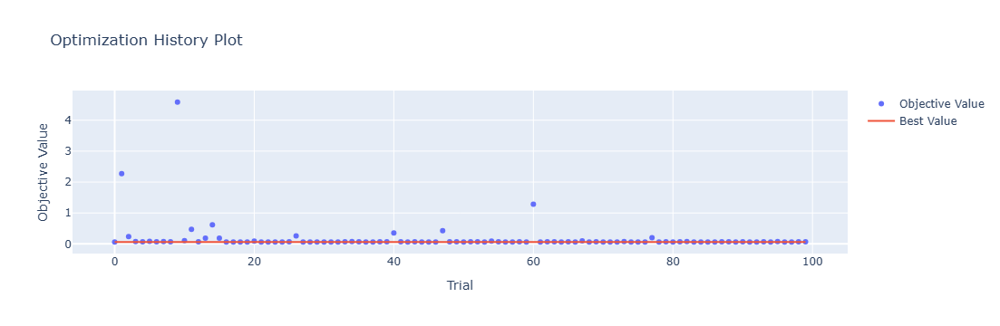

In [4]:
optuna.visualization.plot_optimization_history(study)

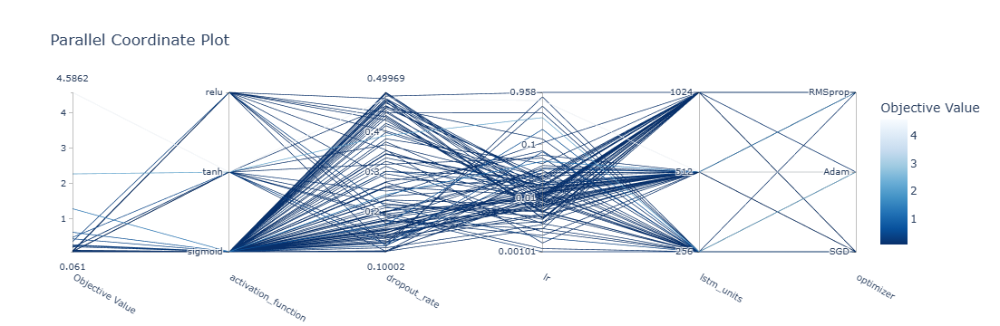

In [5]:
optuna.visualization.plot_parallel_coordinate(study)

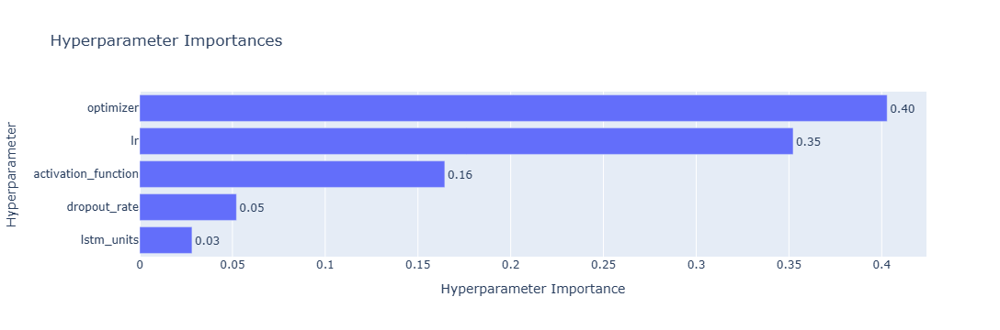

In [6]:
optuna.visualization.plot_param_importances(study)

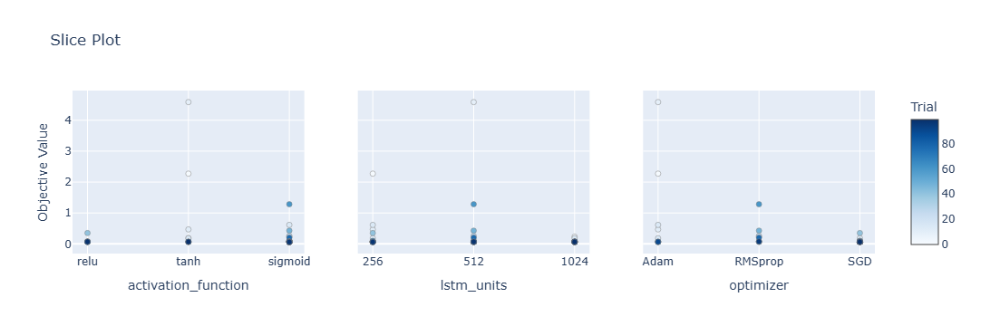

In [7]:
optuna.visualization.plot_slice(study, params=['optimizer', 'activation_function', 'lstm_units'])

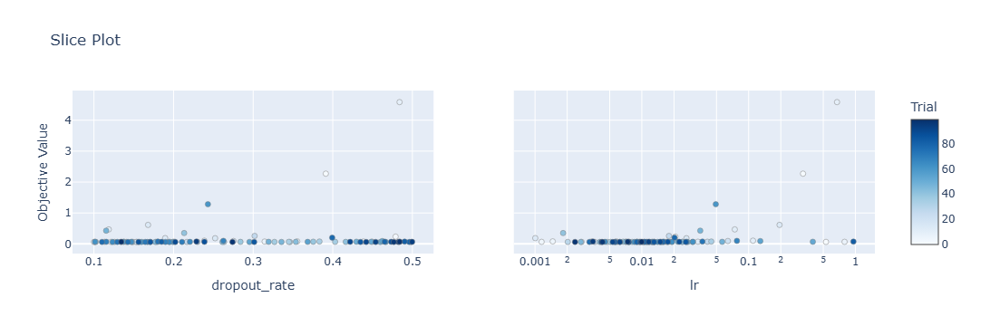

In [8]:
optuna.visualization.plot_slice(study, params=['lr', 'dropout_rate'])

Epoch 1/100
84/84 [==============================] - 31s 110ms/step - loss: 0.1216 - accuracy: 0.6071 - mae: 0.0994 - rmse: 0.1216 - mape: 22.1686 - pearson: 0.6501 - val_loss: 0.0979 - val_accuracy: 0.8000 - val_mae: 0.0769 - val_rmse: 0.0979 - val_mape: 16.4931 - val_pearson: 0.6759
Epoch 2/100
84/84 [==============================] - 4s 43ms/step - loss: 0.0853 - accuracy: 0.6071 - mae: 0.0672 - rmse: 0.0853 - mape: 15.3098 - pearson: 0.6988 - val_loss: 0.0763 - val_accuracy: 0.2000 - val_mae: 0.0579 - val_rmse: 0.0763 - val_mape: 13.8092 - val_pearson: 0.7265
Epoch 3/100
84/84 [==============================] - 6s 67ms/step - loss: 0.0848 - accuracy: 0.6071 - mae: 0.0681 - rmse: 0.0848 - mape: 15.5887 - pearson: 0.7027 - val_loss: 0.0729 - val_accuracy: 0.2000 - val_mae: 0.0593 - val_rmse: 0.0729 - val_mape: 12.3638 - val_pearson: 0.7411
Epoch 4/100
84/84 [==============================] - 4s 54ms/step - loss: 0.0843 - accuracy: 0.6310 - mae: 0.0667 - rmse: 0.0843 - mape: 15.3202 -

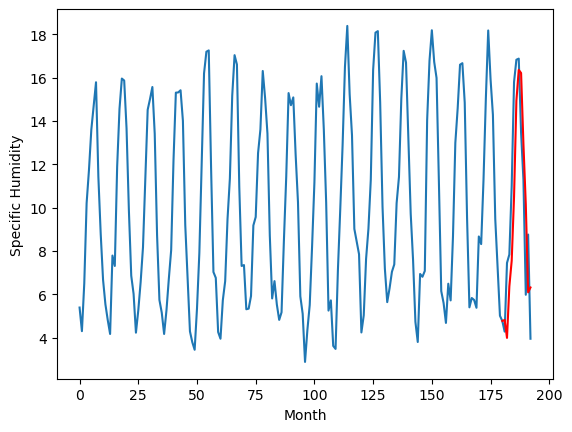

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.90		4.51		-0.39
5.61		3.68		-1.93
7.82		6.05		-1.77
8.04		7.23		-0.81
10.53		10.19		-0.34
15.28		14.62		-0.66
16.08		16.05		-0.03
16.24		15.90		-0.34
14.08		12.62		-1.46
11.00		9.85		-1.15
5.34		5.78		0.44
8.98		6.00		-2.98
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[7.05, 4.50510084182024, 3.6780334666371344, 6.050528164207935, 7.232941384613514, 10.189555402100087, 14.624757523834706, 16.04837452918291, 15.904803122580052, 12.6191831484437, 9.852054680883885, 5.775104130804539, 6.001915718615056]


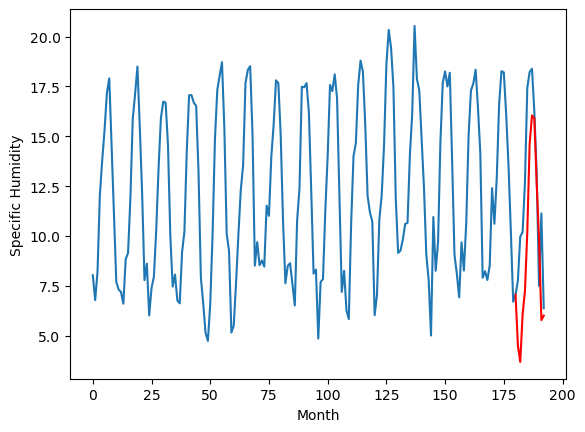

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.82		4.39		-0.43
4.97		3.57		-1.40
6.82		5.94		-0.88
7.06		7.12		0.06
9.82		10.08		0.26
14.44		14.51		0.07
16.35		15.94		-0.41
16.55		15.79		-0.76
13.55		12.50		-1.05
10.83		9.73		-1.10
4.96		5.65		0.69
7.36		5.88		-1.48
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[5.06, 4.394994976520539, 3.5683882856369022, 5.937182965278626, 7.121484341621399, 10.078366103172304, 14.512405219078065, 15.935738863945009, 15.786104249358178, 12.498791980147363, 9.731453227400781, 5.652483748793603, 5.878391387462617]


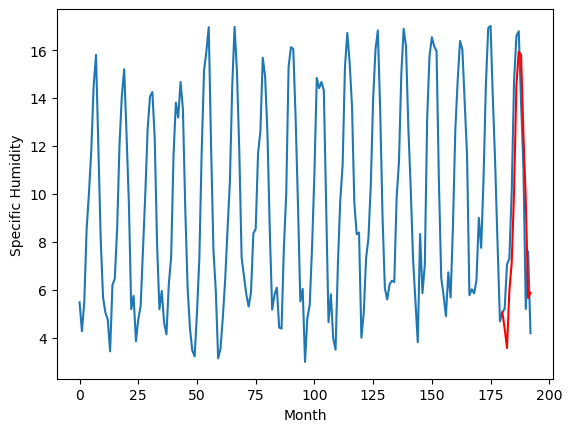

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.21		4.09		-0.12
4.12		3.27		-0.85
7.57		5.64		-1.93
8.14		6.83		-1.31
11.65		9.78		-1.87
15.55		14.22		-1.33
16.39		15.64		-0.75
16.01		15.49		-0.52
13.70		12.21		-1.49
11.27		9.44		-1.83
5.06		5.37		0.31
8.11		5.59		-2.52
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[7.05, 4.094421188682317, 3.268144647926092, 5.6428175376355645, 6.827380816787481, 9.782562177032233, 14.218184869140387, 15.639354865401984, 15.493157173842192, 12.207472349852324, 9.438491846770049, 5.365483309477568, 5.593515943139792]


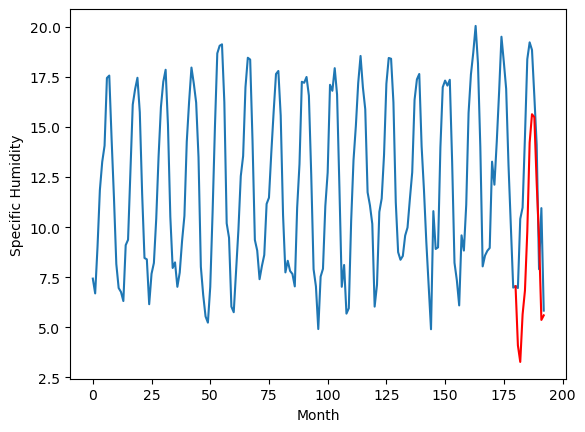

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.32		5.35		0.03
4.92		4.52		-0.40
7.76		6.89		-0.87
9.16		8.08		-1.08
13.17		11.04		-2.13
16.86		15.47		-1.39
17.57		16.89		-0.68
17.49		16.74		-0.75
13.26		13.46		0.20
11.17		10.69		-0.48
6.95		6.62		-0.33
9.71		6.85		-2.86
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[5.2, 5.3491821320354935, 4.52014929369092, 6.894007030278444, 8.080623808652163, 11.036958399564028, 15.471046629697085, 16.891090336591006, 16.7430968464911, 13.458700198084117, 10.69115831270814, 6.621447581201792, 6.848830539137126]


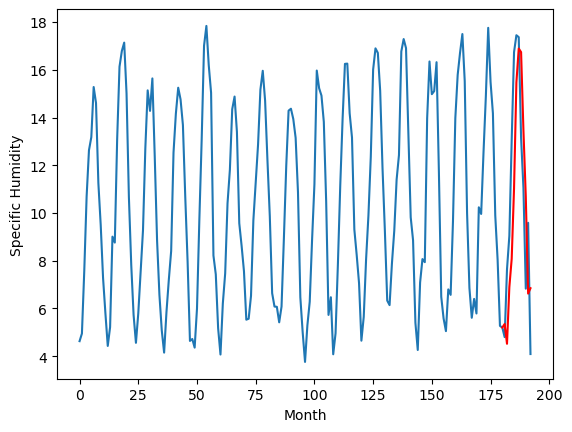

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
7.42		7.98		0.56
8.01		7.16		-0.85
9.58		9.53		-0.05
10.59		10.72		0.13
13.09		13.68		0.59
18.35		18.11		-0.24
19.47		19.53		0.06
20.63		19.38		-1.25
16.54		16.09		-0.45
14.22		13.33		-0.89
8.96		9.25		0.29
10.38		9.48		-0.90
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[5.16, 7.984950504004955, 7.160653493106365, 9.533803603351116, 10.71788444250822, 13.675707003772258, 18.108256480395795, 19.526044628322126, 19.379366925656797, 16.093519261777402, 13.32624965041876, 9.24918322890997, 9.47660196453333]


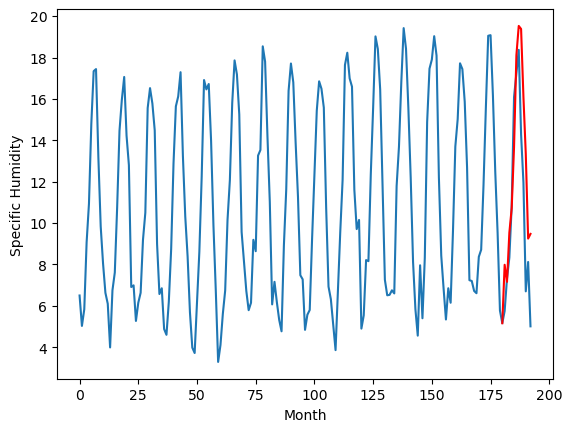

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.33		5.43		0.10
5.38		4.61		-0.77
6.97		6.98		0.01
7.57		8.17		0.60
10.57		11.12		0.55
14.95		15.56		0.61
16.39		16.98		0.59
16.92		16.83		-0.09
13.60		13.54		-0.06
11.49		10.77		-0.72
5.74		6.69		0.95
7.58		6.92		-0.66
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[4.05, 5.43232567563653, 4.607877805382014, 6.979036405235529, 8.165374710708857, 11.121951058059931, 15.55624814286828, 16.975618913322688, 16.827190845757723, 13.539012640267611, 10.77137657955289, 6.693318813592196, 6.919932215958834]


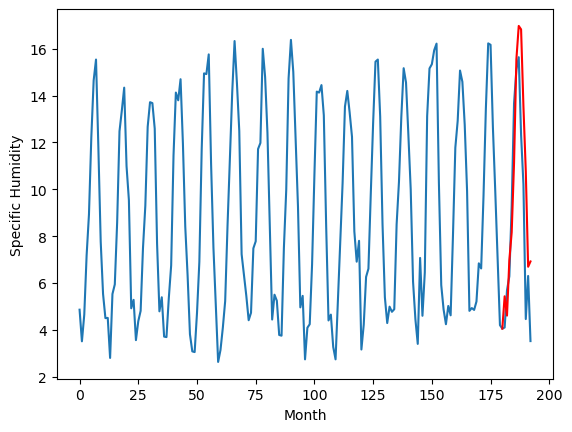

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
7.12		7.38		0.26
7.15		6.56		-0.59
8.77		8.93		0.16
9.47		10.12		0.65
12.49		13.07		0.58
16.76		17.50		0.74
18.26		18.92		0.66
18.54		18.77		0.23
15.05		15.48		0.43
13.17		12.71		-0.46
7.38		8.64		1.26
9.15		8.86		-0.29
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.64, 7.382605079859495, 6.559950117319822, 8.929691318720579, 10.116600040644407, 13.071408991068601, 17.50462937757373, 18.922848705500364, 18.771446798294782, 15.481875989884138, 12.71484646603465, 8.635416839569807, 8.862382147759199]


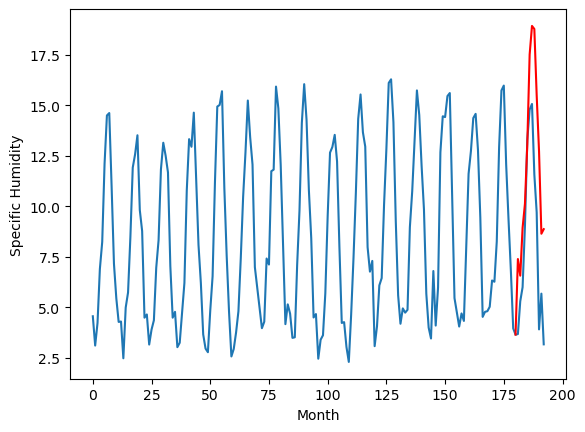

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.40		4.59		0.19
3.72		3.76		0.04
6.78		6.13		-0.65
7.51		7.33		-0.18
10.42		10.28		-0.14
15.40		14.72		-0.68
16.90		16.13		-0.77
17.09		15.98		-1.11
13.28		12.69		-0.59
10.86		9.92		-0.94
5.57		5.85		0.28
7.16		6.07		-1.09
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.46, 4.585591969192028, 3.7628572556376456, 6.134095964133739, 7.3263723227381705, 10.281026777923106, 14.715106424987315, 16.133577165305613, 15.981661898195743, 12.689880472719668, 9.924064261019229, 5.847541433870791, 6.072995645105838]


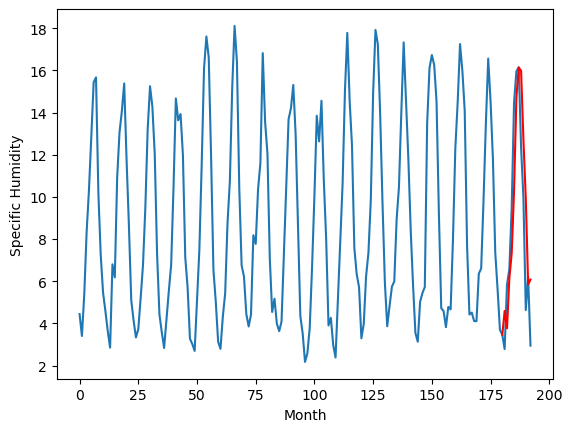

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
6.17		6.46		0.29
5.72		5.63		-0.09
7.52		8.01		0.49
8.84		9.20		0.36
10.93		12.15		1.22
15.70		16.58		0.88
16.63		18.00		1.37
17.05		17.85		0.80
13.88		14.56		0.68
12.57		11.80		-0.77
7.05		7.72		0.67
7.89		7.94		0.05
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.93, 6.455069903284311, 5.634697083383799, 8.006619337946177, 9.198710087686777, 12.151162032037973, 16.584729555994272, 18.001285079866648, 17.853711176663637, 14.56206564977765, 11.796894360333681, 7.720382500439882, 7.944871861487627]


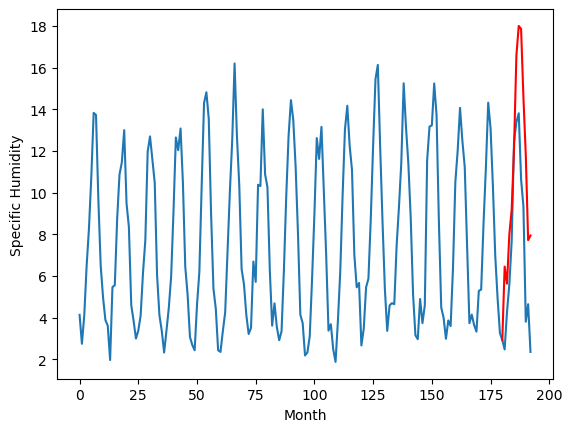

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.48		4.81		0.33
3.74		3.99		0.25
5.36		6.37		1.01
6.96		7.56		0.60
8.48		10.51		2.03
13.61		14.94		1.33
14.68		16.36		1.68
15.17		16.22		1.05
11.55		12.92		1.37
10.56		10.16		-0.40
5.71		6.08		0.37
5.71		6.31		0.60
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.74, 4.814161606729031, 3.994513877332211, 6.3709472498297695, 7.558738716542721, 10.509242781102657, 14.943816431462764, 16.36147309154272, 16.217315324246883, 12.923672803342342, 10.158553250730037, 6.082826264798641, 6.3073252967]


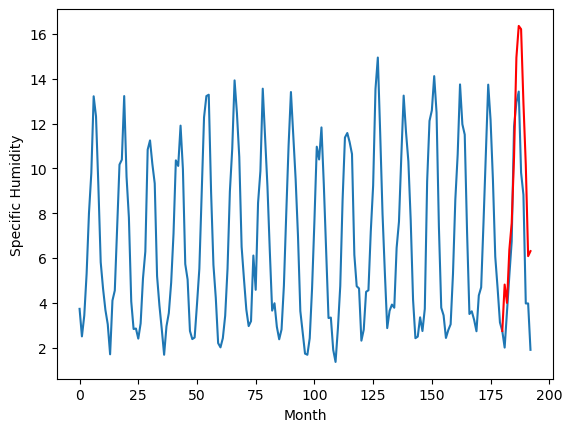

RangeIndex(start=1, stop=12, step=1)
[4.62, 4.899999999999999, 4.820000000000001, 4.209999999999998, 5.32, 7.42, 5.33, 7.119999999999999, 4.4, 6.170000000000001, 4.48]
[4.816557303667069, 4.50510084182024, 4.394994976520539, 4.094421188682317, 5.3491821320354935, 7.984950504004955, 5.43232567563653, 7.382605079859495, 4.585591969192028, 6.455069903284311, 4.814161606729031]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    4.62   4.816557
1                 1    4.90   4.505101
2                 2    4.82   4.394995
3                 3    4.21   4.094421
4                 4    5.32   5.349182
5                 5    7.42   7.984951
6                 6    5.33   5.432326
7                 7    7.12   7.382605
8                 8    4.40   4.585592
9                 9    6.17   6.455070
10               10    4.48   4.814162


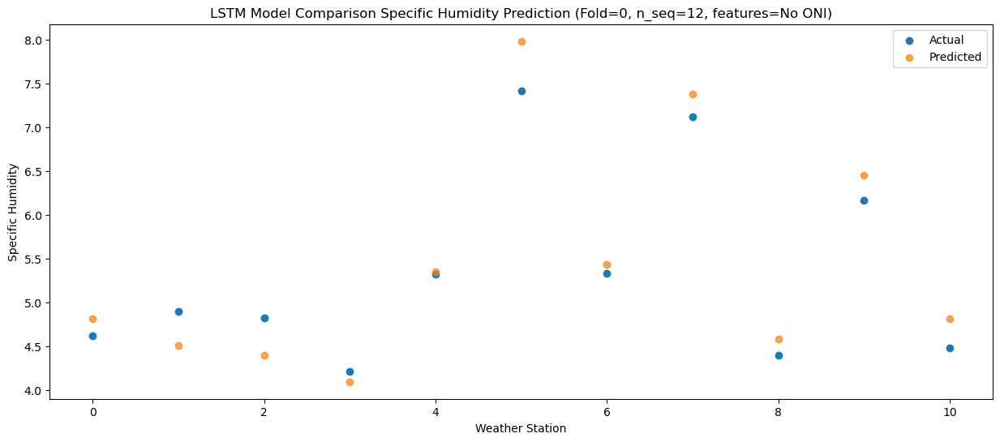

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    4.13   3.989608
1                 1    5.61   3.678033
2                 2    4.97   3.568388
3                 3    4.12   3.268145
4                 4    4.92   4.520149
5                 5    8.01   7.160653
6                 6    5.38   4.607878
7                 7    7.15   6.559950
8                 8    3.72   3.762857
9                 9    5.72   5.634697
10               10    3.74   3.994514


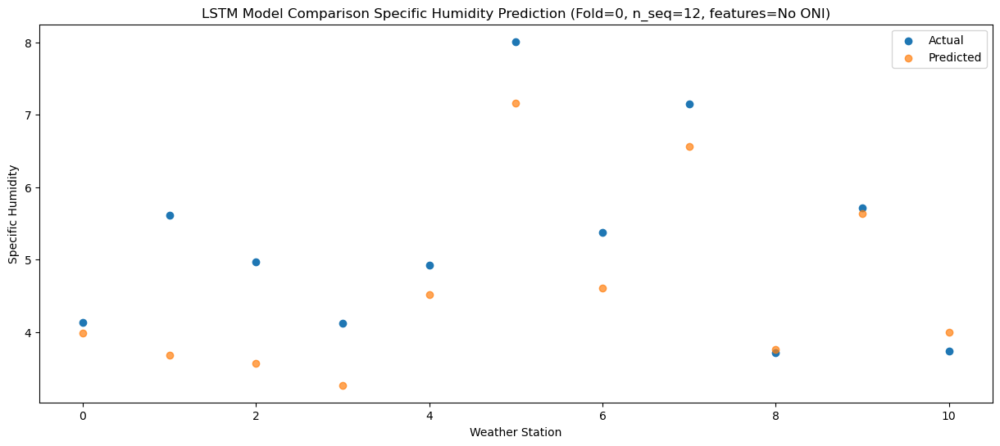

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    7.30   6.365484
1                 1    7.82   6.050528
2                 2    6.82   5.937183
3                 3    7.57   5.642818
4                 4    7.76   6.894007
5                 5    9.58   9.533804
6                 6    6.97   6.979036
7                 7    8.77   8.929691
8                 8    6.78   6.134096
9                 9    7.52   8.006619
10               10    5.36   6.370947


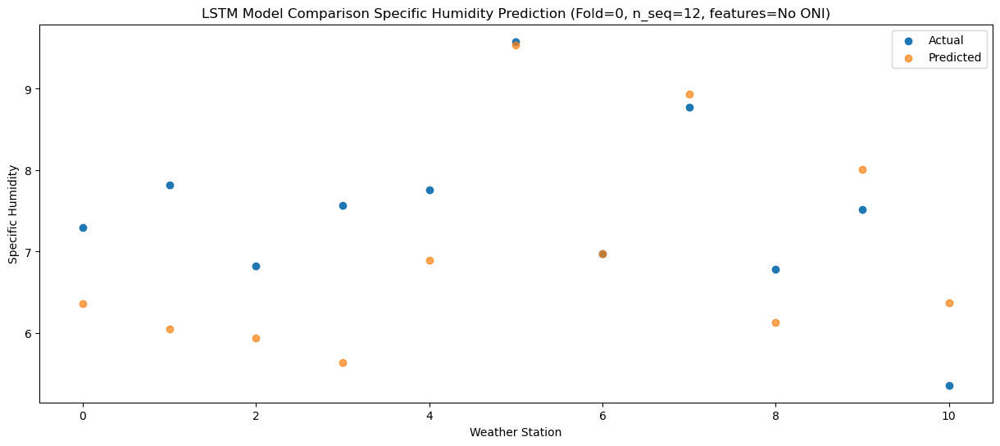

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0    7.69   7.550995
1                 1    8.04   7.232941
2                 2    7.06   7.121484
3                 3    8.14   6.827381
4                 4    9.16   8.080624
5                 5   10.59  10.717884
6                 6    7.57   8.165375
7                 7    9.47  10.116600
8                 8    7.51   7.326372
9                 9    8.84   9.198710
10               10    6.96   7.558739


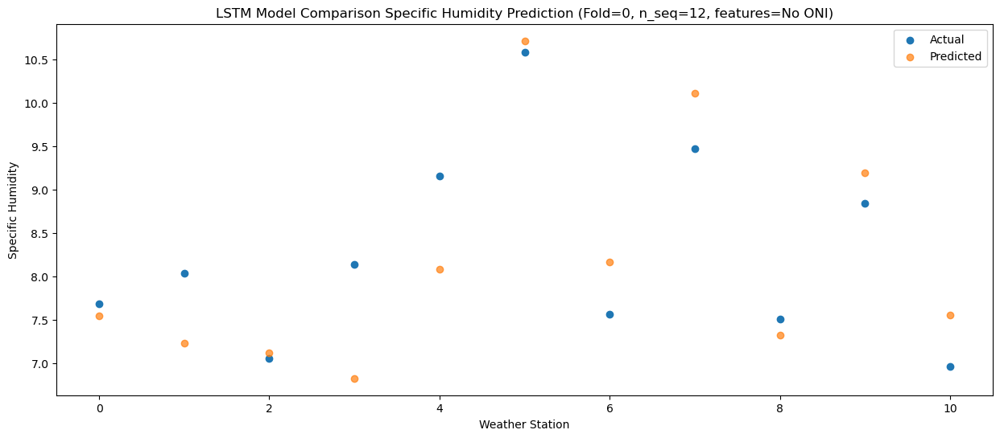

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   10.84  10.503680
1                 1   10.53  10.189555
2                 2    9.82  10.078366
3                 3   11.65   9.782562
4                 4   13.17  11.036958
5                 5   13.09  13.675707
6                 6   10.57  11.121951
7                 7   12.49  13.071409
8                 8   10.42  10.281027
9                 9   10.93  12.151162
10               10    8.48  10.509243


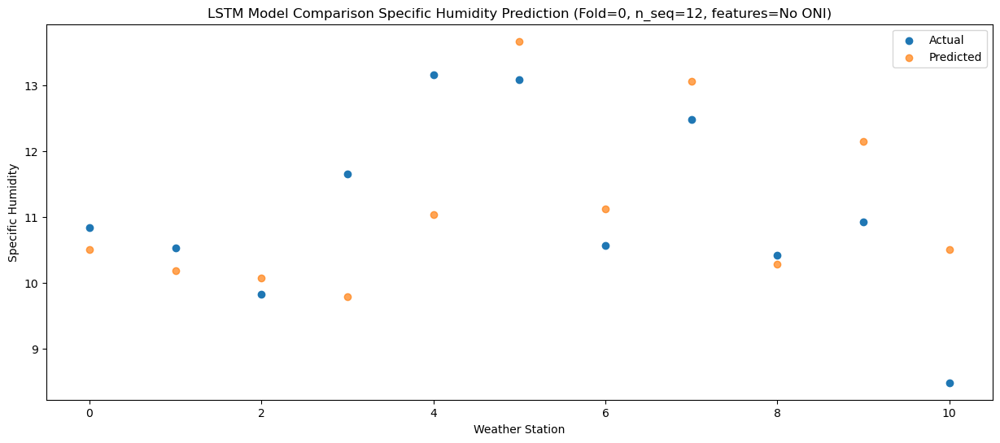

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   15.65  14.936205
1                 1   15.28  14.624758
2                 2   14.44  14.512405
3                 3   15.55  14.218185
4                 4   16.86  15.471047
5                 5   18.35  18.108256
6                 6   14.95  15.556248
7                 7   16.76  17.504629
8                 8   15.40  14.715106
9                 9   15.70  16.584730
10               10   13.61  14.943816


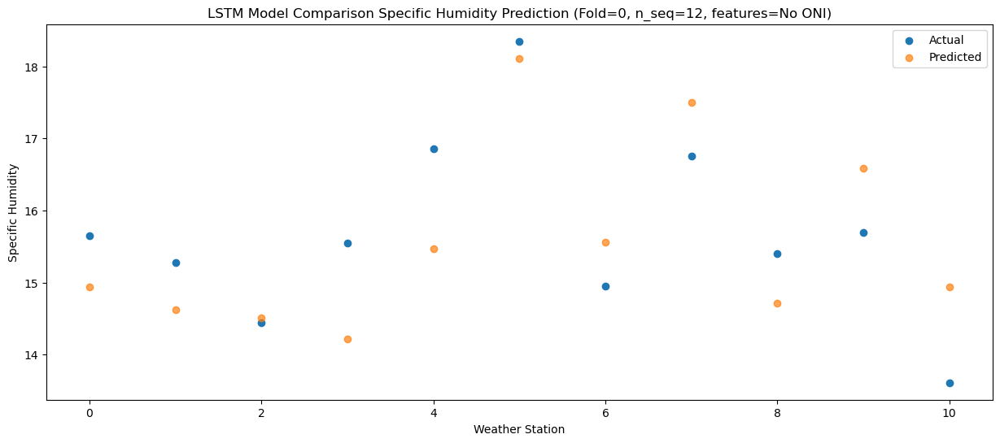

Predictions for (t+6):
    Weather_Station  Actual  Predicted
0                 0   16.68  16.360528
1                 1   16.08  16.048375
2                 2   16.35  15.935739
3                 3   16.39  15.639355
4                 4   17.57  16.891090
5                 5   19.47  19.526045
6                 6   16.39  16.975619
7                 7   18.26  18.922849
8                 8   16.90  16.133577
9                 9   16.63  18.001285
10               10   14.68  16.361473


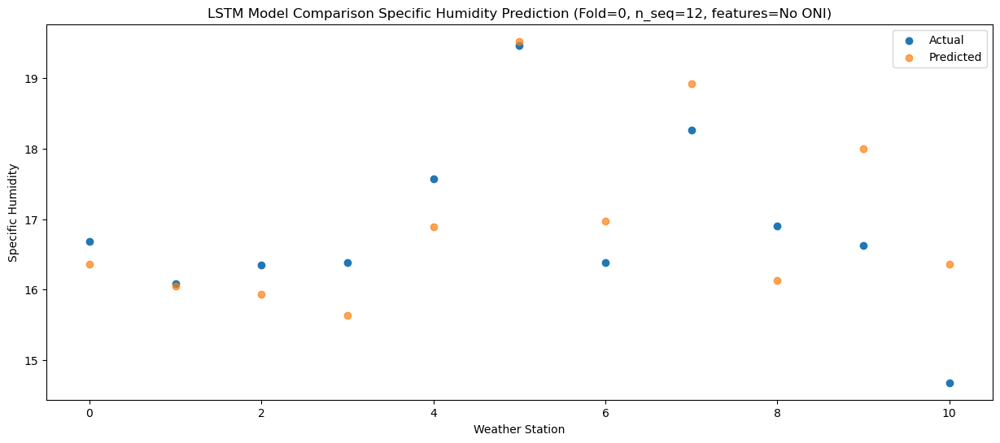

Predictions for (t+7):
    Weather_Station  Actual  Predicted
0                 0   16.73  16.216655
1                 1   16.24  15.904803
2                 2   16.55  15.786104
3                 3   16.01  15.493157
4                 4   17.49  16.743097
5                 5   20.63  19.379367
6                 6   16.92  16.827191
7                 7   18.54  18.771447
8                 8   17.09  15.981662
9                 9   17.05  17.853711
10               10   15.17  16.217315


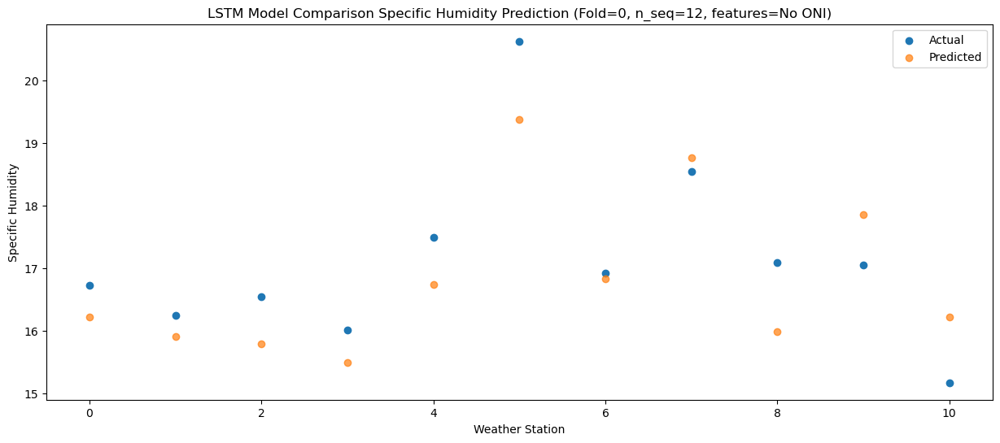

Predictions for (t+8):
    Weather_Station  Actual  Predicted
0                 0   13.31  12.930934
1                 1   14.08  12.619183
2                 2   13.55  12.498792
3                 3   13.70  12.207472
4                 4   13.26  13.458700
5                 5   16.54  16.093519
6                 6   13.60  13.539013
7                 7   15.05  15.481876
8                 8   13.28  12.689880
9                 9   13.88  14.562066
10               10   11.55  12.923673


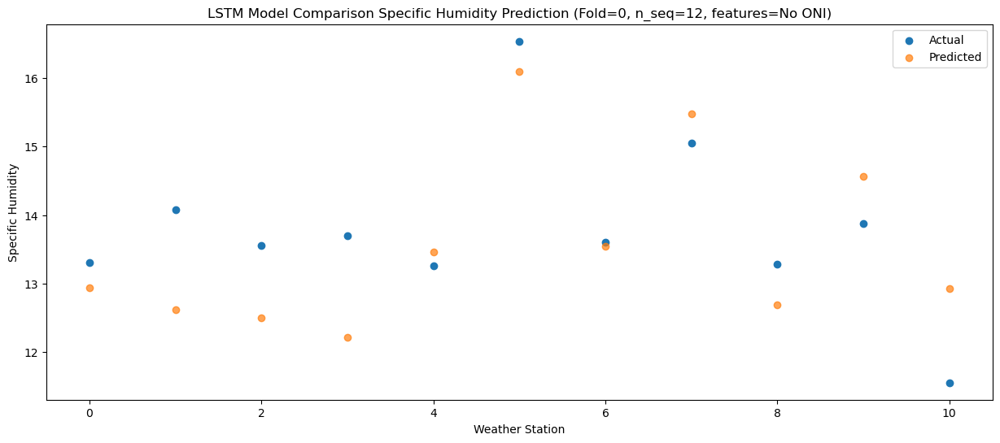

Predictions for (t+9):
    Weather_Station  Actual  Predicted
0                 0   11.13  10.163742
1                 1   11.00   9.852055
2                 2   10.83   9.731453
3                 3   11.27   9.438492
4                 4   11.17  10.691158
5                 5   14.22  13.326250
6                 6   11.49  10.771377
7                 7   13.17  12.714846
8                 8   10.86   9.924064
9                 9   12.57  11.796894
10               10   10.56  10.158553


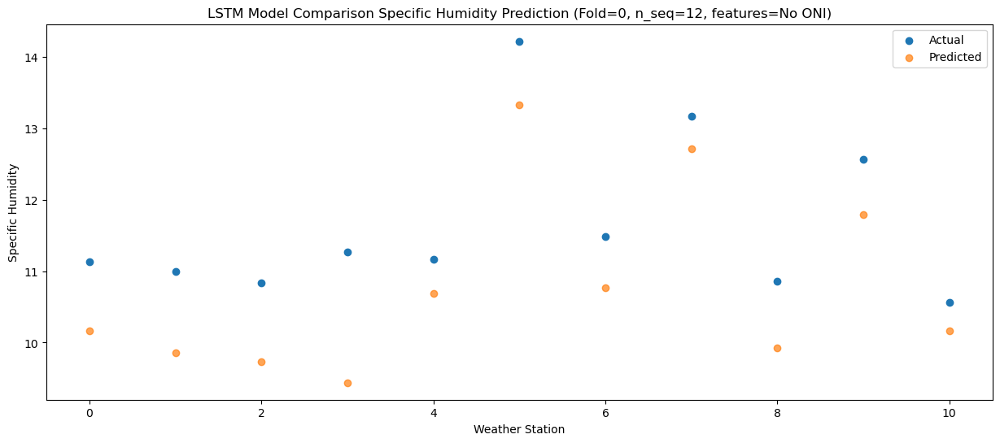

Predictions for (t+10):
    Weather_Station  Actual  Predicted
0                 0    5.83   6.090370
1                 1    5.34   5.775104
2                 2    4.96   5.652484
3                 3    5.06   5.365483
4                 4    6.95   6.621448
5                 5    8.96   9.249183
6                 6    5.74   6.693319
7                 7    7.38   8.635417
8                 8    5.57   5.847541
9                 9    7.05   7.720383
10               10    5.71   6.082826


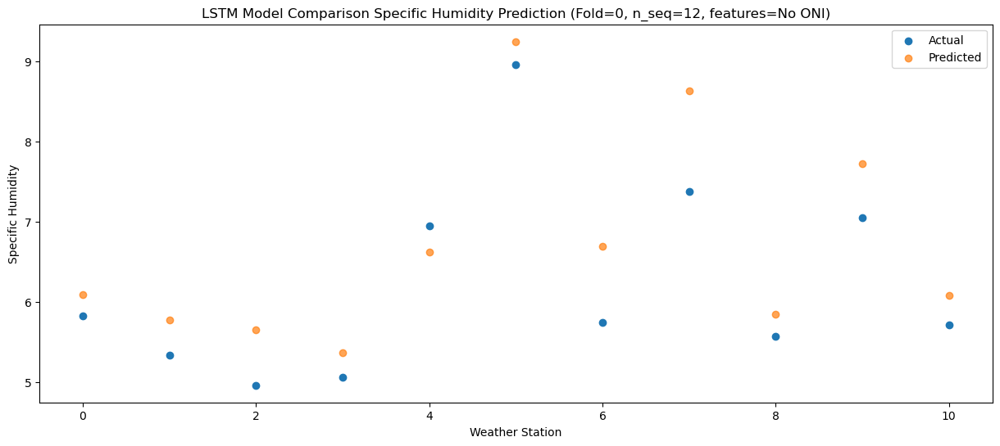

Predictions for (t+11):
    Weather_Station  Actual  Predicted
0                 0    8.61   6.316098
1                 1    8.98   6.001916
2                 2    7.36   5.878391
3                 3    8.11   5.593516
4                 4    9.71   6.848831
5                 5   10.38   9.476602
6                 6    7.58   6.919932
7                 7    9.15   8.862382
8                 8    7.16   6.072996
9                 9    7.89   7.944872
10               10    5.71   6.307325


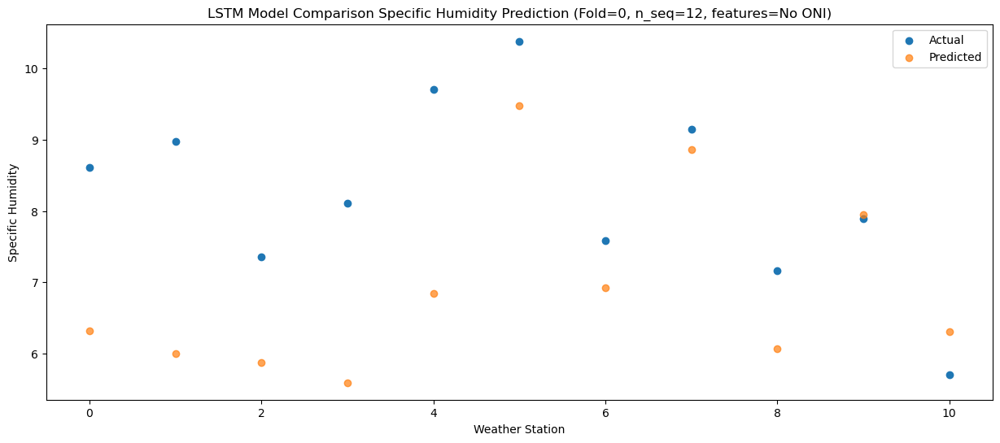

Model: "sequential_501"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_1002 (LSTM)            (1, 1, 256)               2279424   
                                                                 
 dropout_1002 (Dropout)      (1, 1, 256)               0         
                                                                 
 lstm_1003 (LSTM)            (1, 256)                  525312    
                                                                 
 dropout_1003 (Dropout)      (1, 256)                  0         
                                                                 
 dense_1503 (Dense)          (1, 256)                  65792     
                                                                 
 dense_1504 (Dense)          (1, 128)                  32896     
                                                                 
 dense_1505 (Dense)          (1, 12)                

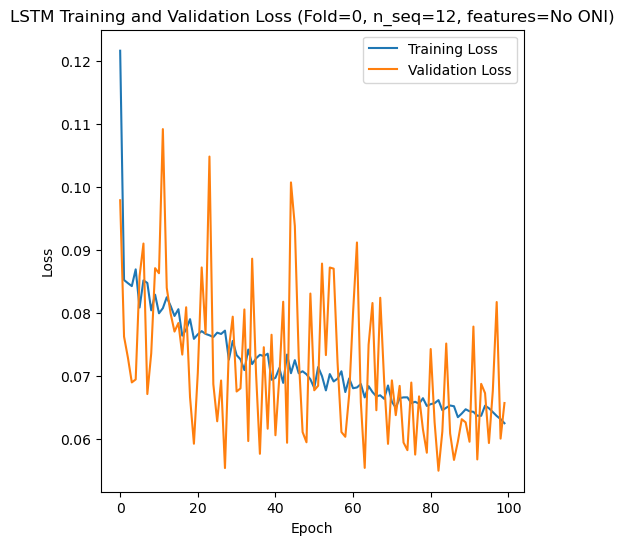

Epoch 1/100
84/84 [==============================] - 24s 91ms/step - loss: 0.1755 - accuracy: 0.5952 - mae: 0.1351 - rmse: 0.1755 - mape: 29.8974 - pearson: 0.5920 - val_loss: 0.0942 - val_accuracy: 0.7000 - val_mae: 0.0699 - val_rmse: 0.0942 - val_mape: 17.6124 - val_pearson: 0.7311
Epoch 2/100
84/84 [==============================] - 3s 33ms/step - loss: 0.0823 - accuracy: 0.6667 - mae: 0.0653 - rmse: 0.0823 - mape: 14.9549 - pearson: 0.7258 - val_loss: 0.0901 - val_accuracy: 0.7000 - val_mae: 0.0704 - val_rmse: 0.0901 - val_mape: 15.1384 - val_pearson: 0.7110
Epoch 3/100
84/84 [==============================] - 2s 30ms/step - loss: 0.0798 - accuracy: 0.7262 - mae: 0.0634 - rmse: 0.0798 - mape: 14.6581 - pearson: 0.7295 - val_loss: 0.0646 - val_accuracy: 0.7000 - val_mae: 0.0509 - val_rmse: 0.0646 - val_mape: 11.8234 - val_pearson: 0.7685
Epoch 4/100
84/84 [==============================] - 3s 33ms/step - loss: 0.0818 - accuracy: 0.7143 - mae: 0.0648 - rmse: 0.0818 - mape: 14.8327 - 

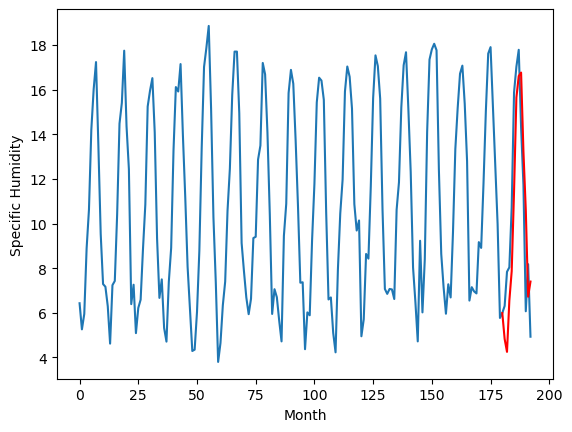

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.34		4.34		-0.00
4.53		3.76		-0.77
6.06		6.06		0.00
6.42		7.38		0.96
9.34		10.96		1.62
13.32		15.17		1.85
15.19		16.13		0.94
15.40		16.29		0.89
12.45		12.75		0.30
10.41		10.13		-0.28
4.82		6.24		1.42
6.99		6.92		-0.07
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[4.15, 4.339161136820913, 3.7639298231154683, 6.064173677638173, 7.383225777819753, 10.960570433810354, 15.165907481387258, 16.133382597640157, 16.288409257009626, 12.752213978841901, 10.134531283453107, 6.240226769521833, 6.920187974050641]


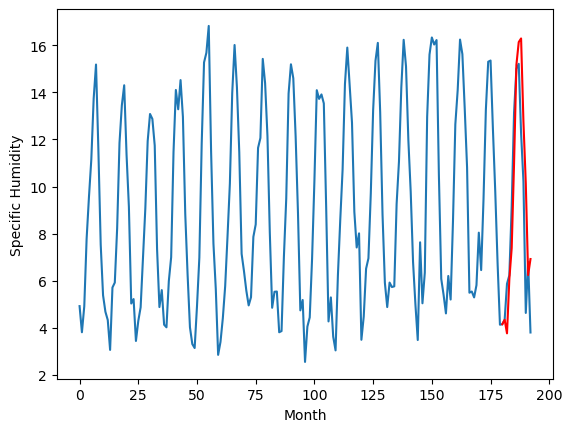

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.22		3.09		-0.13
3.22		2.51		-0.71
5.84		4.81		-1.03
5.55		6.13		0.58
8.39		9.71		1.32
12.91		13.92		1.01
14.50		14.89		0.39
14.72		15.04		0.32
11.96		11.51		-0.45
9.21		8.89		-0.32
3.71		4.99		1.28
6.35		5.67		-0.68
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[5.12, 3.0906519216299055, 2.5134928148984907, 4.813904754519463, 6.134022347331047, 9.713108174204827, 13.917593113780022, 14.885407559275627, 15.040659479498864, 11.5053396743536, 8.888296179175377, 4.992683700919152, 5.674331001639366]


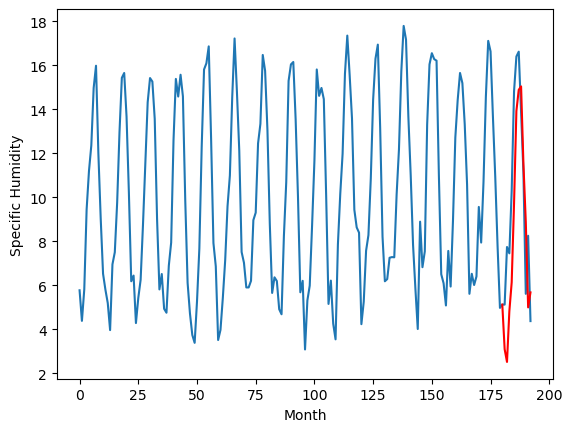

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.03		2.39		0.36
2.10		1.81		-0.29
4.74		4.11		-0.63
6.08		5.43		-0.65
9.97		9.01		-0.96
13.16		13.21		0.05
13.64		14.18		0.54
13.98		14.34		0.36
10.89		10.80		-0.09
8.64		8.18		-0.46
4.19		4.29		0.10
7.11		4.98		-2.13
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[6.35, 2.386984896734357, 1.8085235477238895, 4.107587945535779, 5.42818404443562, 9.010253441408278, 13.214612972810865, 14.183016192987562, 14.336278465464712, 10.801081922724844, 8.184453991129995, 4.293128278926016, 4.975436893180014]


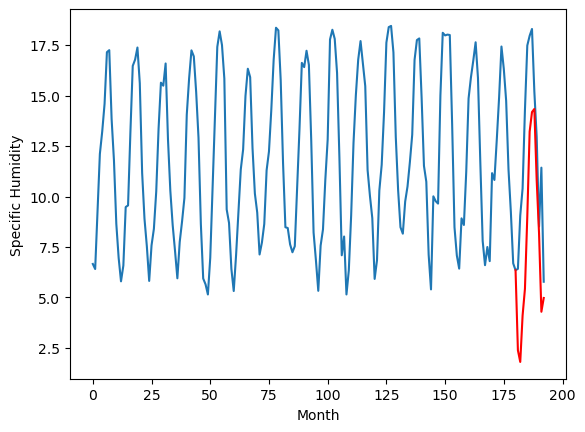

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
6.18		6.44		0.26
6.22		5.87		-0.35
8.94		8.17		-0.77
10.20		9.49		-0.71
14.23		13.07		-1.16
17.64		17.27		-0.37
17.82		18.24		0.42
17.86		18.39		0.53
14.76		14.86		0.10
12.81		12.24		-0.57
8.22		8.35		0.13
11.15		9.03		-2.12
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[6.08, 6.444160911552608, 5.865226301662624, 8.165770802013576, 9.485715302936732, 13.06683436345309, 17.27057209920138, 18.240717443935573, 18.39317825745791, 14.857846769802272, 12.238618406765163, 8.348553213588893, 9.032471510879695]


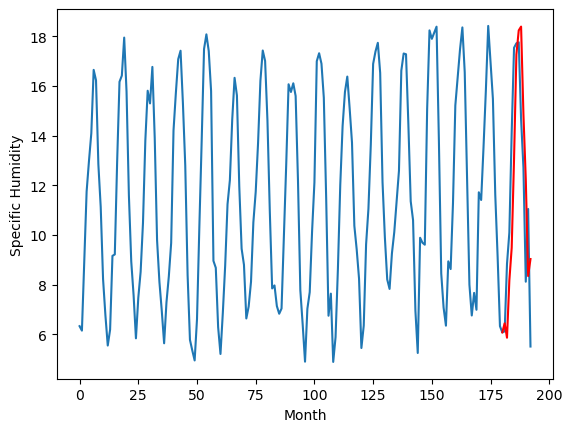

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.75		4.94		-0.81
5.12		4.36		-0.76
5.91		6.66		0.75
7.21		7.98		0.77
11.52		11.57		0.05
13.69		15.77		2.08
15.02		16.74		1.72
15.24		16.89		1.65
11.70		13.36		1.66
8.59		10.74		2.15
6.75		6.85		0.10
5.70		7.53		1.83
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.92, 4.935484443865716, 4.358221386633813, 6.658427332602441, 7.9822253930196165, 11.565008376799524, 15.770065044127405, 16.738485668860378, 16.889216889701785, 13.356510152183475, 10.737361420951785, 6.8485467332229035, 7.531209160648288]


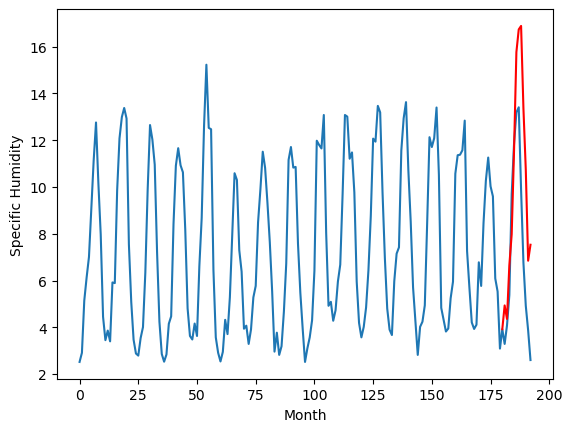

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.66		5.79		0.13
5.78		5.21		-0.57
7.34		7.52		0.18
7.96		8.84		0.88
10.89		12.42		1.53
15.24		16.62		1.38
17.74		17.60		-0.14
18.03		17.75		-0.28
14.68		14.21		-0.47
12.55		11.59		-0.96
6.62		7.70		1.08
8.49		8.38		-0.11
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[4.16, 5.7886419710516925, 5.213177126348018, 7.515515011250972, 8.839926045835018, 12.419359010159969, 16.623878758847713, 17.595664721429348, 17.74610107809305, 14.21421998411417, 11.593926128447055, 7.700390276014804, 8.382046279013156]


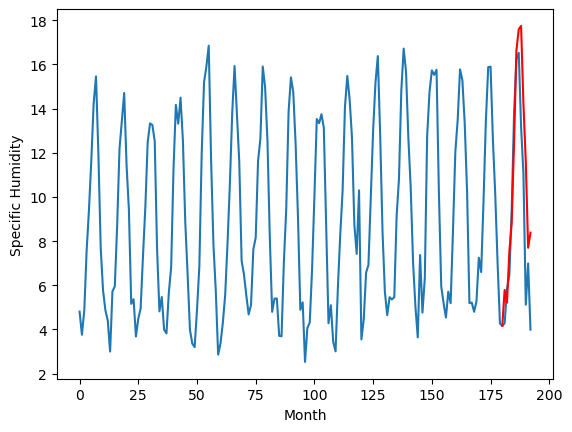

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
6.53		6.68		0.15
6.01		6.10		0.09
8.74		8.41		-0.33
9.97		9.73		-0.24
13.18		13.31		0.13
17.94		17.52		-0.42
18.57		18.49		-0.08
18.42		18.64		0.22
15.17		15.11		-0.06
12.44		12.49		0.05
7.88		8.60		0.72
9.52		9.28		-0.24
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.84, 6.676836978495121, 6.1028402557969095, 8.405742715895176, 9.731460880339146, 13.313202451765537, 17.518835138380528, 18.48945231348276, 18.6408341935277, 15.109595160782337, 12.489224057495594, 8.598299365341664, 9.280593436062336]


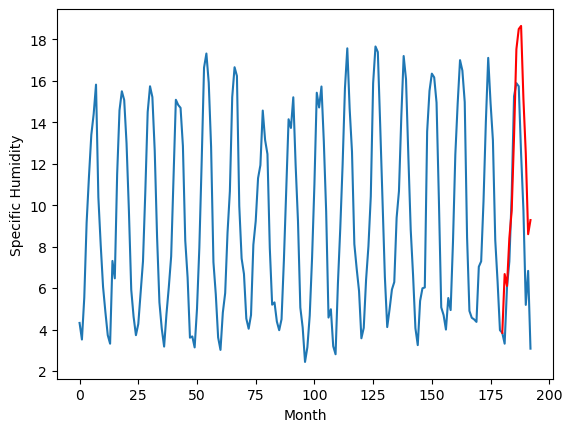

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
6.49		6.34		-0.15
5.68		5.77		0.09
8.29		8.07		-0.22
9.45		9.39		-0.06
13.67		12.98		-0.69
16.81		17.18		0.37
17.86		18.16		0.30
17.44		18.31		0.87
13.87		14.77		0.90
11.43		12.15		0.72
7.90		8.27		0.37
7.29		8.95		1.66
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.73, 6.343149652630091, 5.765787532478571, 8.066775729805231, 9.394538571983576, 12.97728269353509, 17.18348758473992, 18.15536444440484, 18.30550206258893, 14.774751311093567, 12.154169922620056, 8.26626122549176, 8.94679385975003]


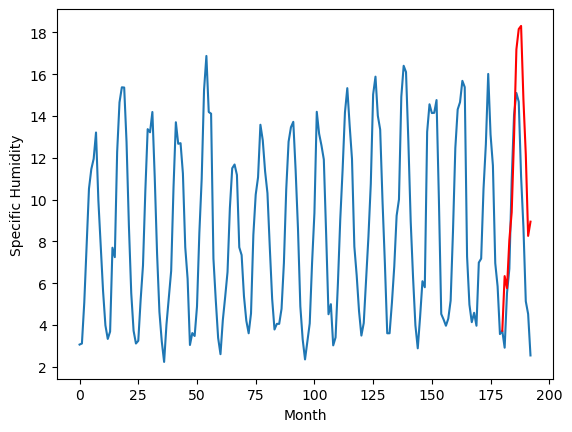

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.71		2.53		-0.18
1.97		1.95		-0.02
3.79		4.25		0.46
3.96		5.58		1.62
9.11		9.16		0.05
12.10		13.37		1.27
13.34		14.34		1.00
12.31		14.48		2.17
9.35		10.96		1.61
5.91		8.33		2.42
3.55		4.45		0.90
2.57		5.12		2.55
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.83, 2.533479326851666, 1.954891794808209, 4.253021114952862, 5.580026978142559, 9.161562794335186, 13.368674629814922, 14.336933785565197, 14.48274020243436, 10.95531181383878, 8.33312205363065, 4.449020185954868, 5.122782388217747]


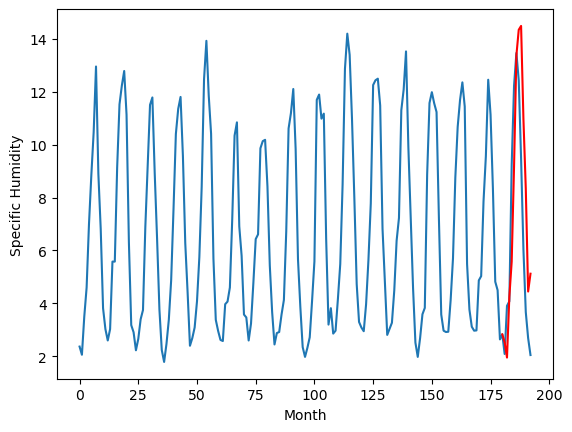

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.08		4.83		0.75
4.12		4.25		0.13
5.36		6.55		1.19
6.73		7.88		1.15
8.26		11.46		3.20
13.58		15.67		2.09
15.44		16.65		1.21
15.78		16.80		1.02
12.59		13.27		0.68
10.73		10.64		-0.09
5.54		6.75		1.21
5.42		7.43		2.01
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.69, 4.826421260312199, 4.252384364083409, 6.554390608742833, 7.881278573945164, 11.457754194214939, 15.671191751435398, 16.64526706881821, 16.79735855706036, 13.26574473030865, 10.644483610466121, 6.754118248298763, 7.425241097286342]


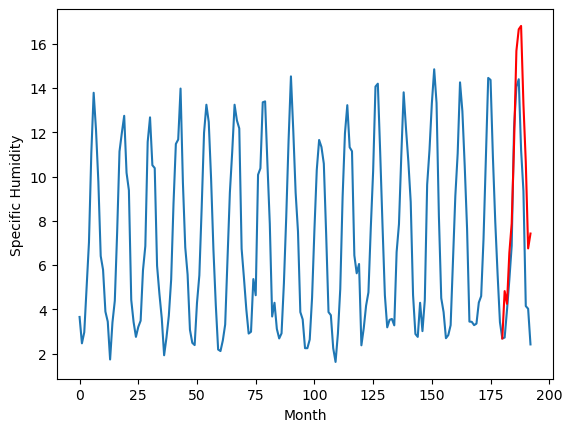

RangeIndex(start=1, stop=12, step=1)
[5.03, 4.340000000000002, 3.2199999999999998, 2.0299999999999994, 6.18, 5.75, 5.66, 6.529999999999999, 6.49, 2.7100000000000004, 4.079999999999999]
[4.827538866028189, 4.339161136820913, 3.0906519216299055, 2.386984896734357, 6.444160911552608, 4.935484443865716, 5.7886419710516925, 6.676836978495121, 6.343149652630091, 2.533479326851666, 4.826421260312199]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    5.03   4.827539
1                 1    4.34   4.339161
2                 2    3.22   3.090652
3                 3    2.03   2.386985
4                 4    6.18   6.444161
5                 5    5.75   4.935484
6                 6    5.66   5.788642
7                 7    6.53   6.676837
8                 8    6.49   6.343150
9                 9    2.71   2.533479
10               10    4.08   4.826421


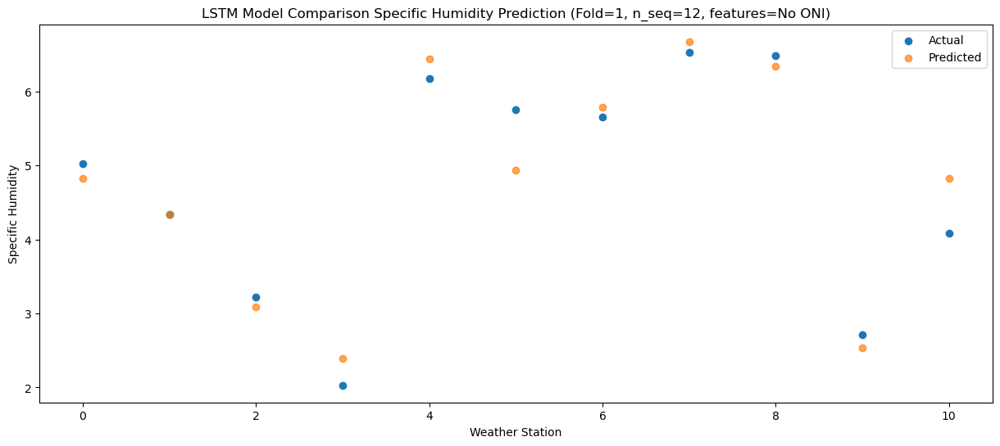

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    5.35   4.251013
1                 1    4.53   3.763930
2                 2    3.22   2.513493
3                 3    2.10   1.808524
4                 4    6.22   5.865226
5                 5    5.12   4.358221
6                 6    5.78   5.213177
7                 7    6.01   6.102840
8                 8    5.68   5.765788
9                 9    1.97   1.954892
10               10    4.12   4.252384


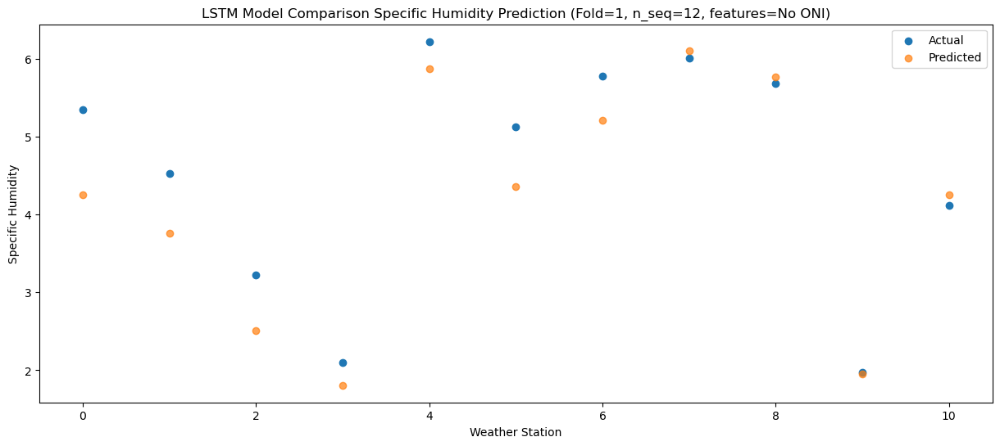

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    6.88   6.547746
1                 1    6.06   6.064174
2                 2    5.84   4.813905
3                 3    4.74   4.107588
4                 4    8.94   8.165771
5                 5    5.91   6.658427
6                 6    7.34   7.515515
7                 7    8.74   8.405743
8                 8    8.29   8.066776
9                 9    3.79   4.253021
10               10    5.36   6.554391


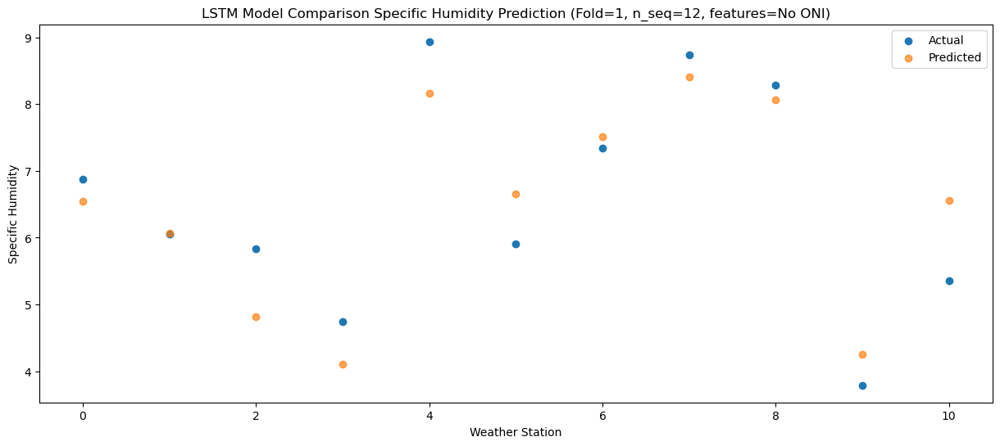

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0    7.08   7.866893
1                 1    6.42   7.383226
2                 2    5.55   6.134022
3                 3    6.08   5.428184
4                 4   10.20   9.485715
5                 5    7.21   7.982225
6                 6    7.96   8.839926
7                 7    9.97   9.731461
8                 8    9.45   9.394539
9                 9    3.96   5.580027
10               10    6.73   7.881279


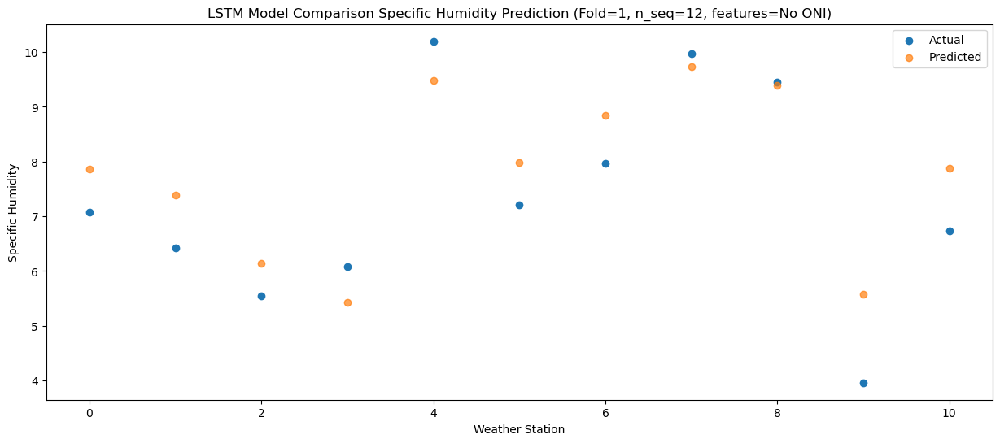

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0    9.76  11.444774
1                 1    9.34  10.960570
2                 2    8.39   9.713108
3                 3    9.97   9.010253
4                 4   14.23  13.066834
5                 5   11.52  11.565008
6                 6   10.89  12.419359
7                 7   13.18  13.313202
8                 8   13.67  12.977283
9                 9    9.11   9.161563
10               10    8.26  11.457754


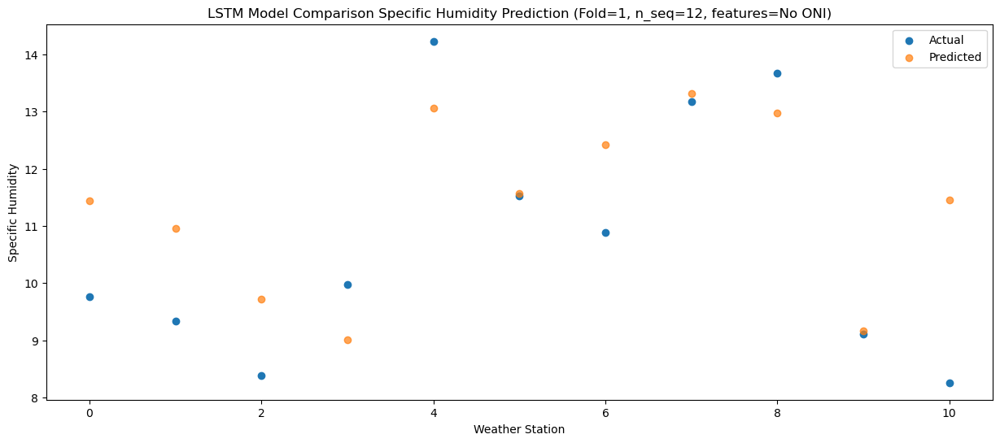

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   14.92  15.650091
1                 1   13.32  15.165907
2                 2   12.91  13.917593
3                 3   13.16  13.214613
4                 4   17.64  17.270572
5                 5   13.69  15.770065
6                 6   15.24  16.623879
7                 7   17.94  17.518835
8                 8   16.81  17.183488
9                 9   12.10  13.368675
10               10   13.58  15.671192


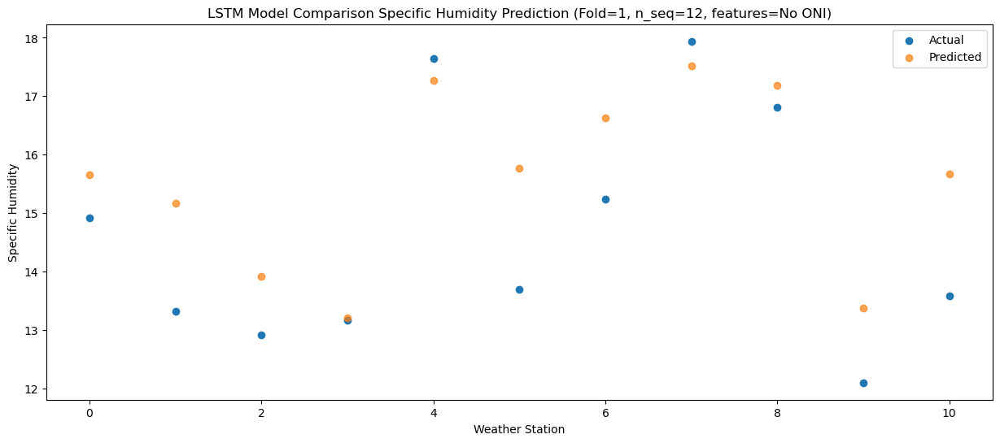

Predictions for (t+6):
    Weather_Station  Actual  Predicted
0                 0   16.07  16.614572
1                 1   15.19  16.133383
2                 2   14.50  14.885408
3                 3   13.64  14.183016
4                 4   17.82  18.240717
5                 5   15.02  16.738486
6                 6   17.74  17.595665
7                 7   18.57  18.489452
8                 8   17.86  18.155364
9                 9   13.34  14.336934
10               10   15.44  16.645267


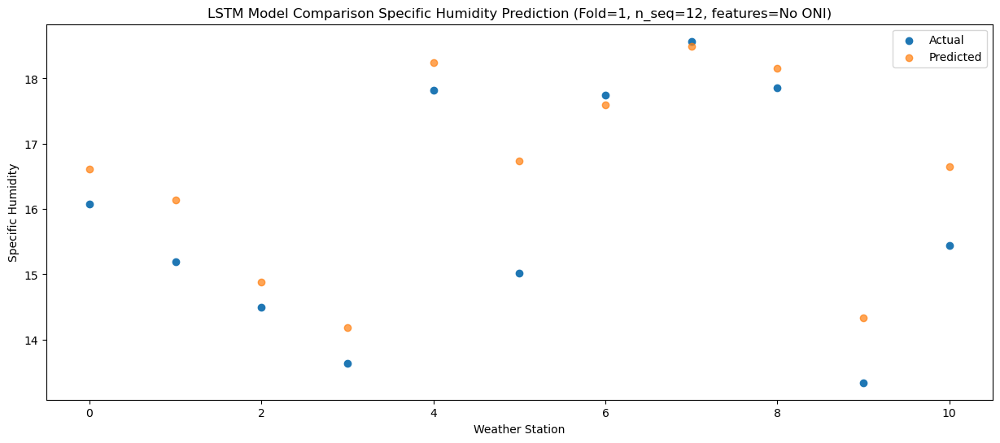

Predictions for (t+7):
    Weather_Station  Actual  Predicted
0                 0   16.83  16.769288
1                 1   15.40  16.288409
2                 2   14.72  15.040659
3                 3   13.98  14.336278
4                 4   17.86  18.393178
5                 5   15.24  16.889217
6                 6   18.03  17.746101
7                 7   18.42  18.640834
8                 8   17.44  18.305502
9                 9   12.31  14.482740
10               10   15.78  16.797359


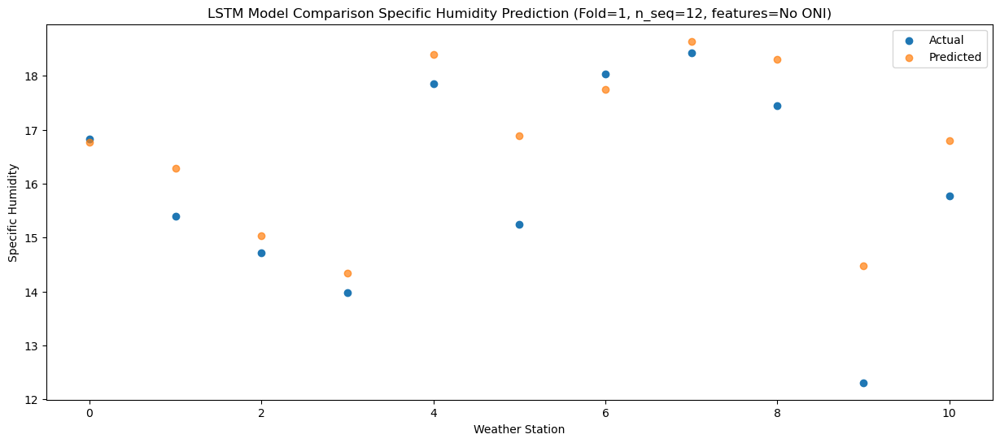

Predictions for (t+8):
    Weather_Station  Actual  Predicted
0                 0   13.35  13.232181
1                 1   12.45  12.752214
2                 2   11.96  11.505340
3                 3   10.89  10.801082
4                 4   14.76  14.857847
5                 5   11.70  13.356510
6                 6   14.68  14.214220
7                 7   15.17  15.109595
8                 8   13.87  14.774751
9                 9    9.35  10.955312
10               10   12.59  13.265745


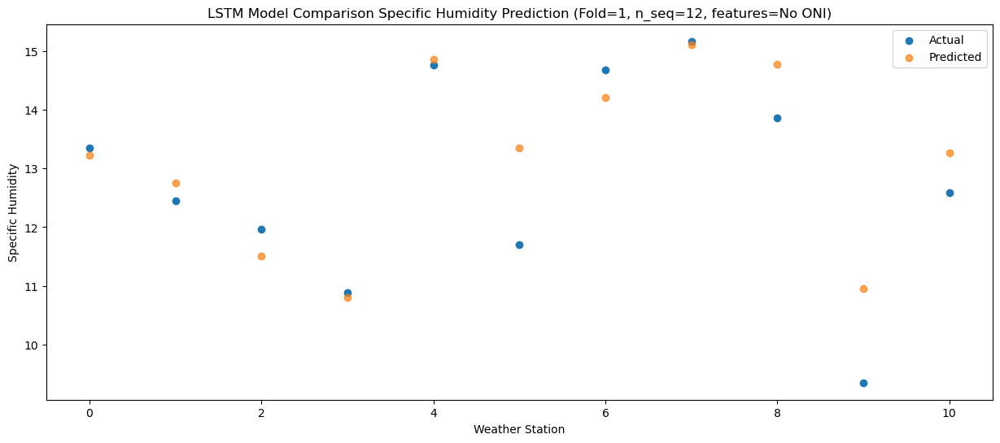

Predictions for (t+9):
    Weather_Station  Actual  Predicted
0                 0   10.77  10.615511
1                 1   10.41  10.134531
2                 2    9.21   8.888296
3                 3    8.64   8.184454
4                 4   12.81  12.238618
5                 5    8.59  10.737361
6                 6   12.55  11.593926
7                 7   12.44  12.489224
8                 8   11.43  12.154170
9                 9    5.91   8.333122
10               10   10.73  10.644484


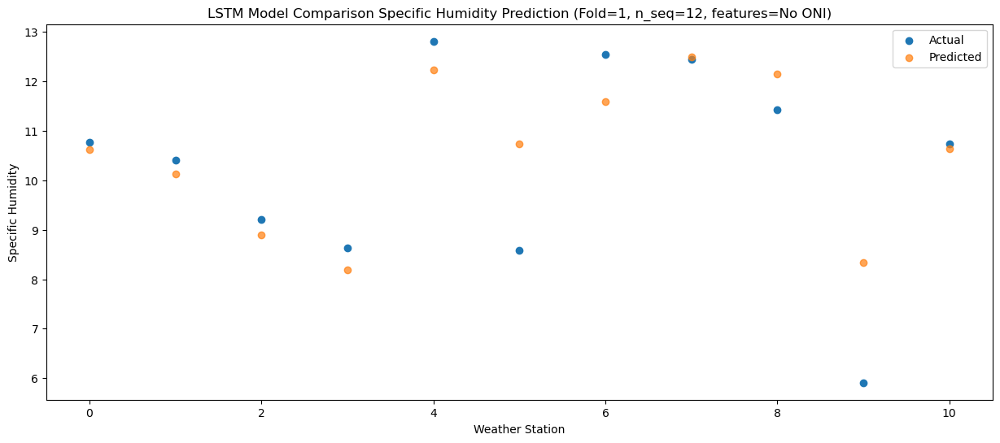

Predictions for (t+10):
    Weather_Station  Actual  Predicted
0                 0    5.11   6.723114
1                 1    4.82   6.240227
2                 2    3.71   4.992684
3                 3    4.19   4.293128
4                 4    8.22   8.348553
5                 5    6.75   6.848547
6                 6    6.62   7.700390
7                 7    7.88   8.598299
8                 8    7.90   8.266261
9                 9    3.55   4.449020
10               10    5.54   6.754118


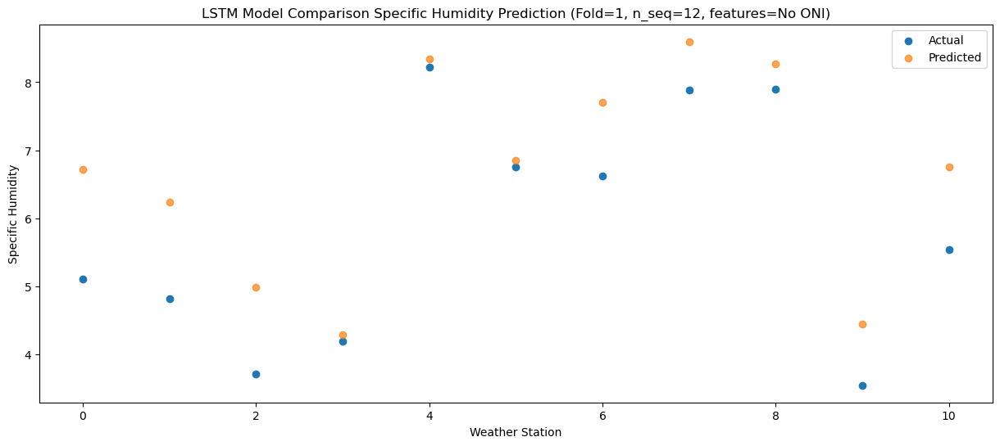

Predictions for (t+11):
    Weather_Station  Actual  Predicted
0                 0    7.22   7.402073
1                 1    6.99   6.920188
2                 2    6.35   5.674331
3                 3    7.11   4.975437
4                 4   11.15   9.032472
5                 5    5.70   7.531209
6                 6    8.49   8.382046
7                 7    9.52   9.280593
8                 8    7.29   8.946794
9                 9    2.57   5.122782
10               10    5.42   7.425241


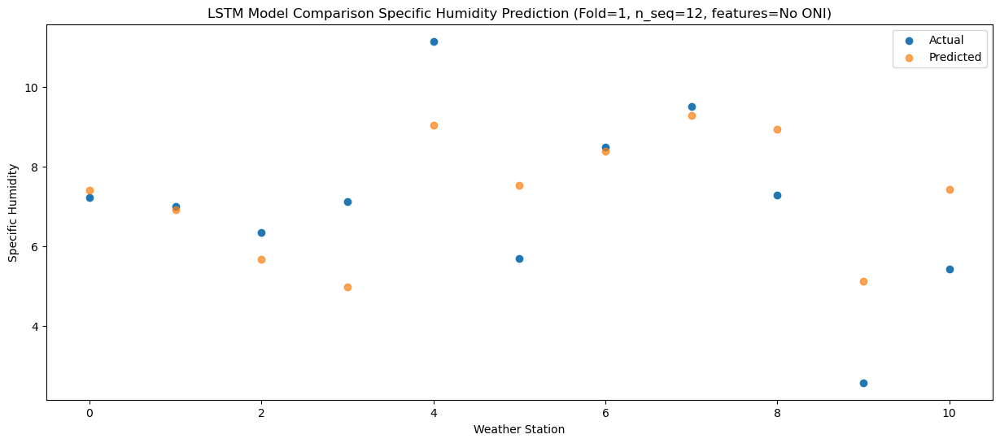

Model: "sequential_502"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_1004 (LSTM)            (1, 1, 256)               2279424   
                                                                 
 dropout_1004 (Dropout)      (1, 1, 256)               0         
                                                                 
 lstm_1005 (LSTM)            (1, 256)                  525312    
                                                                 
 dropout_1005 (Dropout)      (1, 256)                  0         
                                                                 
 dense_1506 (Dense)          (1, 256)                  65792     
                                                                 
 dense_1507 (Dense)          (1, 128)                  32896     
                                                                 
 dense_1508 (Dense)          (1, 12)                

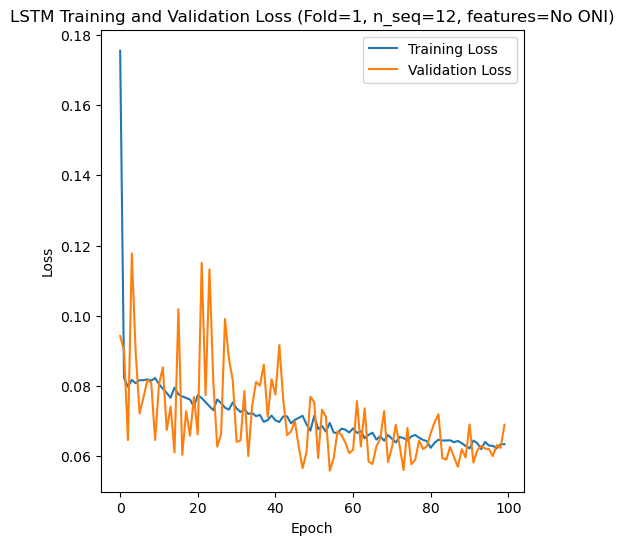

Epoch 1/100
84/84 [==============================] - 24s 84ms/step - loss: 0.1194 - accuracy: 0.5833 - mae: 0.0975 - rmse: 0.1194 - mape: 22.0400 - pearson: 0.6453 - val_loss: 0.0606 - val_accuracy: 1.0000 - val_mae: 0.0495 - val_rmse: 0.0606 - val_mape: 11.6745 - val_pearson: 0.8806
Epoch 2/100
84/84 [==============================] - 2s 27ms/step - loss: 0.0835 - accuracy: 0.6310 - mae: 0.0663 - rmse: 0.0835 - mape: 15.3825 - pearson: 0.7077 - val_loss: 0.0387 - val_accuracy: 1.0000 - val_mae: 0.0324 - val_rmse: 0.0387 - val_mape: 7.7023 - val_pearson: 0.9432
Epoch 3/100
84/84 [==============================] - 2s 27ms/step - loss: 0.0851 - accuracy: 0.6310 - mae: 0.0674 - rmse: 0.0851 - mape: 15.2019 - pearson: 0.6985 - val_loss: 0.0444 - val_accuracy: 1.0000 - val_mae: 0.0372 - val_rmse: 0.0444 - val_mape: 8.0299 - val_pearson: 0.9354
Epoch 4/100
84/84 [==============================] - 2s 29ms/step - loss: 0.0847 - accuracy: 0.5595 - mae: 0.0667 - rmse: 0.0847 - mape: 15.3287 - pe

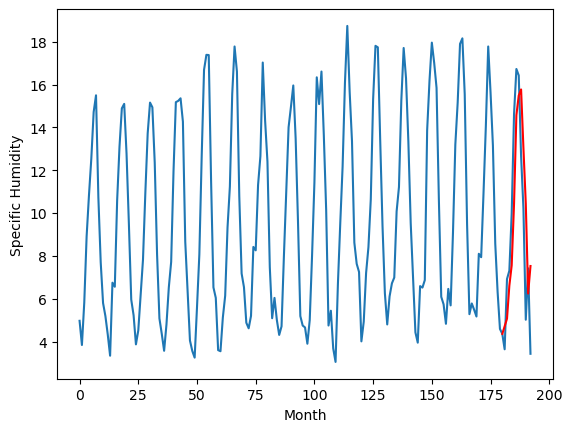

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
1.84		1.98		0.14
1.16		2.34		1.18
3.01		3.88		0.87
3.13		4.83		1.70
8.25		7.71		-0.54
11.16		11.84		0.68
12.77		12.76		-0.01
11.15		13.04		1.89
8.33		10.29		1.96
4.94		7.71		2.77
2.51		3.52		1.01
1.45		4.80		3.35
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.82, 1.9840676778554915, 2.3382184797525403, 3.8817600303888318, 4.834388762116432, 7.711066036820411, 11.839615612626076, 12.762245505452157, 13.043836563229561, 10.294181554913521, 7.707105367779732, 3.5158407384157186, 4.798876851201058]


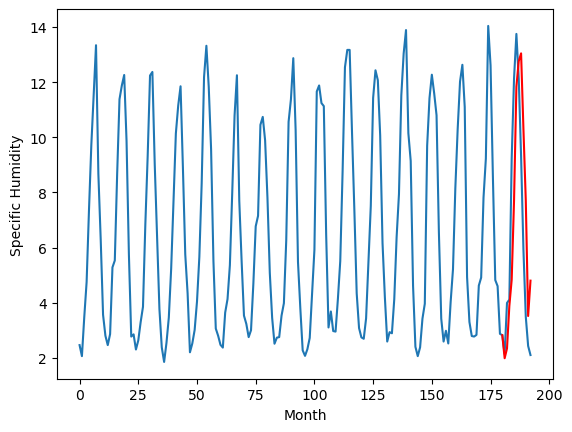

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.53		5.13		-0.40
7.66		5.49		-2.17
7.88		7.03		-0.85
8.85		7.98		-0.87
10.16		10.86		0.70
13.94		14.99		1.05
14.34		15.91		1.57
14.96		16.20		1.24
13.68		13.45		-0.23
11.02		10.85		-0.17
7.07		6.66		-0.41
8.47		7.95		-0.52
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[9.16, 5.1268416875600815, 5.486426346898079, 7.027528279423714, 7.983363860249519, 10.860543006062507, 14.98859905540943, 15.913977974057197, 16.19768875181675, 13.448379688858985, 10.852198057770728, 6.6557640367746345, 7.945597940087318]


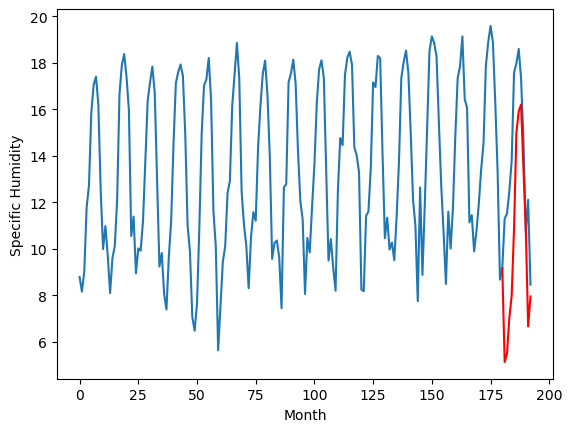

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.98		5.15		1.17
4.15		5.51		1.36
4.79		7.05		2.26
6.14		8.00		1.86
7.82		10.87		3.05
12.42		15.01		2.59
15.02		15.94		0.92
15.76		16.22		0.46
13.10		13.48		0.38
10.14		10.88		0.74
5.69		6.68		0.99
5.33		7.97		2.64
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.44, 5.151476701200008, 5.507873644530773, 7.047865500152111, 7.999475052058696, 10.87409978121519, 15.008737137019633, 15.939002027213572, 16.2218737205863, 13.475578506886958, 10.881521423757075, 6.684806068837641, 7.971246322095393]


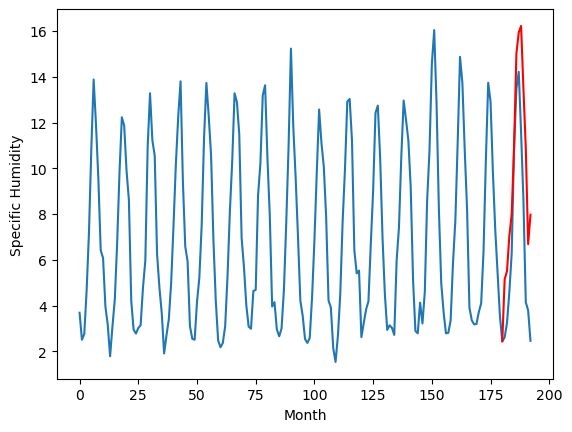

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.10		5.06		-0.04
5.08		5.42		0.34
8.37		6.96		-1.41
8.39		7.91		-0.48
11.59		10.79		-0.80
15.48		14.92		-0.56
16.51		15.85		-0.66
16.11		16.13		0.02
13.97		13.38		-0.59
11.44		10.78		-0.66
5.78		6.58		0.80
9.06		7.87		-1.19
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[6.65, 5.058220983743667, 5.418620766401291, 6.961183489561081, 7.91433519244194, 10.791328610181807, 14.921339691877364, 15.845489681959151, 16.12709701180458, 13.378377796411513, 10.782509447336196, 6.584242941141127, 7.87180006623268]


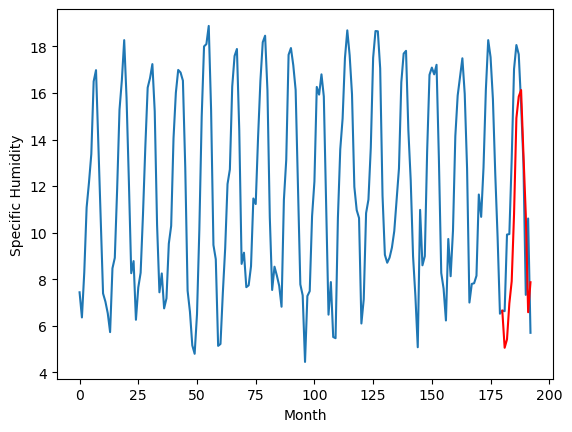

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.33		2.55		0.22
2.28		2.91		0.63
5.27		4.45		-0.82
6.84		5.40		-1.44
11.67		8.28		-3.39
14.31		12.41		-1.90
13.27		13.33		0.06
13.40		13.61		0.21
9.84		10.87		1.03
8.25		8.27		0.02
4.06		4.08		0.02
6.93		5.37		-1.56
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[6.19, 2.546184598505497, 2.906805663406849, 4.447620301544666, 5.400052635967731, 8.279434054195882, 12.409085123836995, 13.33436730414629, 13.614937274754048, 10.86579677373171, 8.273998229801656, 4.080247848331929, 5.366972534954549]


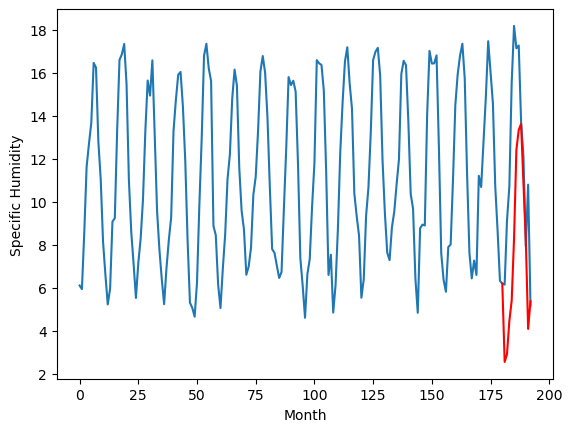

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
8.68		8.87		0.19
8.35		9.22		0.87
11.21		10.77		-0.44
12.53		11.72		-0.81
16.73		14.60		-2.13
20.48		18.73		-1.75
21.30		19.65		-1.65
21.68		19.93		-1.75
17.23		17.18		-0.05
14.62		14.59		-0.03
10.63		10.40		-0.23
13.13		11.69		-1.44
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[4.78, 8.865032314062118, 9.224823890924453, 10.766781269311904, 11.717840074300765, 14.598492501974105, 18.727757333517076, 19.6539370405674, 19.932409344911576, 17.181152402162553, 14.591992913484575, 10.399294434785844, 11.685132204294206]


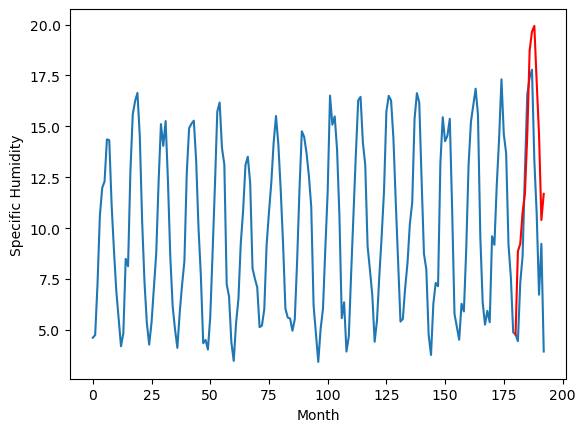

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.97		3.77		-0.20
3.84		4.13		0.29
3.93		5.67		1.74
4.23		6.63		2.40
4.35		9.50		5.15
7.01		13.63		6.62
12.25		14.56		2.31
12.54		14.84		2.30
9.78		12.09		2.31
6.07		9.50		3.43
4.42		5.31		0.89
4.55		6.60		2.05
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.61, 3.7737363451719284, 4.131135212779045, 5.670760142207145, 6.626851486563682, 9.503633188605308, 13.631953882575035, 14.556867288947105, 14.837859677672386, 12.090734528899192, 9.49978761613369, 5.308074283003807, 6.59791867673397]


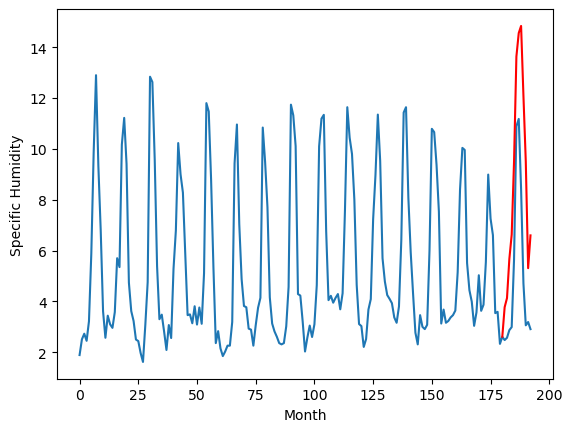

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
8.29		7.53		-0.76
8.82		7.89		-0.93
8.93		9.43		0.50
10.25		10.38		0.13
11.73		13.26		1.53
12.98		17.39		4.41
14.13		18.31		4.18
13.53		18.59		5.06
13.07		15.84		2.77
10.27		13.26		2.99
9.73		9.07		-0.66
9.55		10.35		0.80
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[4.6, 7.525663534700871, 7.88561792165041, 9.426142285168172, 10.3837048509717, 13.259197423756124, 17.385887811481954, 18.310418079197408, 18.59126583725214, 15.844622770845891, 13.257131735384466, 9.068465868532659, 10.354881207048894]


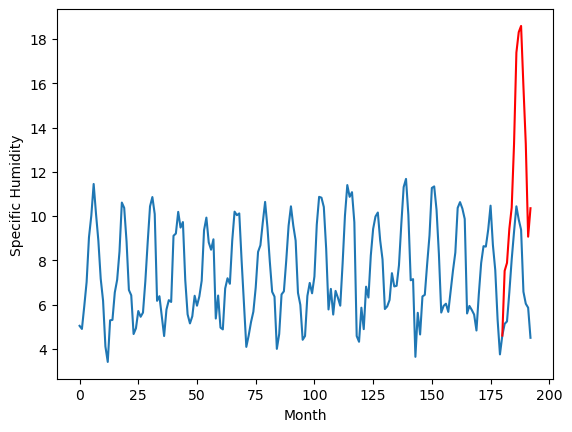

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.98		6.18		0.20
6.05		6.54		0.49
7.78		8.08		0.30
8.31		9.04		0.73
11.02		11.92		0.90
15.52		16.05		0.53
17.04		16.98		-0.06
17.62		17.26		-0.36
14.02		14.51		0.49
11.86		11.92		0.06
6.30		7.73		1.43
8.15		9.02		0.87
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[4.27, 6.183571597933769, 6.540962806344032, 8.083452692627906, 9.039375415444374, 11.918109288811683, 16.0497134834528, 16.978519609570505, 17.260263910889627, 14.512606611847879, 11.92003988325596, 7.725668182969095, 9.016878476738931]


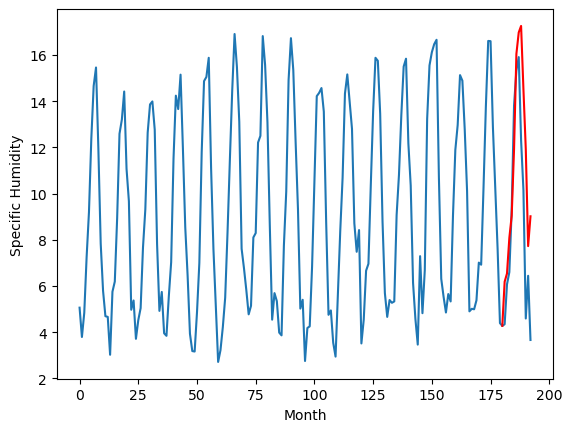

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.63		4.70		0.07
4.87		5.06		0.19
5.90		6.60		0.70
6.51		7.56		1.05
9.18		10.44		1.26
13.28		14.57		1.29
14.69		15.50		0.81
15.08		15.78		0.70
11.87		13.03		1.16
10.14		10.44		0.30
4.78		6.25		1.47
6.34		7.54		1.20
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.91, 4.702919299602509, 5.060300911664963, 6.601040805578232, 7.557471240758896, 10.436652387380601, 14.569403852224351, 15.495291377305985, 15.778244490623475, 13.031798357963563, 10.441983695030213, 6.247113223075868, 7.538270826339723]


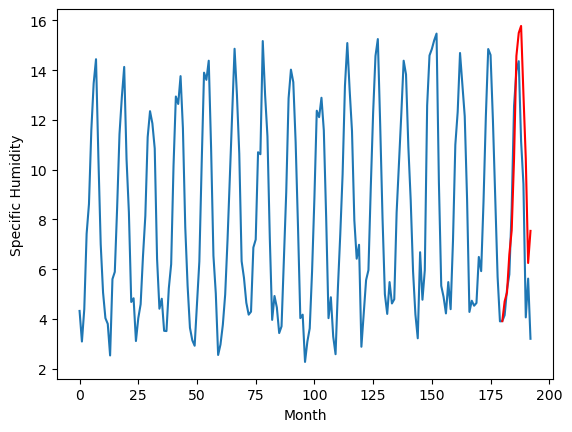

RangeIndex(start=1, stop=12, step=1)
[4.390000000000001, 1.8399999999999992, 5.529999999999999, 3.9799999999999995, 5.1, 2.33, 8.68, 3.9700000000000006, 8.29, 5.9799999999999995, 4.63]
[4.71318358451128, 1.9840676778554915, 5.1268416875600815, 5.151476701200008, 5.058220983743667, 2.546184598505497, 8.865032314062118, 3.7737363451719284, 7.525663534700871, 6.183571597933769, 4.702919299602509]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    4.39   4.713184
1                 1    1.84   1.984068
2                 2    5.53   5.126842
3                 3    3.98   5.151477
4                 4    5.10   5.058221
5                 5    2.33   2.546185
6                 6    8.68   8.865032
7                 7    3.97   3.773736
8                 8    8.29   7.525664
9                 9    5.98   6.183572
10               10    4.63   4.702919


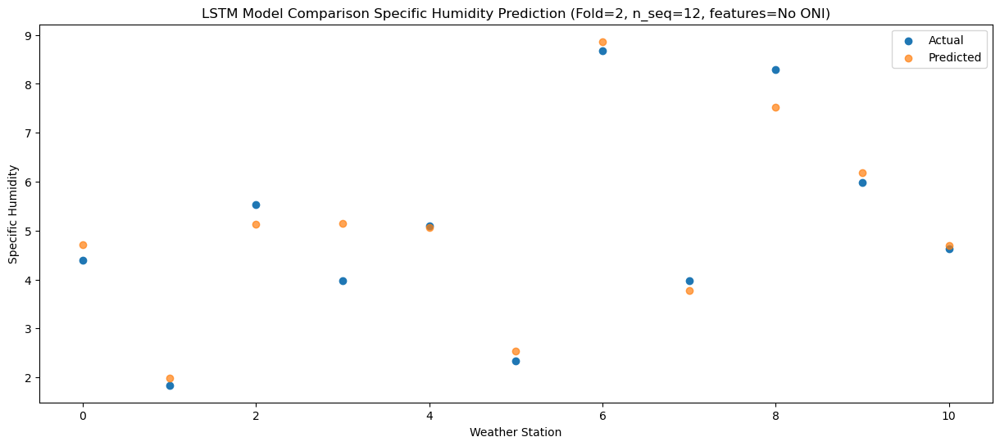

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    3.67   5.068789
1                 1    1.16   2.338218
2                 2    7.66   5.486426
3                 3    4.15   5.507874
4                 4    5.08   5.418621
5                 5    2.28   2.906806
6                 6    8.35   9.224824
7                 7    3.84   4.131135
8                 8    8.82   7.885618
9                 9    6.05   6.540963
10               10    4.87   5.060301


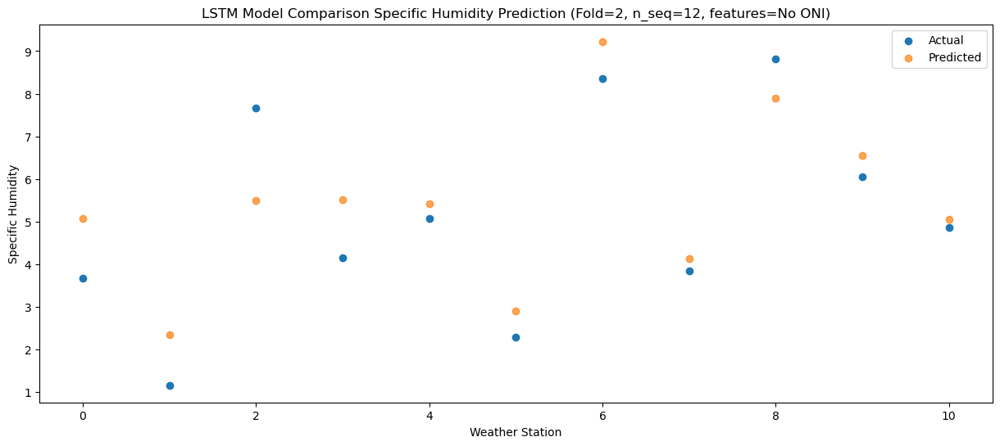

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    6.95   6.611047
1                 1    3.01   3.881760
2                 2    7.88   7.027528
3                 3    4.79   7.047866
4                 4    8.37   6.961183
5                 5    5.27   4.447620
6                 6   11.21  10.766781
7                 7    3.93   5.670760
8                 8    8.93   9.426142
9                 9    7.78   8.083453
10               10    5.90   6.601041


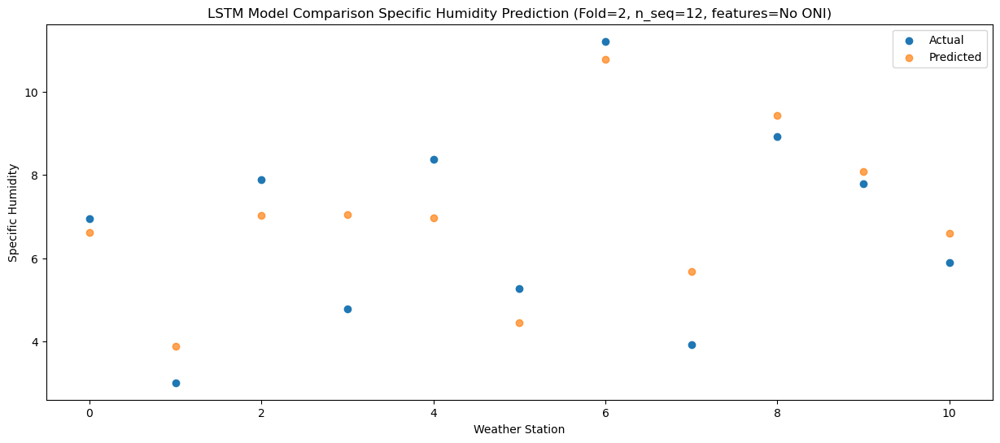

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0    7.34   7.563257
1                 1    3.13   4.834389
2                 2    8.85   7.983364
3                 3    6.14   7.999475
4                 4    8.39   7.914335
5                 5    6.84   5.400053
6                 6   12.53  11.717840
7                 7    4.23   6.626851
8                 8   10.25  10.383705
9                 9    8.31   9.039375
10               10    6.51   7.557471


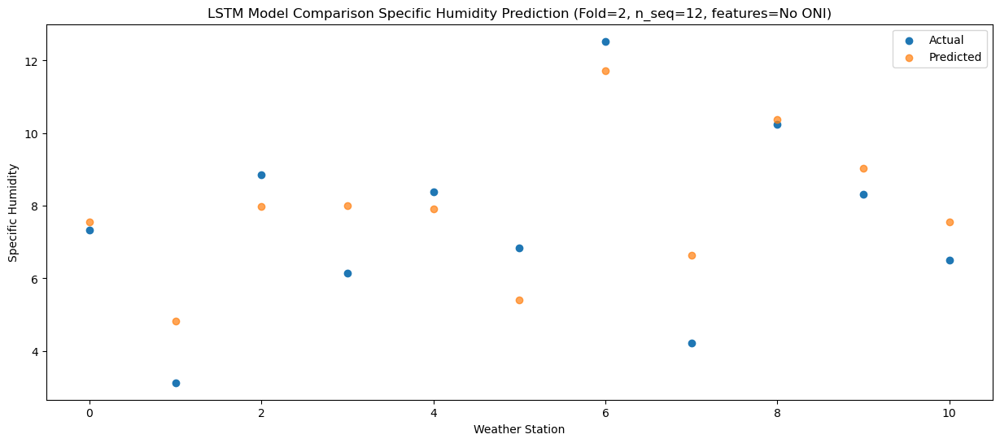

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   10.01  10.441050
1                 1    8.25   7.711066
2                 2   10.16  10.860543
3                 3    7.82  10.874100
4                 4   11.59  10.791329
5                 5   11.67   8.279434
6                 6   16.73  14.598493
7                 7    4.35   9.503633
8                 8   11.73  13.259197
9                 9   11.02  11.918109
10               10    9.18  10.436652


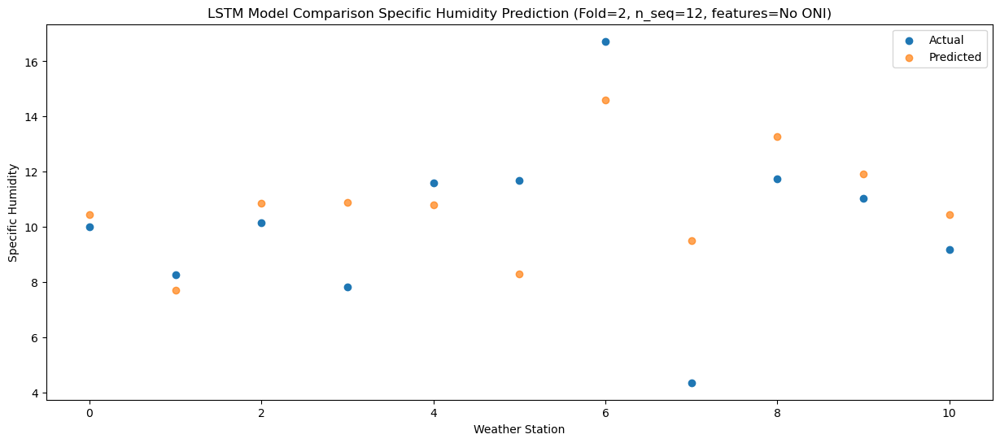

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   14.66  14.571060
1                 1   11.16  11.839616
2                 2   13.94  14.988599
3                 3   12.42  15.008737
4                 4   15.48  14.921340
5                 5   14.31  12.409085
6                 6   20.48  18.727757
7                 7    7.01  13.631954
8                 8   12.98  17.385888
9                 9   15.52  16.049713
10               10   13.28  14.569404


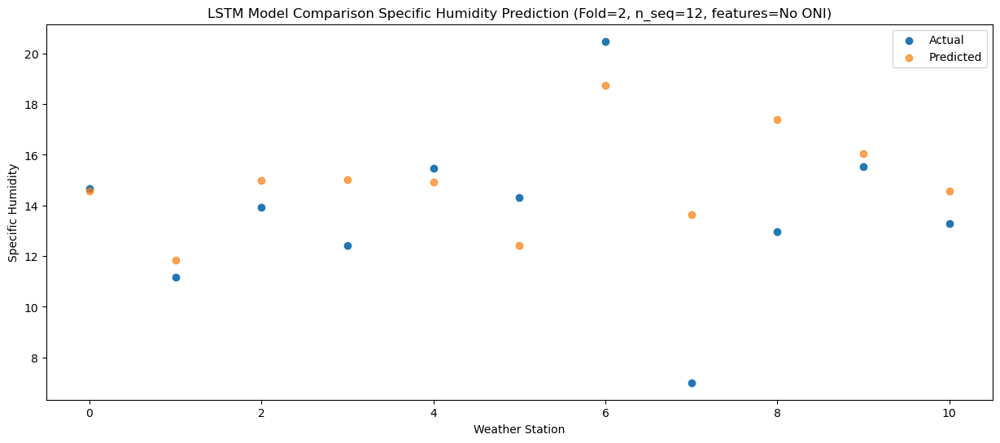

Predictions for (t+6):
    Weather_Station  Actual  Predicted
0                 0   16.76  15.491439
1                 1   12.77  12.762246
2                 2   14.34  15.913978
3                 3   15.02  15.939002
4                 4   16.51  15.845490
5                 5   13.27  13.334367
6                 6   21.30  19.653937
7                 7   12.25  14.556867
8                 8   14.13  18.310418
9                 9   17.04  16.978520
10               10   14.69  15.495291


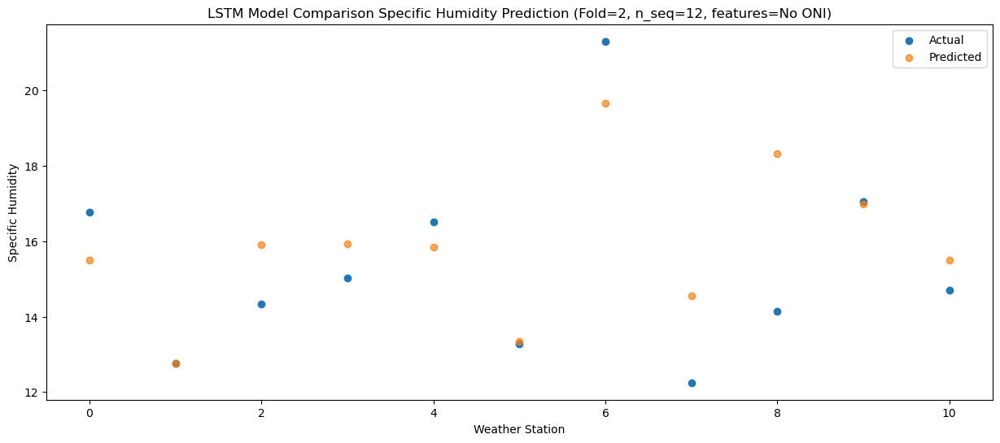

Predictions for (t+7):
    Weather_Station  Actual  Predicted
0                 0   16.46  15.774103
1                 1   11.15  13.043837
2                 2   14.96  16.197689
3                 3   15.76  16.221874
4                 4   16.11  16.127097
5                 5   13.40  13.614937
6                 6   21.68  19.932409
7                 7   12.54  14.837860
8                 8   13.53  18.591266
9                 9   17.62  17.260264
10               10   15.08  15.778244


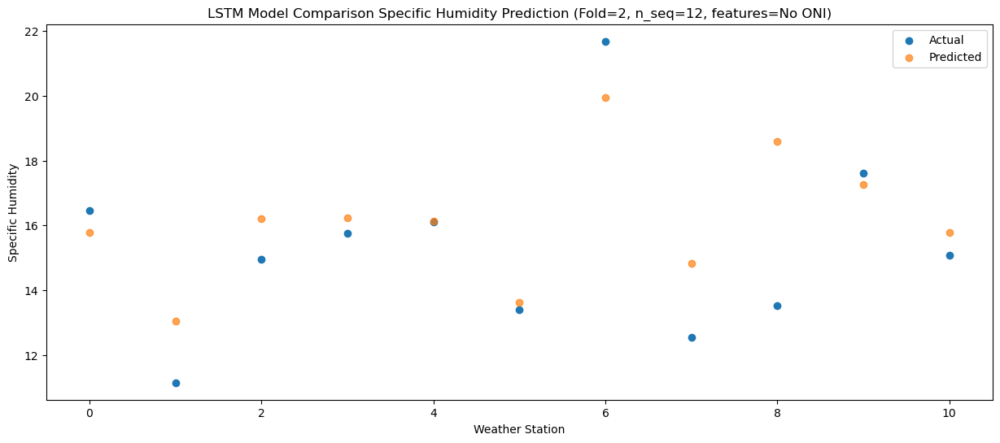

Predictions for (t+8):
    Weather_Station  Actual  Predicted
0                 0   12.69  13.024310
1                 1    8.33  10.294182
2                 2   13.68  13.448380
3                 3   13.10  13.475579
4                 4   13.97  13.378378
5                 5    9.84  10.865797
6                 6   17.23  17.181152
7                 7    9.78  12.090735
8                 8   13.07  15.844623
9                 9   14.02  14.512607
10               10   11.87  13.031798


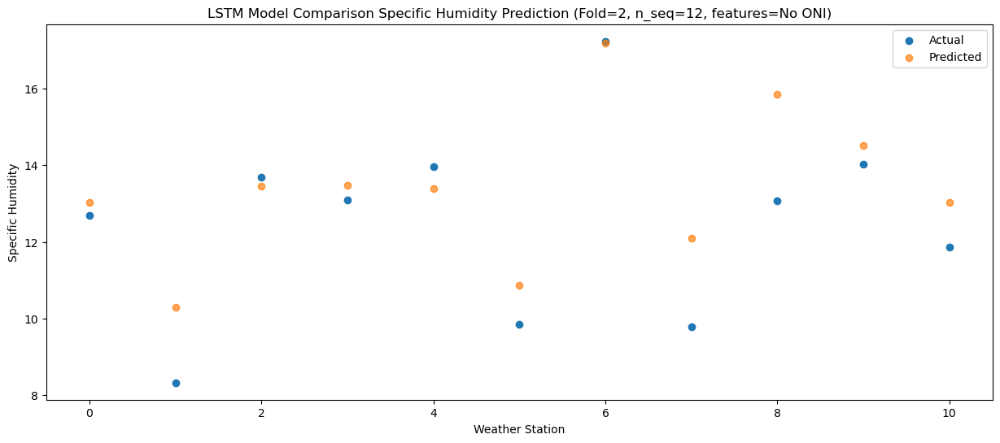

Predictions for (t+9):
    Weather_Station  Actual  Predicted
0                 0   10.24  10.438324
1                 1    4.94   7.707105
2                 2   11.02  10.852198
3                 3   10.14  10.881521
4                 4   11.44  10.782509
5                 5    8.25   8.273998
6                 6   14.62  14.591993
7                 7    6.07   9.499788
8                 8   10.27  13.257132
9                 9   11.86  11.920040
10               10   10.14  10.441984


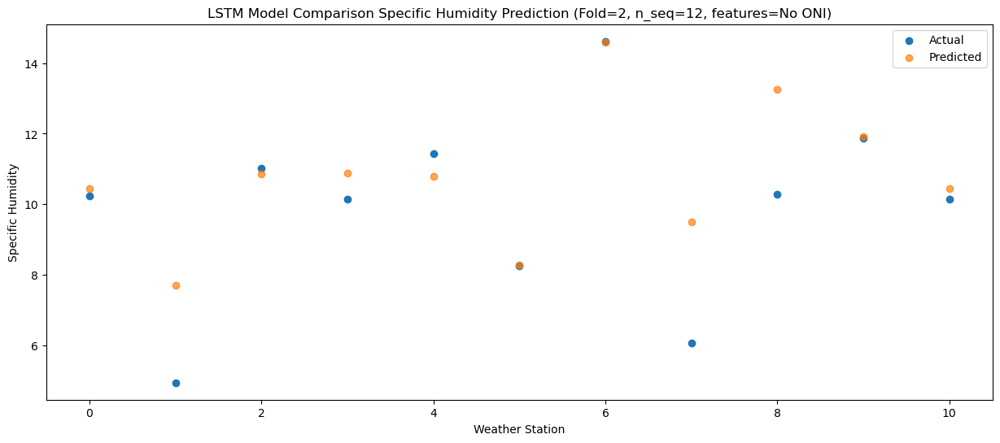

Predictions for (t+10):
    Weather_Station  Actual  Predicted
0                 0    5.05   6.242686
1                 1    2.51   3.515841
2                 2    7.07   6.655764
3                 3    5.69   6.684806
4                 4    5.78   6.584243
5                 5    4.06   4.080248
6                 6   10.63  10.399294
7                 7    4.42   5.308074
8                 8    9.73   9.068466
9                 9    6.30   7.725668
10               10    4.78   6.247113


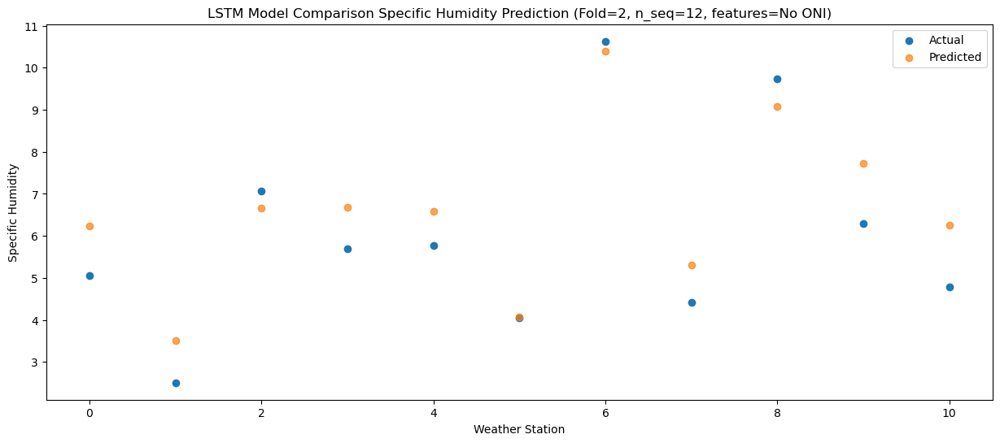

Predictions for (t+11):
    Weather_Station  Actual  Predicted
0                 0    7.45   7.529042
1                 1    1.45   4.798877
2                 2    8.47   7.945598
3                 3    5.33   7.971246
4                 4    9.06   7.871800
5                 5    6.93   5.366973
6                 6   13.13  11.685132
7                 7    4.55   6.597919
8                 8    9.55  10.354881
9                 9    8.15   9.016878
10               10    6.34   7.538271


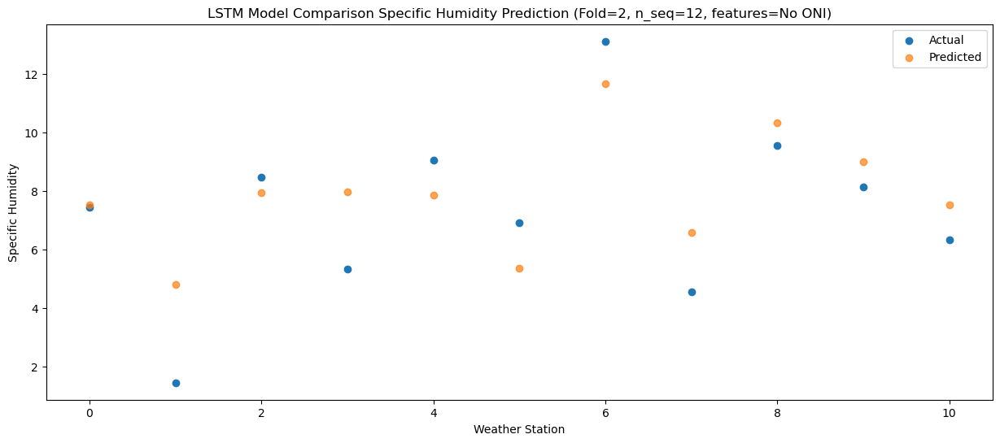

Model: "sequential_503"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_1006 (LSTM)            (1, 1, 256)               2279424   
                                                                 
 dropout_1006 (Dropout)      (1, 1, 256)               0         
                                                                 
 lstm_1007 (LSTM)            (1, 256)                  525312    
                                                                 
 dropout_1007 (Dropout)      (1, 256)                  0         
                                                                 
 dense_1509 (Dense)          (1, 256)                  65792     
                                                                 
 dense_1510 (Dense)          (1, 128)                  32896     
                                                                 
 dense_1511 (Dense)          (1, 12)                

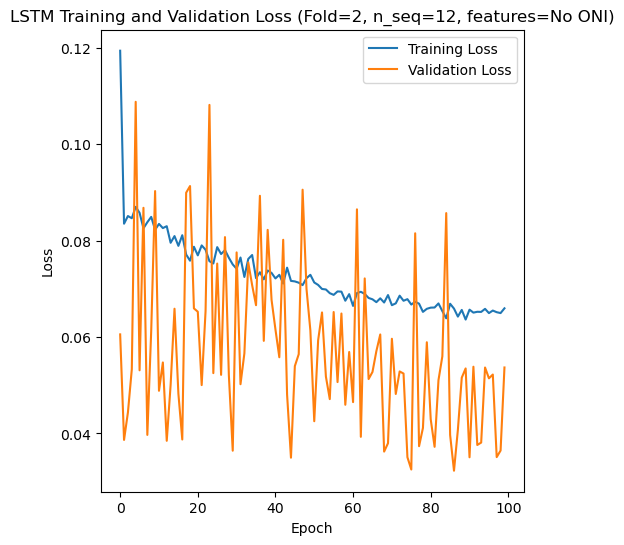

Epoch 1/100
84/84 [==============================] - 24s 91ms/step - loss: 0.1140 - accuracy: 0.5238 - mae: 0.0912 - rmse: 0.1140 - mape: 20.3848 - pearson: 0.6860 - val_loss: 0.1009 - val_accuracy: 0.1000 - val_mae: 0.0829 - val_rmse: 0.1009 - val_mape: 17.9325 - val_pearson: 0.6200
Epoch 2/100
84/84 [==============================] - 3s 36ms/step - loss: 0.0803 - accuracy: 0.5833 - mae: 0.0639 - rmse: 0.0803 - mape: 14.9566 - pearson: 0.7561 - val_loss: 0.1060 - val_accuracy: 0.9000 - val_mae: 0.0799 - val_rmse: 0.1060 - val_mape: 18.2615 - val_pearson: 0.5431
Epoch 3/100
84/84 [==============================] - 3s 33ms/step - loss: 0.0812 - accuracy: 0.6429 - mae: 0.0659 - rmse: 0.0812 - mape: 14.9208 - pearson: 0.7373 - val_loss: 0.0817 - val_accuracy: 0.9000 - val_mae: 0.0602 - val_rmse: 0.0817 - val_mape: 13.4827 - val_pearson: 0.6646
Epoch 4/100
84/84 [==============================] - 3s 35ms/step - loss: 0.0757 - accuracy: 0.6310 - mae: 0.0594 - rmse: 0.0757 - mape: 13.4557 - 

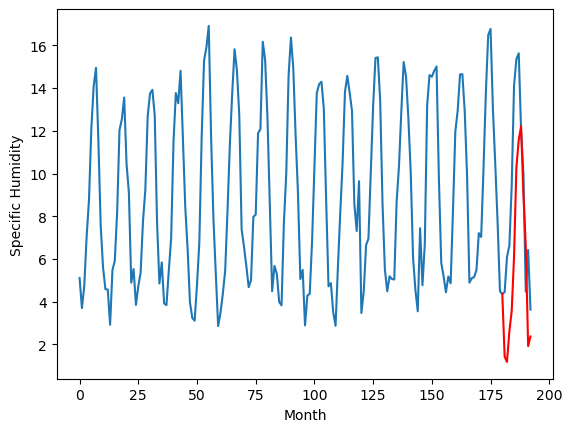

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.64		2.47		-0.17
2.08		2.22		0.14
4.59		3.63		-0.96
5.76		4.60		-1.16
9.28		7.14		-2.14
13.81		11.33		-2.48
14.69		12.63		-2.06
14.86		13.26		-1.60
10.89		10.01		-0.88
8.70		7.65		-1.05
4.27		2.96		-1.31
5.24		3.41		-1.83
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.43, 2.4716960895061493, 2.220325480699539, 3.633994232416153, 4.603225957155228, 7.143720160722733, 11.327817927598954, 12.626518260240555, 13.26468045592308, 10.010716508626938, 7.6512270677089695, 2.9611817109584813, 3.4132944154739384]


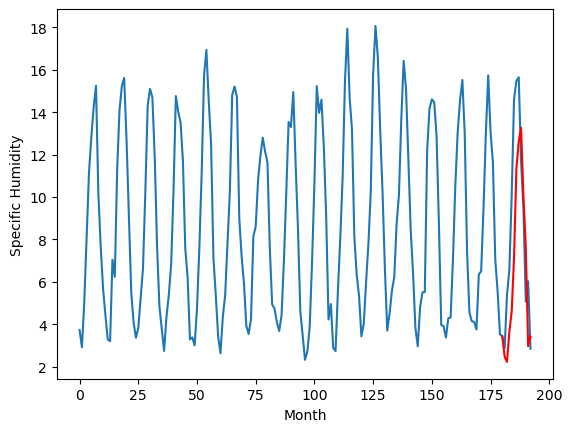

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
6.37		5.67		-0.70
6.31		5.42		-0.89
6.39		6.84		0.45
7.01		7.80		0.79
7.41		10.34		2.93
9.86		14.53		4.67
10.56		15.83		5.27
10.09		16.46		6.37
8.80		13.22		4.42
7.66		10.87		3.21
8.24		6.18		-2.06
6.74		6.63		-0.11
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[5.43, 5.671428762674331, 5.420769207477569, 6.836007945537567, 7.803717963695526, 10.344877355098724, 14.529967896938324, 15.826850645542144, 16.463896207809448, 13.21956389427185, 10.865750007629394, 6.175989799499511, 6.627707086801529]


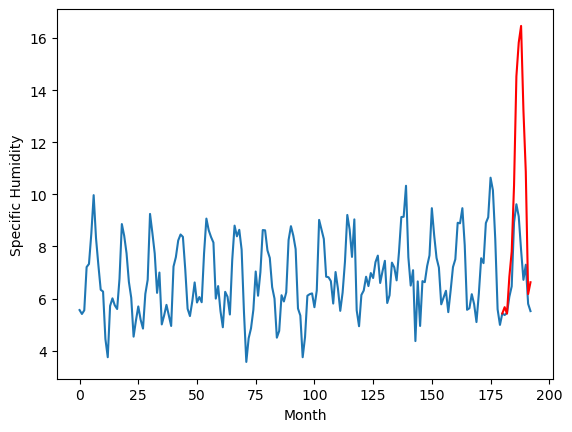

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.44		3.45		0.01
3.37		3.20		-0.17
4.67		4.62		-0.05
5.86		5.58		-0.28
8.39		8.12		-0.27
13.81		12.30		-1.51
14.44		13.60		-0.84
15.32		14.24		-1.08
11.85		10.99		-0.86
9.79		8.63		-1.16
4.10		3.94		-0.16
5.24		4.39		-0.85
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.21, 3.450972936153412, 3.1999503588676452, 4.61616363286972, 5.582422516345978, 8.119927427768708, 12.30367996454239, 13.602786324024201, 14.242962322235108, 10.989050588607789, 8.630363664627076, 3.9369394397735604, 4.388342521190644]


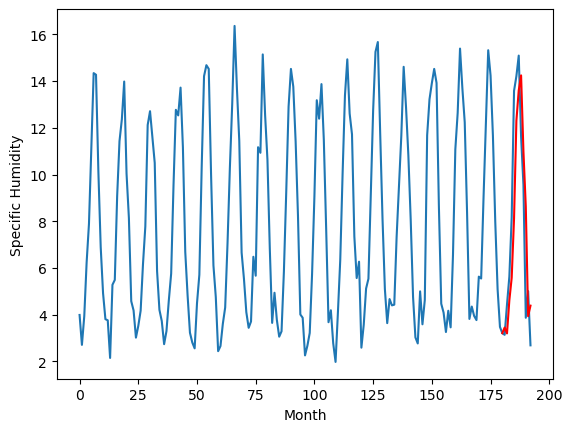

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.91		4.85		-0.06
4.08		4.60		0.52
6.56		6.02		-0.54
7.62		6.98		-0.64
10.04		9.52		-0.52
14.50		13.70		-0.80
16.45		15.00		-1.45
16.54		15.64		-0.90
12.77		12.38		-0.39
10.82		10.03		-0.79
5.70		5.34		-0.36
6.40		5.79		-0.61
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.04, 4.851652578115464, 4.599811152219773, 6.015376642942429, 6.980353549718857, 9.516466335058212, 13.700549319982528, 15.00141234755516, 15.643015340566635, 12.384397701025009, 10.026877597570419, 5.337069228887557, 5.785142675638198]


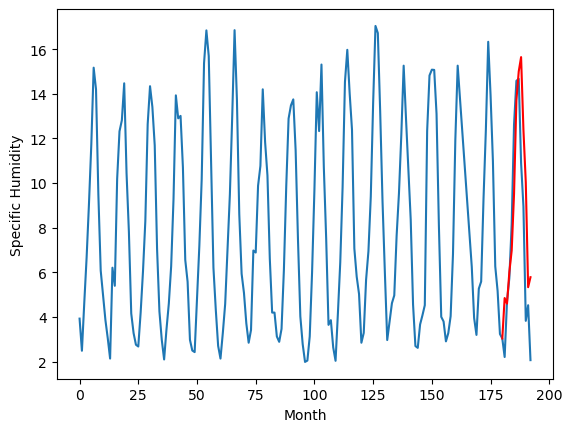

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.42		3.47		0.05
2.90		3.22		0.32
4.93		4.63		-0.30
6.23		5.60		-0.63
8.47		8.13		-0.34
13.69		12.32		-1.37
14.94		13.62		-1.32
15.11		14.26		-0.85
11.81		11.00		-0.81
10.19		8.65		-1.54
4.32		3.95		-0.37
5.37		4.40		-0.97
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.91, 3.4709908175468445, 3.2200678396224975, 4.634267311096192, 5.59935830116272, 8.134975175857544, 12.318120222091675, 13.622117500305176, 14.264918308258057, 11.004151086807251, 8.645635585784913, 3.9547600555419926, 4.402478705644608]


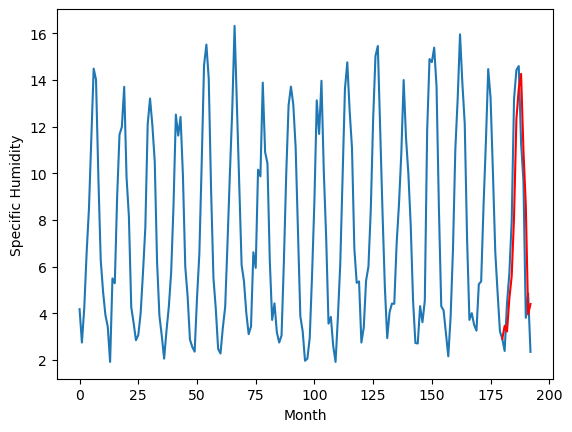

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.73		5.30		-0.43
5.79		5.05		-0.74
6.10		6.46		0.36
6.57		7.43		0.86
7.97		9.96		1.99
9.30		14.15		4.85
11.75		15.45		3.70
10.32		16.09		5.77
8.62		12.84		4.22
7.53		10.48		2.95
6.82		5.79		-1.03
6.11		6.23		0.12
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[1.6, 5.304721174240112, 5.051717159748077, 6.462897417545318, 7.42668711900711, 9.96339547395706, 14.150260803699492, 15.44943189382553, 16.090748724937438, 12.83622067928314, 10.479672608375548, 5.786001381874083, 6.2342285490036]


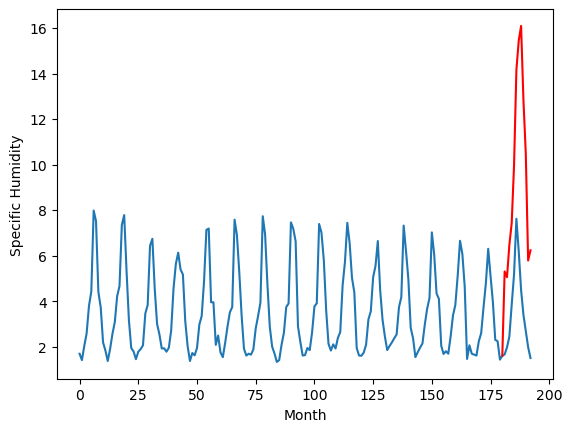

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.80		3.73		-1.07
4.32		3.48		-0.84
4.62		4.89		0.27
4.31		5.86		1.55
4.87		8.40		3.53
6.29		12.58		6.29
11.65		13.88		2.23
9.22		14.52		5.30
7.50		11.27		3.77
6.40		8.92		2.52
5.13		4.23		-0.90
5.27		4.68		-0.59
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.86, 3.7329166436195376, 3.479534616470337, 4.893554320335388, 5.85733627319336, 8.396225681304932, 12.582970371246338, 13.878595342636109, 14.51725350856781, 11.27194797039032, 8.920455327033997, 4.227921357154846, 4.675219436883927]


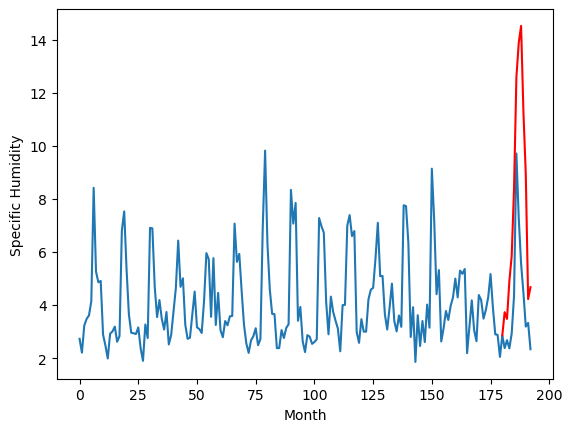

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.60		3.67		-0.93
4.25		3.42		-0.83
3.90		4.83		0.93
4.83		5.80		0.97
5.27		8.34		3.07
6.70		12.52		5.82
7.18		13.81		6.63
7.57		14.45		6.88
6.93		11.21		4.28
5.90		8.85		2.95
6.12		4.16		-1.96
4.87		4.61		-0.26
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[5.65, 3.6736369061470033, 3.4210684525966646, 4.833315037488937, 5.796718977689743, 8.33607139468193, 12.521956347227096, 13.813177608251571, 14.449736856222152, 11.207057260274887, 8.85381963133812, 4.160995267629623, 4.614682846069336]


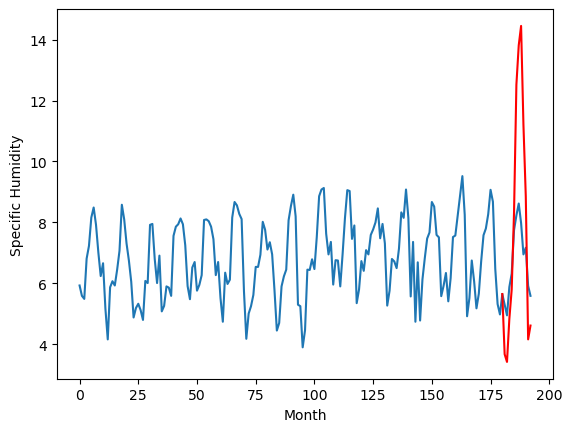

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.09		3.92		0.83
3.24		3.67		0.43
4.02		5.08		1.06
5.40		6.05		0.65
6.97		8.58		1.61
11.87		12.77		0.90
14.08		14.06		-0.02
14.46		14.70		0.24
11.86		11.45		-0.41
9.32		9.09		-0.23
4.79		4.39		-0.40
4.49		4.84		0.35
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.54, 3.920871429443359, 3.6681845414638516, 5.0826257693767545, 6.046992622613907, 8.584406696557998, 12.768184028863907, 14.061621152162552, 14.69875177025795, 11.449621282815933, 9.090926014184951, 4.394587837457657, 4.843431823253631]


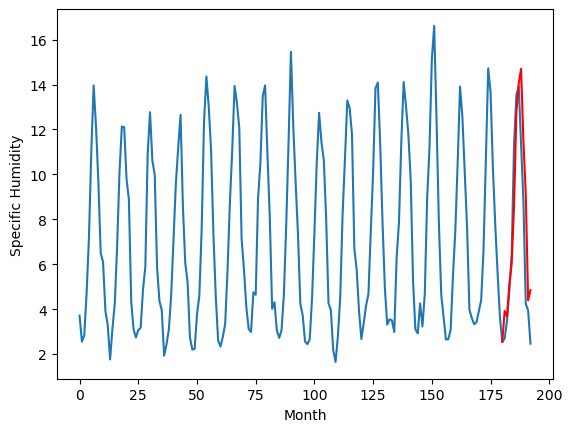

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
1.00		1.43		0.43
0.86		1.17		0.31
2.14		2.59		0.45
3.55		3.55		0.00
5.14		6.09		0.95
10.01		10.27		0.26
11.70		11.57		-0.13
12.02		12.21		0.19
9.10		8.96		-0.14
7.20		6.59		-0.61
2.28		1.90		-0.38
2.18		2.34		0.16
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.51, 1.4269723618030548, 1.1735270345211029, 2.589940460920334, 3.5540076220035552, 6.090413423776626, 10.273583742380142, 11.568328949213027, 12.20794907450676, 8.956715735197067, 6.594914587736129, 1.8963800990581507, 2.3422492766380305]


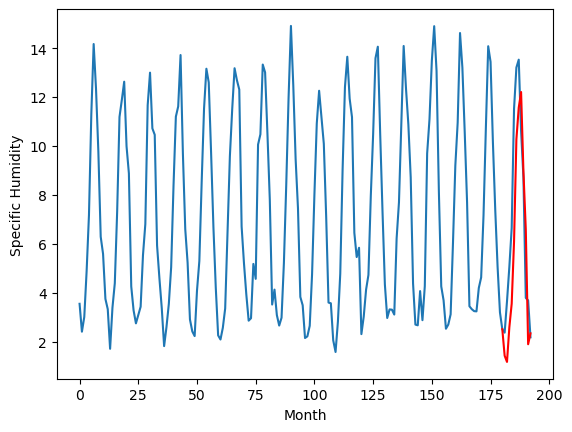

RangeIndex(start=1, stop=12, step=1)
[1.5600000000000005, 2.64, 6.369999999999998, 3.4399999999999995, 4.91, 3.42, 5.73, 4.800000000000001, 4.6, 3.09, 0.9999999999999993]
[1.4303005361557006, 2.4716960895061493, 5.671428762674331, 3.450972936153412, 4.851652578115464, 3.4709908175468445, 5.304721174240112, 3.7329166436195376, 3.6736369061470033, 3.920871429443359, 1.4269723618030548]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    1.56   1.430301
1                 1    2.64   2.471696
2                 2    6.37   5.671429
3                 3    3.44   3.450973
4                 4    4.91   4.851653
5                 5    3.42   3.470991
6                 6    5.73   5.304721
7                 7    4.80   3.732917
8                 8    4.60   3.673637
9                 9    3.09   3.920871
10               10    1.00   1.426972


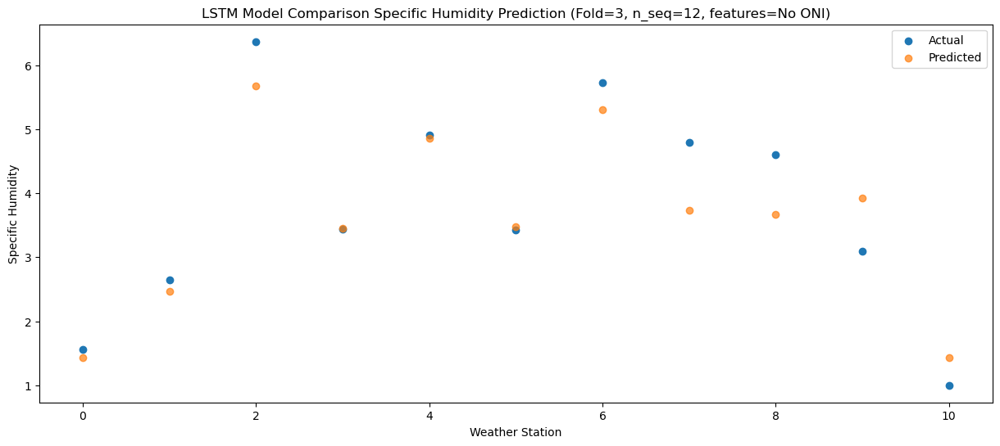

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    1.65   1.181100
1                 1    2.08   2.220325
2                 2    6.31   5.420769
3                 3    3.37   3.199950
4                 4    4.08   4.599811
5                 5    2.90   3.220068
6                 6    5.79   5.051717
7                 7    4.32   3.479535
8                 8    4.25   3.421068
9                 9    3.24   3.668185
10               10    0.86   1.173527


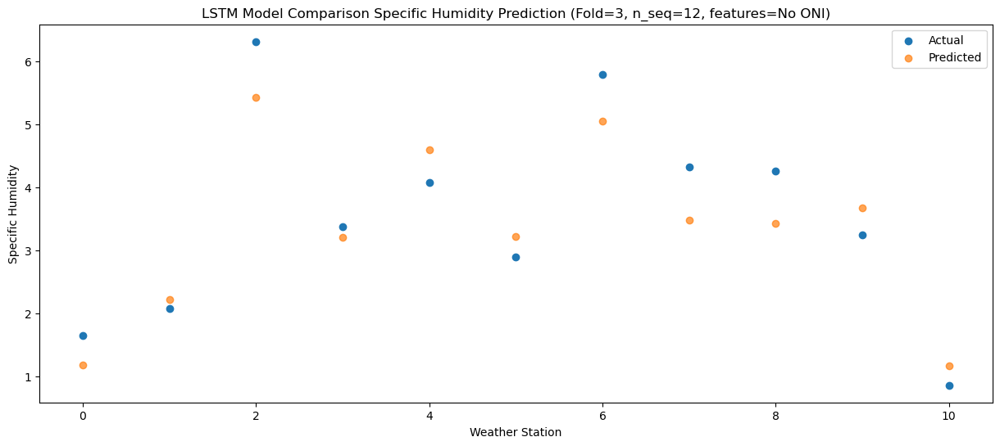

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    3.30   2.595193
1                 1    4.59   3.633994
2                 2    6.39   6.836008
3                 3    4.67   4.616164
4                 4    6.56   6.015377
5                 5    4.93   4.634267
6                 6    6.10   6.462897
7                 7    4.62   4.893554
8                 8    3.90   4.833315
9                 9    4.02   5.082626
10               10    2.14   2.589940


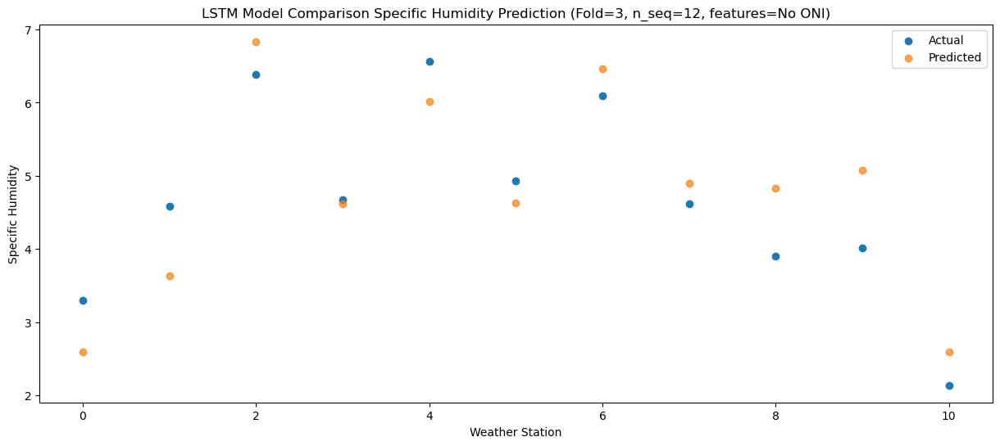

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0    3.82   3.562419
1                 1    5.76   4.603226
2                 2    7.01   7.803718
3                 3    5.86   5.582423
4                 4    7.62   6.980354
5                 5    6.23   5.599358
6                 6    6.57   7.426687
7                 7    4.31   5.857336
8                 8    4.83   5.796719
9                 9    5.40   6.046993
10               10    3.55   3.554008


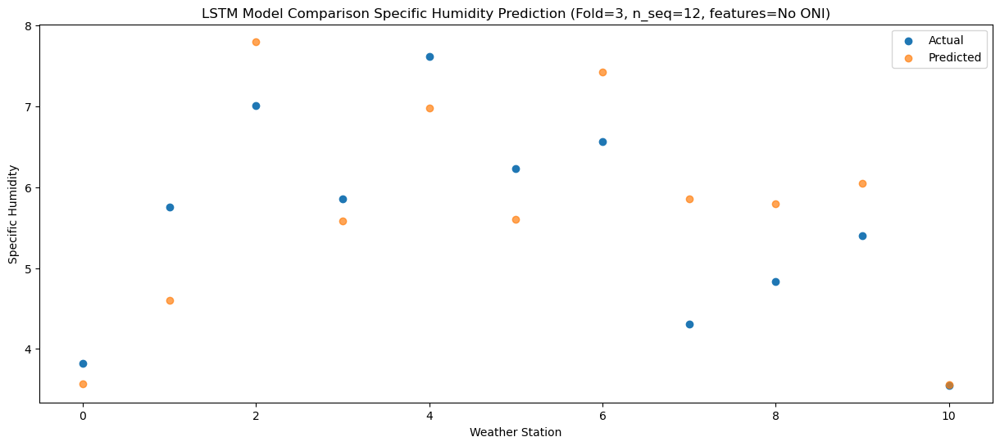

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0    6.60   6.101313
1                 1    9.28   7.143720
2                 2    7.41  10.344877
3                 3    8.39   8.119927
4                 4   10.04   9.516466
5                 5    8.47   8.134975
6                 6    7.97   9.963395
7                 7    4.87   8.396226
8                 8    5.27   8.336071
9                 9    6.97   8.584407
10               10    5.14   6.090413


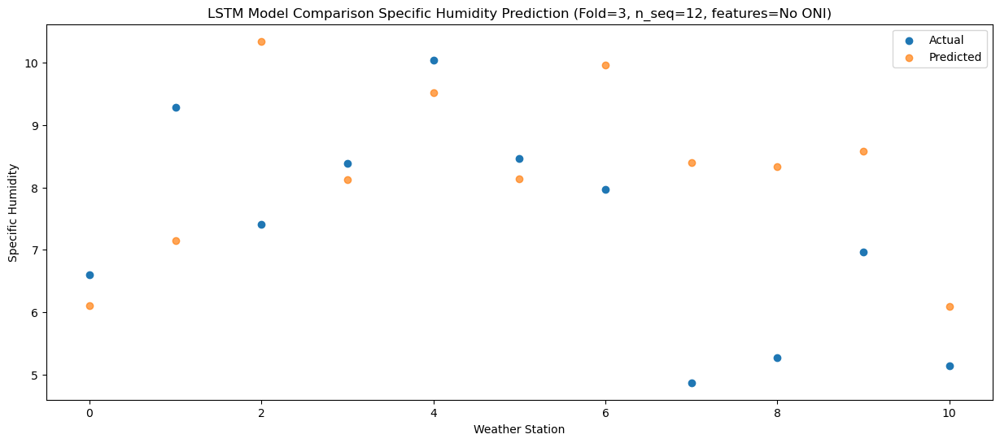

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   11.32  10.284508
1                 1   13.81  11.327818
2                 2    9.86  14.529968
3                 3   13.81  12.303680
4                 4   14.50  13.700549
5                 5   13.69  12.318120
6                 6    9.30  14.150261
7                 7    6.29  12.582970
8                 8    6.70  12.521956
9                 9   11.87  12.768184
10               10   10.01  10.273584


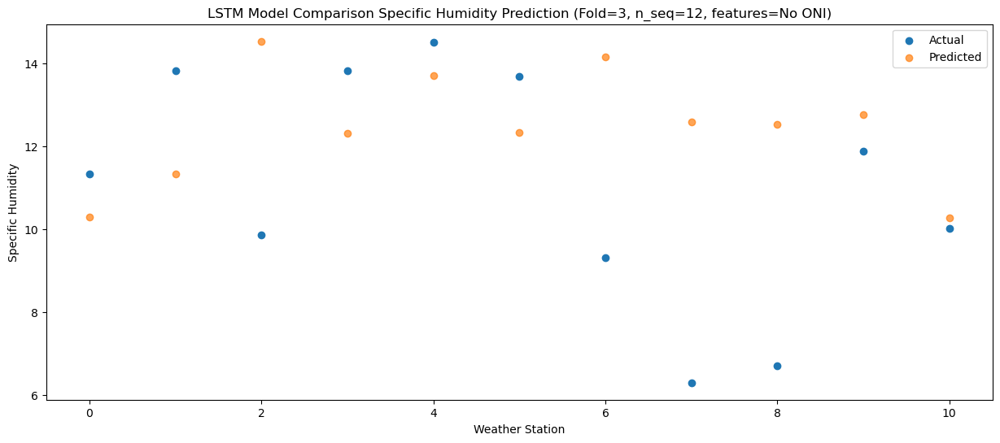

Predictions for (t+6):
    Weather_Station  Actual  Predicted
0                 0   12.56  11.581291
1                 1   14.69  12.626518
2                 2   10.56  15.826851
3                 3   14.44  13.602786
4                 4   16.45  15.001412
5                 5   14.94  13.622118
6                 6   11.75  15.449432
7                 7   11.65  13.878595
8                 8    7.18  13.813178
9                 9   14.08  14.061621
10               10   11.70  11.568329


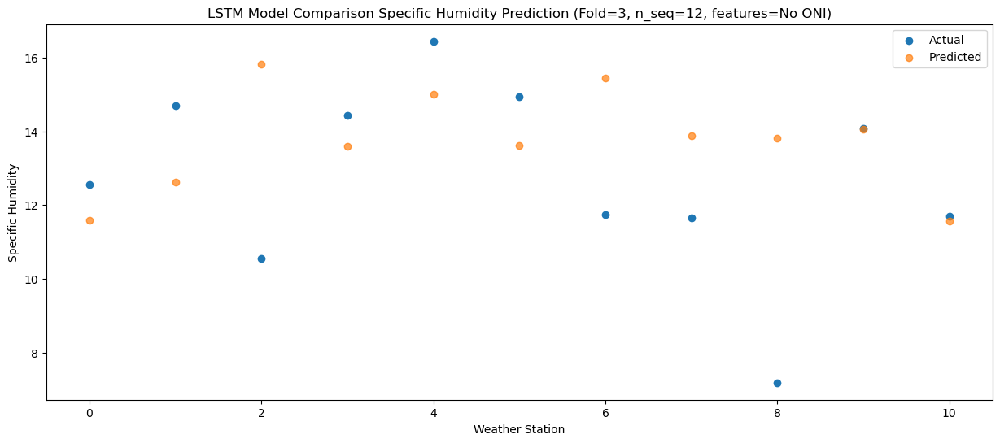

Predictions for (t+7):
    Weather_Station  Actual  Predicted
0                 0   12.83  12.221023
1                 1   14.86  13.264680
2                 2   10.09  16.463896
3                 3   15.32  14.242962
4                 4   16.54  15.643015
5                 5   15.11  14.264918
6                 6   10.32  16.090749
7                 7    9.22  14.517254
8                 8    7.57  14.449737
9                 9   14.46  14.698752
10               10   12.02  12.207949


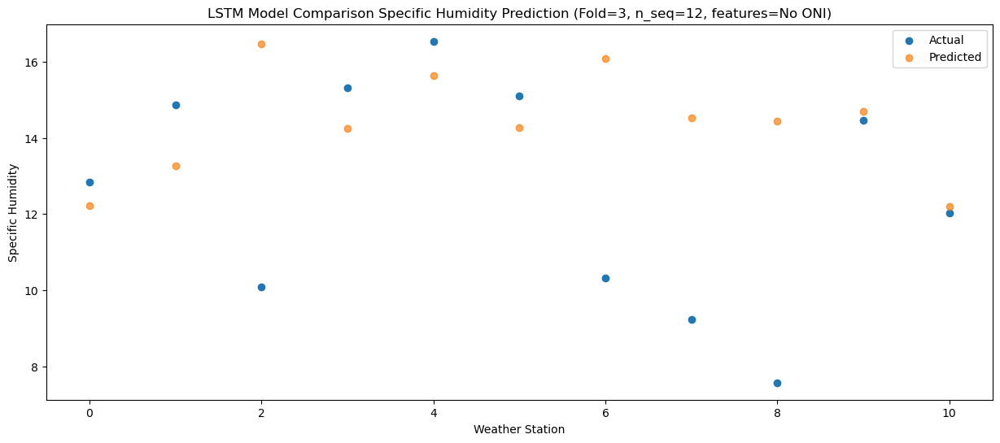

Predictions for (t+8):
    Weather_Station  Actual  Predicted
0                 0    9.21   8.972111
1                 1   10.89  10.010717
2                 2    8.80  13.219564
3                 3   11.85  10.989051
4                 4   12.77  12.384398
5                 5   11.81  11.004151
6                 6    8.62  12.836221
7                 7    7.50  11.271948
8                 8    6.93  11.207057
9                 9   11.86  11.449621
10               10    9.10   8.956716


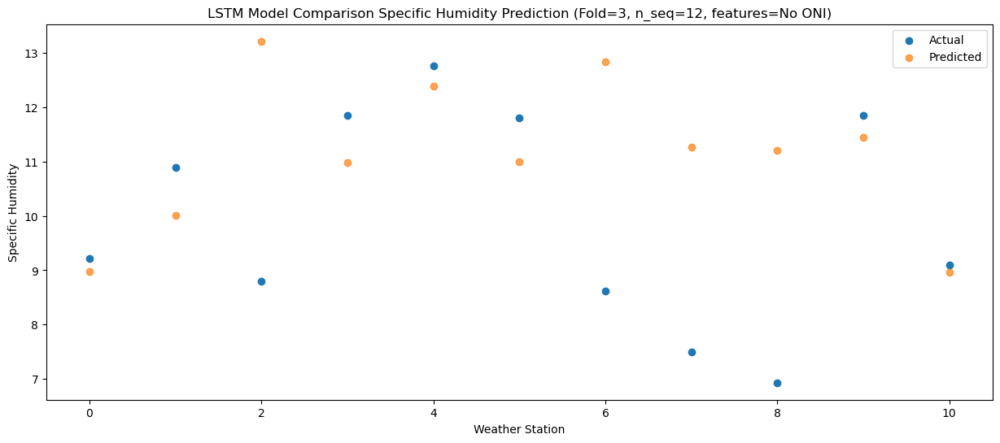

Predictions for (t+9):
    Weather_Station  Actual  Predicted
0                 0    7.17   6.613691
1                 1    8.70   7.651227
2                 2    7.66  10.865750
3                 3    9.79   8.630364
4                 4   10.82  10.026878
5                 5   10.19   8.645636
6                 6    7.53  10.479673
7                 7    6.40   8.920455
8                 8    5.90   8.853820
9                 9    9.32   9.090926
10               10    7.20   6.594915


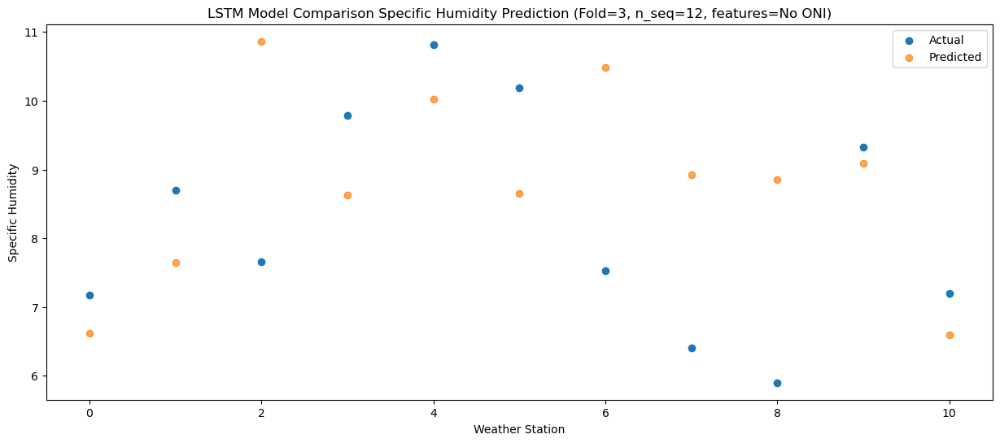

Predictions for (t+10):
    Weather_Station  Actual  Predicted
0                 0    1.67   1.919103
1                 1    4.27   2.961182
2                 2    8.24   6.175990
3                 3    4.10   3.936939
4                 4    5.70   5.337069
5                 5    4.32   3.954760
6                 6    6.82   5.786001
7                 7    5.13   4.227921
8                 8    6.12   4.160995
9                 9    4.79   4.394588
10               10    2.28   1.896380


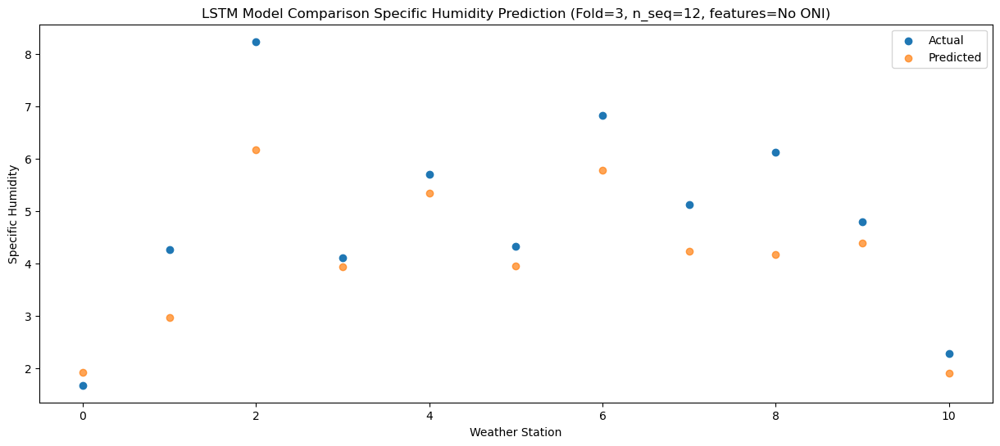

Predictions for (t+11):
    Weather_Station  Actual  Predicted
0                 0    3.62   2.372930
1                 1    5.24   3.413294
2                 2    6.74   6.627707
3                 3    5.24   4.388343
4                 4    6.40   5.785143
5                 5    5.37   4.402479
6                 6    6.11   6.234229
7                 7    5.27   4.675219
8                 8    4.87   4.614683
9                 9    4.49   4.843432
10               10    2.18   2.342249


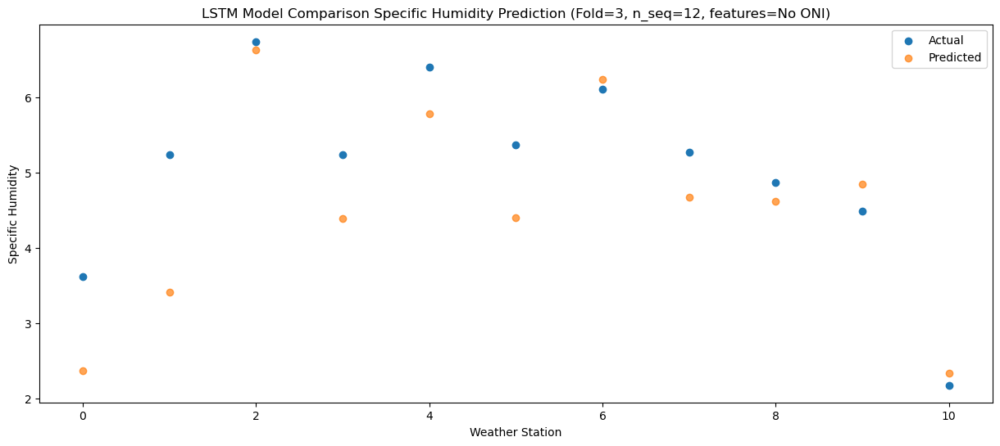

Model: "sequential_504"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_1008 (LSTM)            (1, 1, 256)               2279424   
                                                                 
 dropout_1008 (Dropout)      (1, 1, 256)               0         
                                                                 
 lstm_1009 (LSTM)            (1, 256)                  525312    
                                                                 
 dropout_1009 (Dropout)      (1, 256)                  0         
                                                                 
 dense_1512 (Dense)          (1, 256)                  65792     
                                                                 
 dense_1513 (Dense)          (1, 128)                  32896     
                                                                 
 dense_1514 (Dense)          (1, 12)                

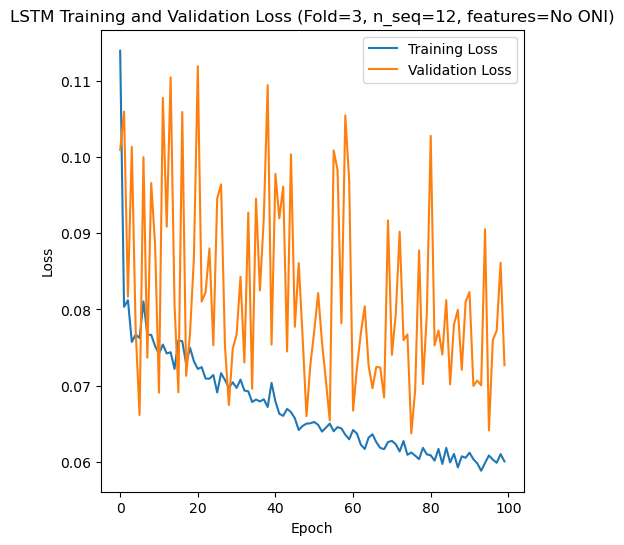

Epoch 1/100
84/84 [==============================] - 7s 24ms/step - loss: 0.1090 - accuracy: 0.5833 - mae: 0.0854 - rmse: 0.1090 - mape: 19.3760 - pearson: 0.6394 - val_loss: 0.0852 - val_accuracy: 0.8000 - val_mae: 0.0691 - val_rmse: 0.0852 - val_mape: 15.2020 - val_pearson: 0.7101
Epoch 2/100
84/84 [==============================] - 1s 9ms/step - loss: 0.0857 - accuracy: 0.6429 - mae: 0.0681 - rmse: 0.0857 - mape: 15.7386 - pearson: 0.6925 - val_loss: 0.0691 - val_accuracy: 0.8000 - val_mae: 0.0548 - val_rmse: 0.0691 - val_mape: 12.0552 - val_pearson: 0.8116
Epoch 3/100
84/84 [==============================] - 1s 9ms/step - loss: 0.0897 - accuracy: 0.6071 - mae: 0.0715 - rmse: 0.0897 - mape: 16.3514 - pearson: 0.6928 - val_loss: 0.0632 - val_accuracy: 0.8000 - val_mae: 0.0502 - val_rmse: 0.0632 - val_mape: 11.1036 - val_pearson: 0.7886
Epoch 4/100
84/84 [==============================] - 1s 10ms/step - loss: 0.0889 - accuracy: 0.6190 - mae: 0.0705 - rmse: 0.0889 - mape: 15.9122 - pea

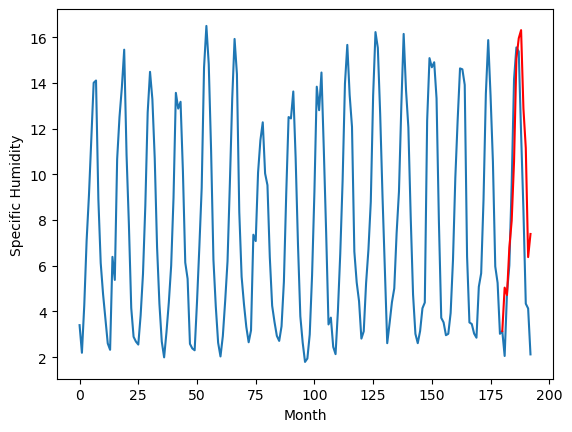

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.27		3.74		-0.53
6.26		3.42		-2.84
6.23		5.50		-0.73
6.98		6.68		-0.30
8.31		9.27		0.96
12.60		13.77		1.17
13.81		14.66		0.85
14.20		15.01		0.81
13.40		11.58		-1.82
10.48		9.86		-0.62
5.82		5.08		-0.74
7.56		6.10		-1.46
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[7.79, 3.744173182249069, 3.422793163061142, 5.496957553625107, 6.679081691503525, 9.265160096883774, 13.766891969442367, 14.655259681940079, 15.014358742237091, 11.578964455127716, 9.857774956226349, 5.079919559955597, 6.095562918186188]


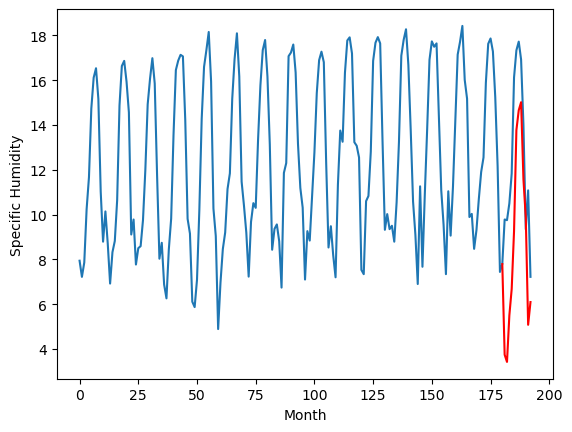

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.87		3.80		-0.07
3.75		3.48		-0.27
6.81		5.55		-1.26
7.06		6.74		-0.32
10.50		9.33		-1.17
14.74		13.83		-0.91
16.39		14.72		-1.67
16.40		15.07		-1.33
13.46		11.63		-1.83
10.68		9.91		-0.77
5.24		5.13		-0.11
8.19		6.14		-2.05
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[5.03, 3.80096828520298, 3.479001905322075, 5.553959037661553, 6.738999034762383, 9.326122428774834, 13.828751232028008, 14.717394496798516, 15.072984095215798, 11.632874365448952, 9.908800955414772, 5.126428480744362, 6.1420727926492695]


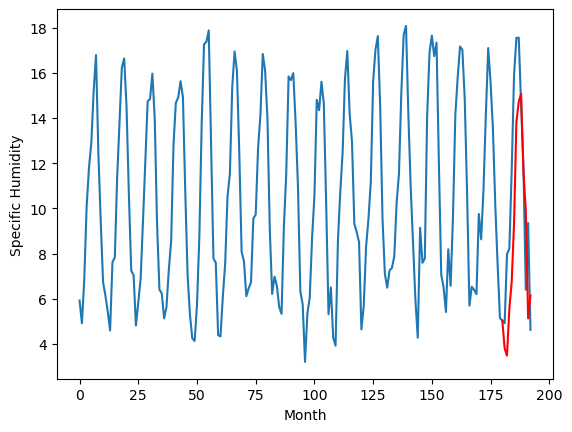

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.73		3.66		-0.07
3.41		3.34		-0.07
6.07		5.42		-0.65
7.36		6.61		-0.75
11.36		9.19		-2.17
15.05		13.69		-1.36
15.62		14.58		-1.04
16.01		14.94		-1.07
12.00		11.49		-0.51
9.15		9.77		0.62
5.53		4.99		-0.54
7.39		6.01		-1.38
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[4.41, 3.6626736932992934, 3.342672806382179, 5.419740419983864, 6.605499606728554, 9.190776448845863, 13.693245988488197, 14.580660443902016, 14.935840141177177, 11.49436427295208, 9.772812735438347, 4.9936117047071455, 6.00764335334301]


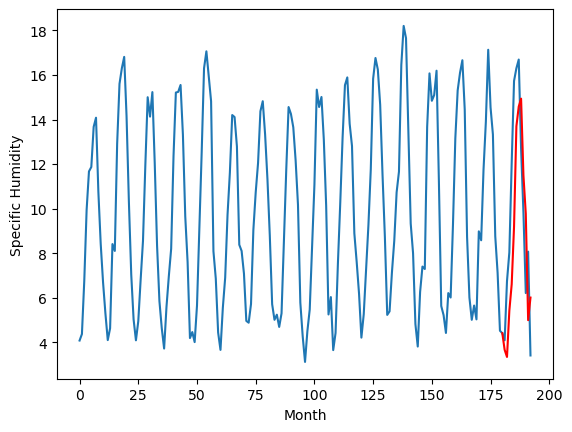

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.36		3.22		-0.14
2.91		2.91		-0.00
5.49		4.98		-0.51
6.85		6.17		-0.68
11.14		8.75		-2.39
15.02		13.25		-1.77
15.40		14.14		-1.26
15.51		14.50		-1.01
11.61		11.05		-0.56
8.88		9.33		0.45
5.27		4.55		-0.72
6.68		5.57		-1.11
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[4.29, 3.223531240224838, 2.9051946640014648, 4.9827429294586185, 6.167846703529358, 8.753577971458435, 13.254446291923523, 14.141902351379395, 14.497232848405838, 11.054022723436356, 9.332117849588395, 4.553166204690934, 5.568532997369767]


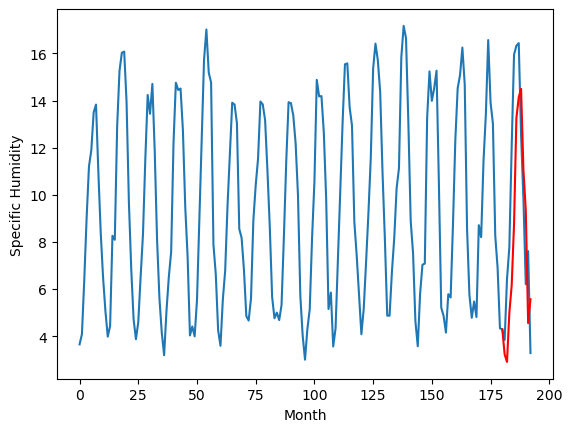

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
8.64		7.76		-0.88
8.00		7.44		-0.56
9.49		9.52		0.03
10.45		10.70		0.25
15.00		13.29		-1.71
17.30		17.79		0.49
18.33		18.68		0.35
18.05		19.03		0.98
14.80		15.59		0.79
11.75		13.87		2.12
10.03		9.09		-0.94
9.18		10.10		0.92
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.47, 7.764840262532235, 7.444649385809899, 9.52062456548214, 10.704599069952966, 13.289937662482263, 17.78595273435116, 18.675643967986108, 19.03104020893574, 15.586545723080636, 13.86770989239216, 9.087644355893136, 10.103457825779916]


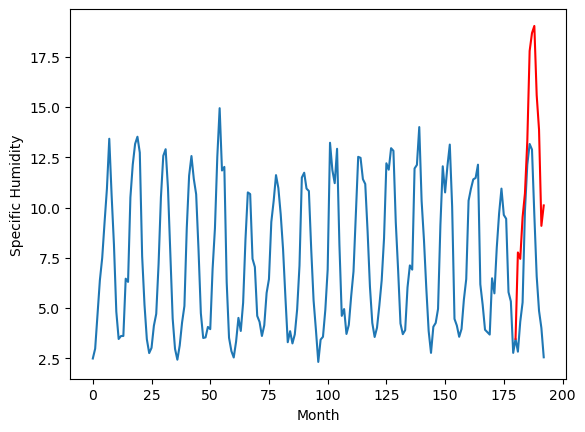

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.80		5.74		-0.06
6.05		5.42		-0.63
7.76		7.50		-0.26
8.17		8.69		0.52
11.15		11.27		0.12
15.84		15.77		-0.07
17.44		16.66		-0.78
17.82		17.02		-0.80
14.24		13.57		-0.67
12.03		11.85		-0.18
6.31		7.07		0.76
8.17		8.08		-0.09
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[4.52, 5.7436206620931625, 5.420960603356361, 7.496971545815468, 8.68572872698307, 11.272121129631996, 15.771941362023354, 16.661141453385355, 17.016732035279276, 13.571037111878397, 11.852682171463968, 7.067341862320902, 8.084788261055948]


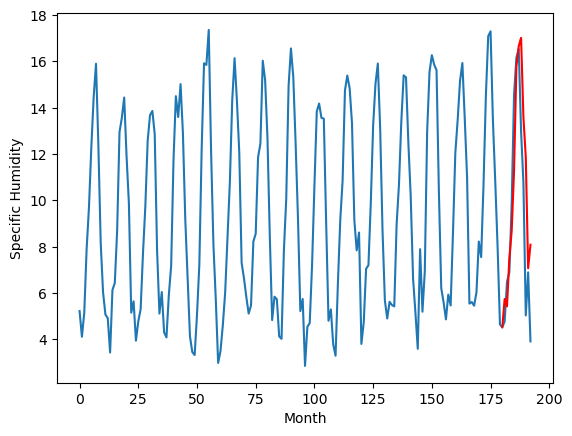

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.93		3.90		-0.03
3.30		3.58		0.28
5.67		5.65		-0.02
6.59		6.84		0.25
9.75		9.43		-0.32
14.35		13.93		-0.42
15.30		14.82		-0.48
15.04		15.18		0.14
11.78		11.73		-0.05
9.69		10.01		0.32
5.00		5.22		0.22
6.47		6.24		-0.23
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.4, 3.9021303671598435, 3.577188702225685, 5.651498051285744, 6.8400290924310685, 9.428332896828651, 13.931088538765907, 14.819754989743233, 15.175864728093147, 11.728757889866829, 10.006192119717598, 5.223571689724922, 6.240107329487801]


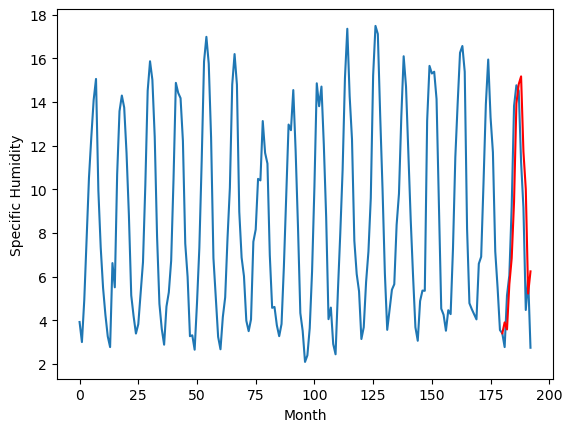

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.30		3.47		0.17
2.73		3.15		0.42
4.67		5.22		0.55
6.00		6.41		0.41
8.29		8.99		0.70
13.35		13.50		0.15
14.61		14.38		-0.23
14.75		14.74		-0.01
11.27		11.29		0.02
10.12		9.57		-0.55
4.35		4.78		0.43
5.06		5.80		0.74
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.82, 3.4727679580450057, 3.1451627999544143, 5.218169906735421, 6.405380228161812, 8.991711834073067, 13.495980480313301, 14.382339218258858, 14.739302644133568, 11.293511161208153, 9.567598471045494, 4.781844267249108, 5.797283658385277]


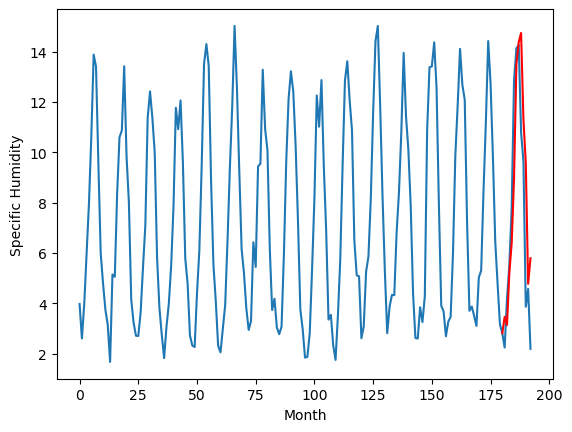

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.17		2.31		0.14
1.53		1.98		0.45
3.90		4.05		0.15
5.21		5.24		0.03
7.83		7.83		-0.00
12.58		12.33		-0.25
13.98		13.22		-0.76
14.23		13.57		-0.66
10.20		10.13		-0.07
8.33		8.40		0.07
3.04		3.62		0.58
3.58		4.63		1.05
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.86, 2.309851636886597, 1.9823678040504458, 4.0547407174110415, 5.240631392002106, 7.8285563492774966, 12.33360033273697, 13.218408336639405, 13.573560943603516, 10.128544797897339, 8.401986231803894, 3.6175981664657595, 4.631250848770142]


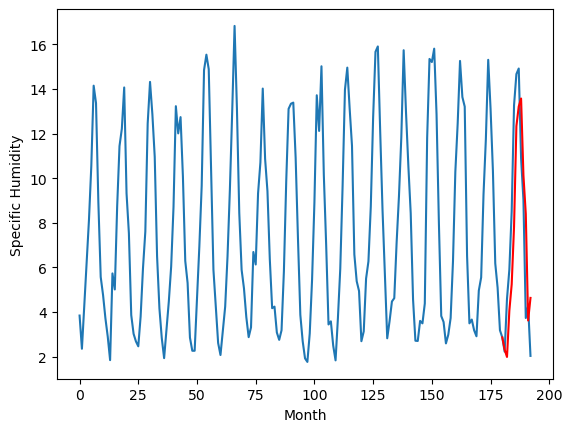

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.84		5.04		0.20
4.27		4.71		0.44
5.56		6.78		1.22
7.23		7.97		0.74
8.83		10.56		1.73
13.84		15.06		1.22
15.11		15.95		0.84
15.98		16.30		0.32
12.22		12.86		0.64
11.21		11.14		-0.07
5.97		6.35		0.38
5.93		7.36		1.43
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.61, 5.0411490660905836, 4.711630151867866, 6.781712816357612, 7.966965482831001, 10.55562310039997, 15.06031994640827, 15.947124348282813, 16.30292569220066, 12.859215126633643, 11.135511980652808, 6.349670038819312, 7.362582193017005]


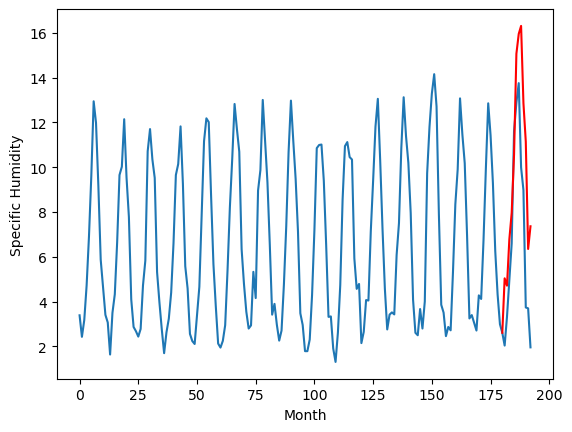

RangeIndex(start=1, stop=12, step=1)
[5.34, 4.269999999999999, 3.870000000000001, 3.7300000000000004, 3.3600000000000003, 8.64, 5.8, 3.93, 3.3000000000000003, 2.1699999999999995, 4.839999999999999]
[5.043641926050186, 3.744173182249069, 3.80096828520298, 3.6626736932992934, 3.223531240224838, 7.764840262532235, 5.7436206620931625, 3.9021303671598435, 3.4727679580450057, 2.309851636886597, 5.0411490660905836]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    5.34   5.043642
1                 1    4.27   3.744173
2                 2    3.87   3.800968
3                 3    3.73   3.662674
4                 4    3.36   3.223531
5                 5    8.64   7.764840
6                 6    5.80   5.743621
7                 7    3.93   3.902130
8                 8    3.30   3.472768
9                 9    2.17   2.309852
10               10    4.84   5.041149


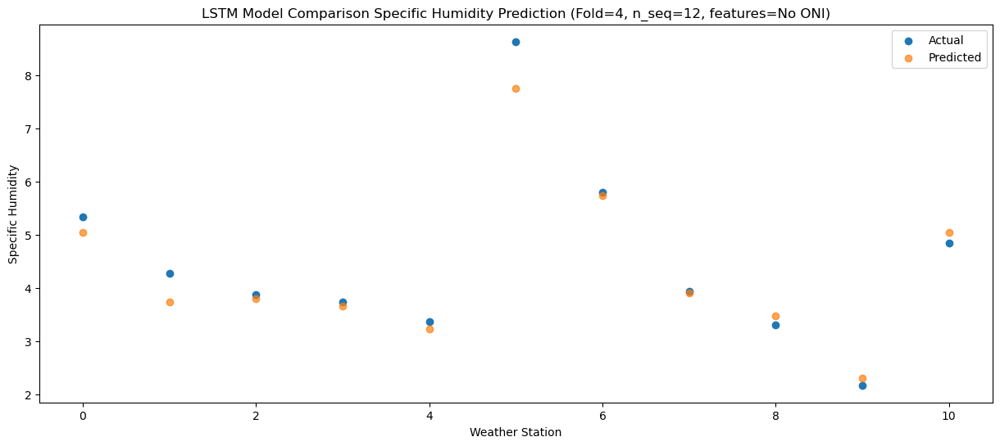

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    4.25   4.718689
1                 1    6.26   3.422793
2                 2    3.75   3.479002
3                 3    3.41   3.342673
4                 4    2.91   2.905195
5                 5    8.00   7.444649
6                 6    6.05   5.420961
7                 7    3.30   3.577189
8                 8    2.73   3.145163
9                 9    1.53   1.982368
10               10    4.27   4.711630


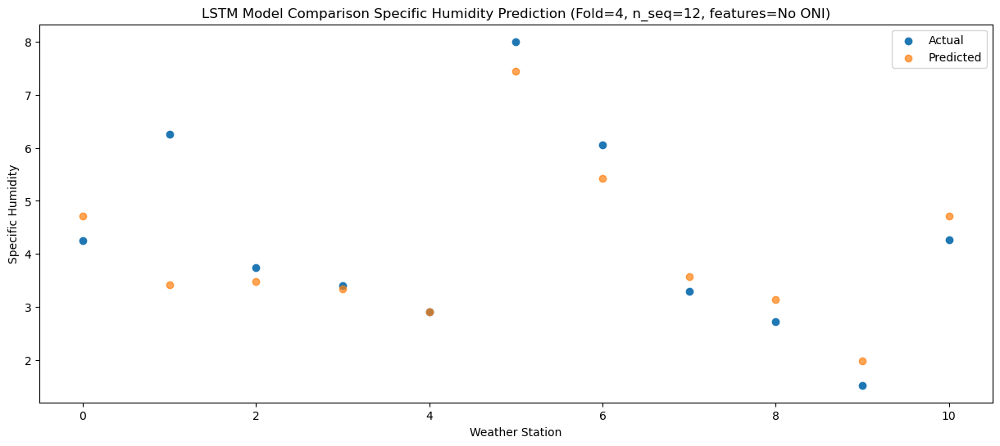

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    7.01   6.792157
1                 1    6.23   5.496958
2                 2    6.81   5.553959
3                 3    6.07   5.419740
4                 4    5.49   4.982743
5                 5    9.49   9.520625
6                 6    7.76   7.496972
7                 7    5.67   5.651498
8                 8    4.67   5.218170
9                 9    3.90   4.054741
10               10    5.56   6.781713


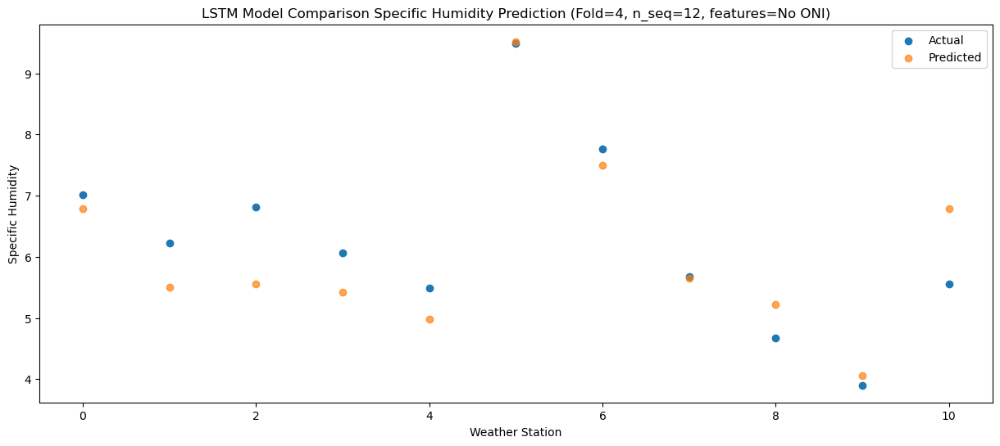

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0    8.22   7.974227
1                 1    6.98   6.679082
2                 2    7.06   6.738999
3                 3    7.36   6.605500
4                 4    6.85   6.167847
5                 5   10.45  10.704599
6                 6    8.17   8.685729
7                 7    6.59   6.840029
8                 8    6.00   6.405380
9                 9    5.21   5.240631
10               10    7.23   7.966965


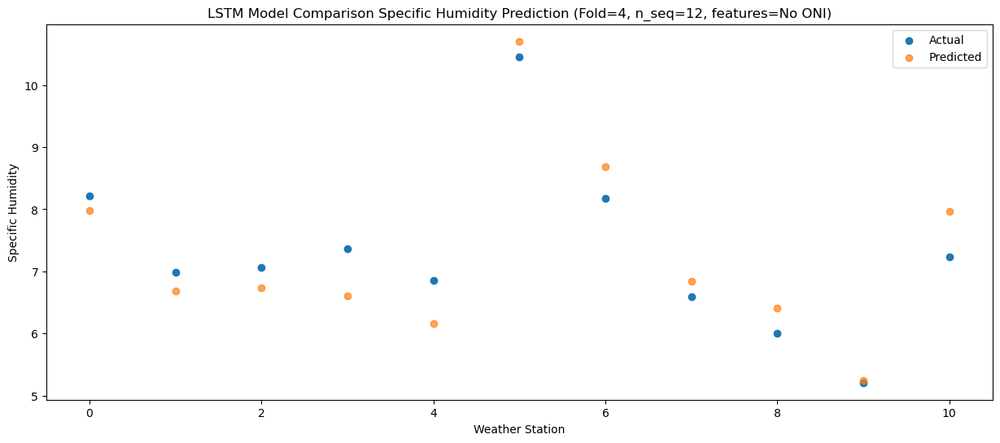

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   11.78  10.562559
1                 1    8.31   9.265160
2                 2   10.50   9.326122
3                 3   11.36   9.190776
4                 4   11.14   8.753578
5                 5   15.00  13.289938
6                 6   11.15  11.272121
7                 7    9.75   9.428333
8                 8    8.29   8.991712
9                 9    7.83   7.828556
10               10    8.83  10.555623


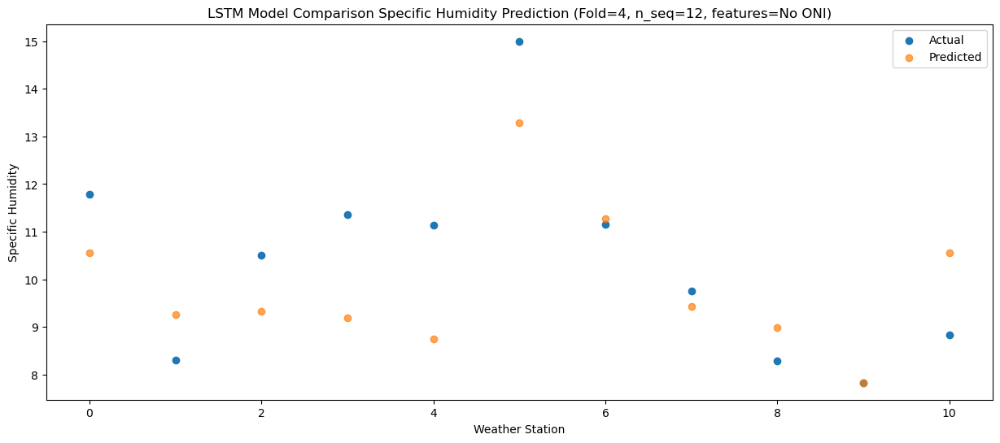

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   16.37  15.066921
1                 1   12.60  13.766892
2                 2   14.74  13.828751
3                 3   15.05  13.693246
4                 4   15.02  13.254446
5                 5   17.30  17.785953
6                 6   15.84  15.771941
7                 7   14.35  13.931089
8                 8   13.35  13.495980
9                 9   12.58  12.333600
10               10   13.84  15.060320


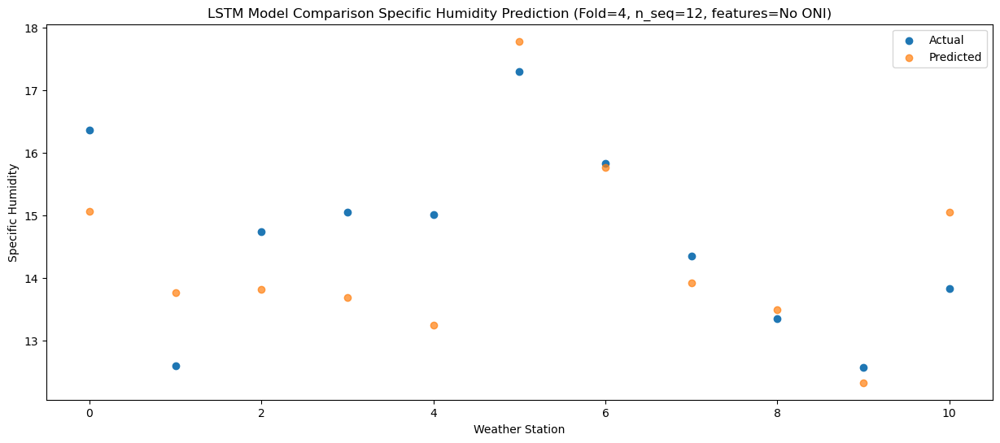

Predictions for (t+6):
    Weather_Station  Actual  Predicted
0                 0   17.76  15.957915
1                 1   13.81  14.655260
2                 2   16.39  14.717394
3                 3   15.62  14.580660
4                 4   15.40  14.141902
5                 5   18.33  18.675644
6                 6   17.44  16.661141
7                 7   15.30  14.819755
8                 8   14.61  14.382339
9                 9   13.98  13.218408
10               10   15.11  15.947124


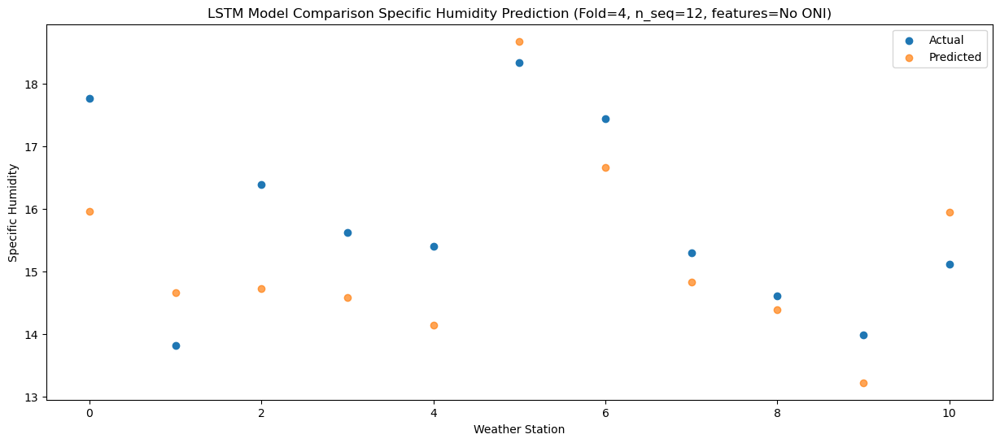

Predictions for (t+7):
    Weather_Station  Actual  Predicted
0                 0   17.58  16.314844
1                 1   14.20  15.014359
2                 2   16.40  15.072984
3                 3   16.01  14.935840
4                 4   15.51  14.497233
5                 5   18.05  19.031040
6                 6   17.82  17.016732
7                 7   15.04  15.175865
8                 8   14.75  14.739303
9                 9   14.23  13.573561
10               10   15.98  16.302926


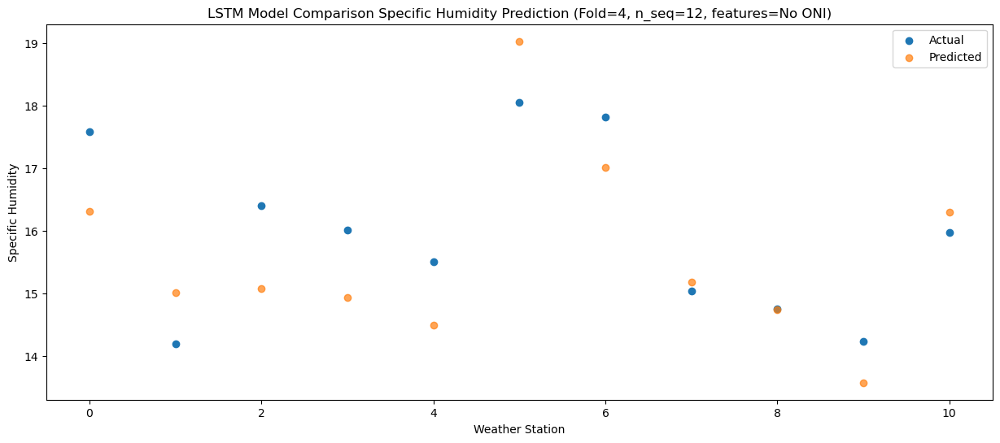

Predictions for (t+8):
    Weather_Station  Actual  Predicted
0                 0   14.00  12.877252
1                 1   13.40  11.578964
2                 2   13.46  11.632874
3                 3   12.00  11.494364
4                 4   11.61  11.054023
5                 5   14.80  15.586546
6                 6   14.24  13.571037
7                 7   11.78  11.728758
8                 8   11.27  11.293511
9                 9   10.20  10.128545
10               10   12.22  12.859215


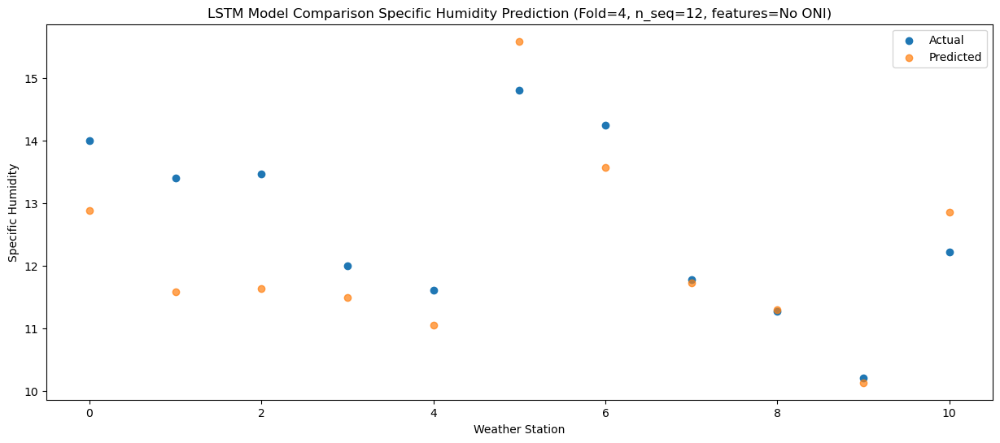

Predictions for (t+9):
    Weather_Station  Actual  Predicted
0                 0   10.63  11.154847
1                 1   10.48   9.857775
2                 2   10.68   9.908801
3                 3    9.15   9.772813
4                 4    8.88   9.332118
5                 5   11.75  13.867710
6                 6   12.03  11.852682
7                 7    9.69  10.006192
8                 8   10.12   9.567598
9                 9    8.33   8.401986
10               10   11.21  11.135512


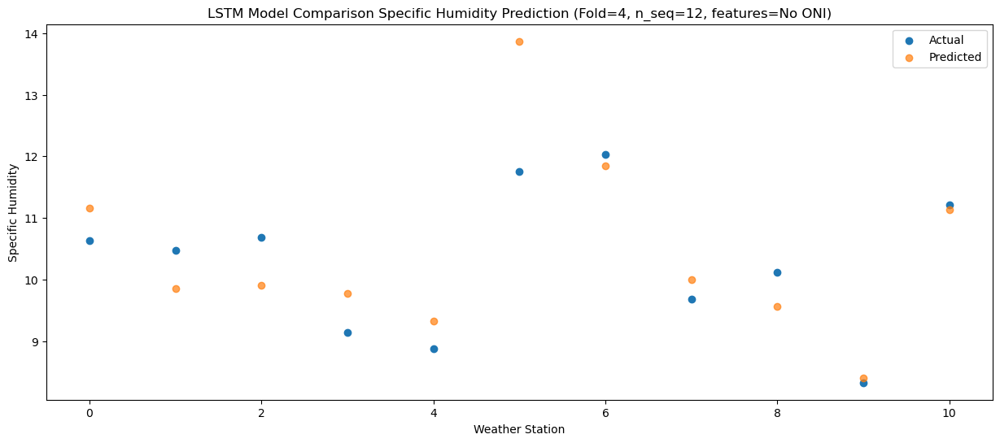

Predictions for (t+10):
    Weather_Station  Actual  Predicted
0                 0    6.54   6.379458
1                 1    5.82   5.079920
2                 2    5.24   5.126428
3                 3    5.53   4.993612
4                 4    5.27   4.553166
5                 5   10.03   9.087644
6                 6    6.31   7.067342
7                 7    5.00   5.223572
8                 8    4.35   4.781844
9                 9    3.04   3.617598
10               10    5.97   6.349670


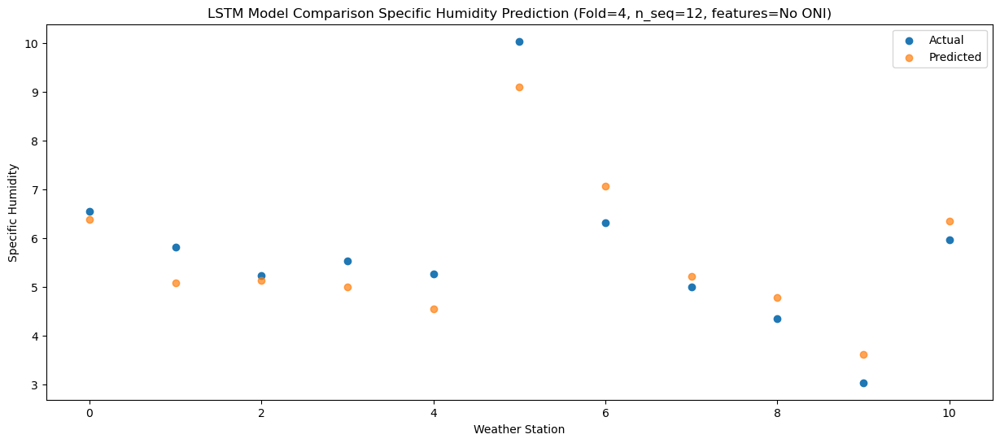

Predictions for (t+11):
    Weather_Station  Actual  Predicted
0                 0    6.33   7.392003
1                 1    7.56   6.095563
2                 2    8.19   6.142073
3                 3    7.39   6.007643
4                 4    6.68   5.568533
5                 5    9.18  10.103458
6                 6    8.17   8.084788
7                 7    6.47   6.240107
8                 8    5.06   5.797284
9                 9    3.58   4.631251
10               10    5.93   7.362582


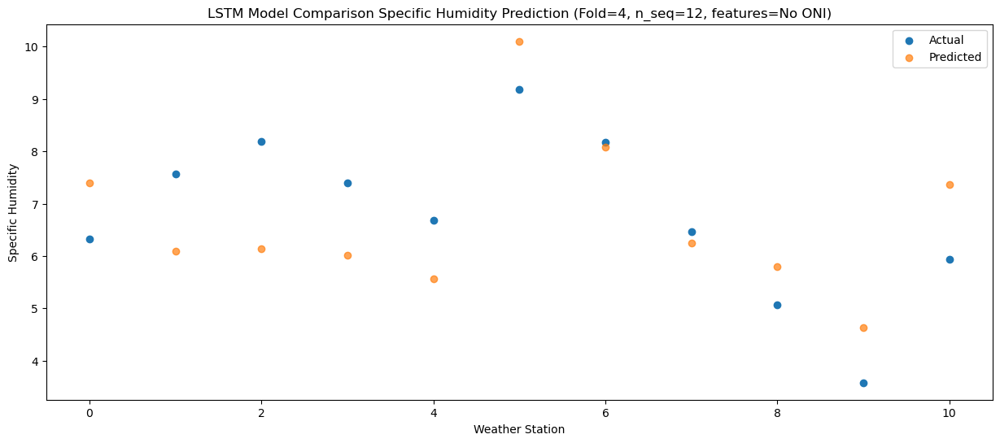

Model: "sequential_505"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_1010 (LSTM)            (1, 1, 256)               2279424   
                                                                 
 dropout_1010 (Dropout)      (1, 1, 256)               0         
                                                                 
 lstm_1011 (LSTM)            (1, 256)                  525312    
                                                                 
 dropout_1011 (Dropout)      (1, 256)                  0         
                                                                 
 dense_1515 (Dense)          (1, 256)                  65792     
                                                                 
 dense_1516 (Dense)          (1, 128)                  32896     
                                                                 
 dense_1517 (Dense)          (1, 12)                

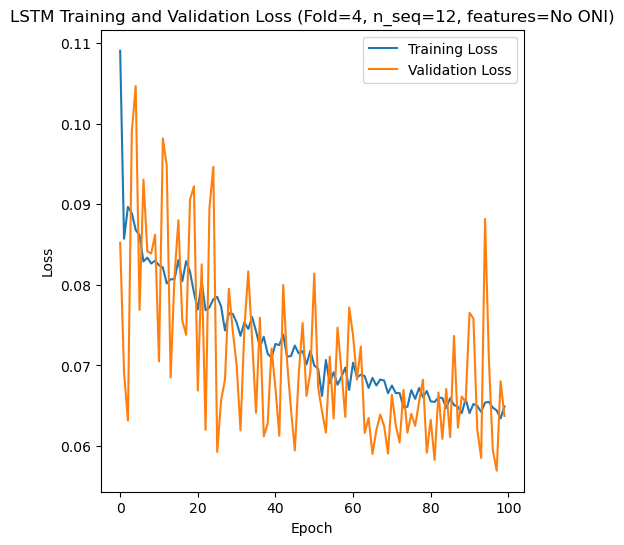

[[0.3038231691493109, 0.8708339631835915, 0.9977891400816171, 0.6655323030398902, 1.165686415311369, 0.8871995388039193, 0.8190736972400674, 0.7616910723632622, 0.8913650789011671, 0.9629099310109267, 0.6158412568604011, 1.7508710892686576], [0.3773539524949542, 0.5592151736945911, 0.6435781363341057, 0.8635898361514156, 1.4319805366263163, 1.2662181452934584, 0.8158229037612846, 0.9844789944348605, 0.8060153730121556, 1.073149961505888, 0.9723914442935295, 1.544485543534265], [0.4682951584450548, 1.0626300319657538, 1.1044117973225316, 1.2618441758396346, 2.30130067667707, 2.7047453248224067, 1.6932036522087774, 1.916824133209718, 1.3551116639513796, 1.6373223208200793, 0.9393974251394976, 1.6907248664004346], [0.5712510276128381, 0.5761996362491026, 0.6328734746337853, 0.820182450706696, 1.981813571484083, 3.46055879499374, 3.0175373116510458, 3.7538676693028137, 2.565290333667838, 1.9126853125724308, 1.0596318807567553, 0.8273581793861533], [0.33736572933078024, 0.9390701459020044, 

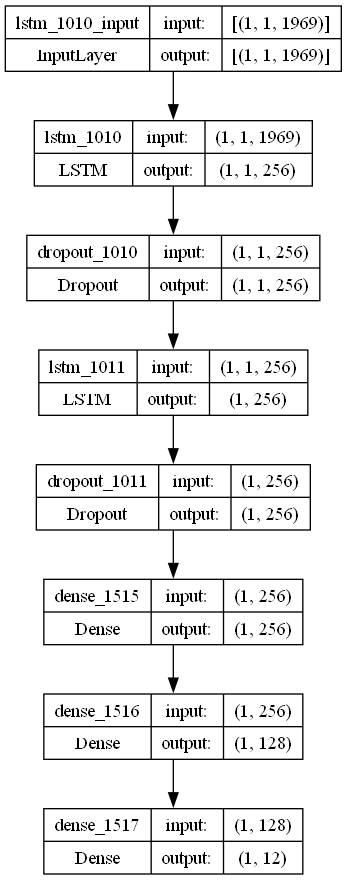

In [9]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score
from tensorflow.keras.utils import plot_model

def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

# fit the best LSTM model using parameters found by Optuna
def create_best_model(X, y, n_lag, n_seq, n_batch, nb_epoch):
    
    #Parameters:
    #trial (array-like): Optuna parameters.
    #train (array-like): Target values.
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations
    #nb_epoch (int): Maximum number of epochs
    
    # Hyperparameters from the best model
    lr = 0.026818099745858137
    optimizer = SGD(learning_rate = lr)
    activation_function = 'sigmoid'
    lstm_units = 256
    dropout_rate = 0.4597414198770463

    # design network
    model = Sequential()
    model.add(LSTM(lstm_units, return_sequences=True, batch_input_shape=(n_batch, X.shape[1], X.shape[2]), stateful=True))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units))
    model.add(Dropout(dropout_rate))
    model.add(Dense(256, input_dim=y.shape[1], activation=activation_function))
    model.add(Dense(128, activation=activation_function))
    model.add(Dense(n_seq))
    model.compile(loss=rmse, optimizer=optimizer, metrics=['accuracy', 'mae', rmse, mape, pearson])
        
    return model

# Make one forecast with an LSTM
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def forecast_lstm(model, X, n_seq, n_test):
    # reshape input pattern to [samples, timesteps, features]
    X = X.reshape(1, 1, X.shape[1])
    # make forecast
    forecast = model.predict(X)
    # convert to array
    return forecast
     
# Evaluate the persistence model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def make_forecasts(model, X_test, y_test, n_lag, n_seq, n_test):
    forecasts = list()
    for i in range(len(X_test)):
        X, y = X_test[i, :], y_test[i, :]
        # make forecast
        forecast = forecast_lstm(model, X, n_seq, n_test)
        # store the forecast
        forecasts.append(forecast)
    return forecasts
     
# Invert differenced forecast
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_difference(last_ob, forecast):
    # Invert the first forecast
    inverted = list()
    inverted.append(forecast[0] + last_ob)
    # Propagate the difference forecast using the inverted first value
    for i in range(1, len(forecast)):
        inverted.append(forecast[i] + inverted[i-1])
    return inverted
     
# Inverse data transform on forecasts
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_transform(series, forecasts, scaler, n_test, n_seq):
    inverted = list()
    for i in range(len(forecasts)):
        # Create an array from the forecast
        forecast = forecasts[i]
        forecast = forecast.reshape(1, n_seq)
        # invert scaling
        inv_scale = scaler.inverse_transform(forecast)
        inv_scale = inv_scale[0, :]
        # invert differencing
        index = len(series) - n_test + i - 1
        last_ob = series.values[index]
        inv_diff = inverse_difference(last_ob, inv_scale)
        # store
        inverted.append(inv_diff)
    return inverted
     
# evaluate the RMSE for each forecast time step
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def evaluate_forecasts(test, forecasts, n_lag, n_seq):
    rmse_list = []
    mae_list = []
    mape_list = []
    r2_list = []
    for i in range(n_seq):
        actual = [row[i] for row in test]
        predicted = [forecast[i] for forecast in forecasts]
        rmse = sqrt(mean_squared_error(actual, predicted))
        mae = mean_absolute_error(actual, predicted)
        mse = mean_squared_error(actual, predicted)
        mape = mean_absolute_percentage_error(actual, predicted)
        r2 = r2_score(actual, predicted) 
        rmse_list.append(rmse)
        mae_list.append(mae)
        mape_list.append(mape)
        r2_list.append(r2)
        print("Month at t+"+str(i+1)+":")
        print('t+%d RMSE: %f' % ((i+1), rmse))
        print('t+%d MAE: %f' % ((i+1), mae))
        print('t+%d MAPE: %f' % ((i+1), mape))
        print('t+%d R2_SCORE: %f' % ((i+1), r2))

    return rmse_list, mae_list, mape_list, r2_list
     
# plot the forecasts in the context of the original dataset
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def plot_forecasts(series, forecasts, n_test, n_seq, n_lag):
    # plot the entire dataset in blue
    plt.plot(series[:n_lag+2+len(forecasts)].values)
    # plot the forecasts in red
    off_s = n_lag + 1
    off_e = off_s + len(forecasts) + 1
    xaxis = [x for x in range(off_s, off_e)]
    yaxis = [series.values[off_s]] + forecasts
    print(xaxis)
    print(yaxis)
    plt.plot(xaxis, yaxis, color='red')
    plt.xlabel("Month")
    plt.ylabel("Specific Humidity")
    # show the plot
    plt.show()

n_batch = 1
n_test = 11
nb_epoch = 100
    
rmse_avg_list = []
mae_avg_list = []
mape_avg_list = []
r2_score_avg_list = []
forecast_results = []
actual_results = []
    
for i in range(5):
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]

    X = train1[:, 0:-n_seq]
    y = train1[:, -n_seq:]
    X_test = test1[:, 0:-n_seq]
    y_test = test1[:, -n_seq:]
    X_val = validation1[:, 0:-n_seq]
    y_val = validation1[:, -n_seq:]

    dataset_df = pd.DataFrame(val_y[i])
    dataset_df = dataset_df.iloc[0:10, :]
    dataset = dataset_df.values

    series = pd.Series(dataset[:, 0]) # Using first column (specific humidity)

    X = X.reshape(X.shape[0], 1, X.shape[1])
    X1 = X_test
    X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
    X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])

    best_model = create_best_model(X, y, n_lag, n_seq, n_batch, nb_epoch)
    history = best_model.fit(X, y, epochs=100, batch_size=n_batch, validation_data=(X_val, y_val))

    # Evaluate the model
    loss = best_model.evaluate(X_test, y_test, verbose=2)
    print(f'Test Loss: {loss}')

    # make forecasts
    forecasts = make_forecasts(best_model, X_test, y_test, n_lag, n_seq, n_test)
    
    # inverse transform forecasts and test
    forecasts = inverse_transform(series, forecasts, scaler[i], n_test+2, n_seq)
    actual = [row[-n_seq:] for row in test1]
    actual = inverse_transform(series, actual, scaler[i], n_test+2, n_seq)

    rmse_list = [] # list stores root mean squared errors for each future time prediction
    mae_list = [] # list stores root mean squared errors for each future time prediction
    mape_list = [] # list stores root mean squared errors for each future time prediction
    r2_list = [] # list stores root mean squared errors for each future time prediction

    # evaluate forecasts
    rmse_list, mae_list, mape_list, r2_list = evaluate_forecasts(actual, forecasts, n_lag, n_seq)

    rmse_avg_list.append(rmse_list)
    mae_avg_list.append(mae_list)
    mape_avg_list.append(mape_list)
    r2_score_avg_list.append(r2_list)
    forecast_results.append(forecasts)
    actual_results.append(actual)

    for j in range(11):
        print("Weather Station "+str(j+1)+":")
        print("Actual S.H.\tPredicted S.H.\tDifference")
        print("-----------\t--------------\t----------")
        for k in range(n_seq):
            diff = forecasts[j][k] - actual[j][k]
            print(f"{actual[j][k]:.2f}\t\t{forecasts[j][k]:.2f}\t\t{diff:.2f}")
    
        # plot forecasts
        dataset_df = pd.DataFrame(val_y[i])
        dataset_df = dataset_df.iloc[0:11, :]
        dataset_df = dataset_df.transpose()
        dataset = dataset_df.values

        series_ws = pd.Series(dataset[:, j]) # Using first column (temperatures)
        forecasts_ws = forecasts[j]
        
        plot_forecasts(series_ws, forecasts_ws, n_test, n_seq, n_lag)

    # Print out plots of actual and predicted values for weather stations
    ws = df.index[1:12]
    print(ws)
    a = []
    f = []
    for q in range(len(actual)):
        x = actual[q]
        a.append(x[0])
    for q in range(len(forecasts)):
        x = forecasts[q]
        f.append(x[0])
    print(a)
    print(f)
    # Create a DataFrame for plotting
    results_df = pd.DataFrame({
        'ws': ws,
        'Actual': a,
        'Predicted': f
    })

    for k in range(n_seq):
        print("Predictions for (t+"+str(k)+"):")
        # Print out plots of actual and predicted values for each weather station
        results = []

        # Create a DataFrame for plotting
        for j in range(11):
            results.append([j, actual[j][k], forecasts[j][k]])
               
        results_df = pd.DataFrame(results)
        results_df.columns = ['Weather_Station', 'Actual', 'Predicted']

        print(results_df)
            
        # Plotting the results
        plt.figure(figsize=(15, 6))
        plt.scatter(results_df['Weather_Station'], results_df['Actual'], label='Actual')
        plt.scatter(results_df['Weather_Station'], results_df['Predicted'], label='Predicted', alpha=0.7)
        title1='LSTM Model Comparison Specific Humidity Prediction (Fold='+str(i)+', n_seq='+str(n_seq)+', features=No ONI)'
        plt.title(title1)
        plt.xlabel('Weather Station')
        plt.ylabel('Specific Humidity')
        plt.legend()
        plt.show()

    best_model.summary()

    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    title2 = 'LSTM Training and Validation Loss (Fold='+str(i)+', n_seq='+str(n_seq)+', features=No ONI)'
    plt.title(title2)
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(loc='upper right')
    plt.show()

print(rmse_avg_list)
print(mae_avg_list)
print(mape_avg_list)
print(r2_score_avg_list)
print(forecast_results)
print(actual_results)
print("Accuracy Results:")
print("RMSE for each fold:")
print(rmse_avg_list)
print("Average RMSE:"+str(np.mean(rmse_avg_list)))
print("Average MAE:"+str(np.mean(mae_avg_list)))
print("Average MAPE:"+str(np.mean(mape_avg_list)))
print("Average R2 Score:"+str(np.mean(r2_score_avg_list)))

# Plot model architecture
filename = "lstm_model_optimized_SH_S12_No_ONI.png"
plot_model(best_model, to_file=filename, show_shapes=True, show_layer_names=True)

In [ ]:
from matplotlib import pyplot

n_test_batch = 11
ws=0

# make forecasts
forecasts = make_forecasts(best_model, X_test, y_test, n_lag, n_seq, n_test_batch)

# inverse transform forecasts and test
forecasts = inverse_transform(series, forecasts, scaler[i], n_test+2, n_seq)
actual = [row[-n_seq:] for row in test1]
actual = inverse_transform(series, actual, scaler[i], n_test+2, n_seq)

rmse_list = [] # list stores root mean squared errors for each future time prediction
mae_list = [] # list stores root mean squared errors for each future time prediction
mape_list = [] # list stores root mean squared errors for each future time prediction
r2_list = [] # list stores root mean squared errors for each future time prediction
    
# evaluate forecasts
rmse_list, mae_list, mape_list, r2_list = evaluate_forecasts(actual, forecasts, n_lag, n_seq)

# plot forecasts
dataset_df = pd.DataFrame(val_y[0])
dataset_df = dataset_df.iloc[0:11, :]
dataset_df = dataset_df.transpose()
dataset = dataset_df.values

#print(dataset_df)

#print(len(dataset))
#print(dataset)


series_ws = pd.Series(dataset[:, ws]) # Using first column (specific_humidity)
forecasts_ws = [forecasts[ws]]

print(series_ws[180:225])
print(actual[0])
print(forecasts[0])

n_test=11
print(len(series_ws))
print(series_ws[220:228])
print(len(forecasts_ws))
print(forecasts_ws)
print(n_seq)
print(n_test)

# plot forecasts
plot_forecasts(series_ws, forecasts_ws, n_test+2)

In [ ]:
# Extract the dates corresponding to the test set predictions
test_dates = df.index[-len(actual[0]):]

# Print out plots of actual and predicted values for each weather station
for j in range(11):
    print("Weather Station "+str(j+1)+":")
    # Create a DataFrame for plotting
    results_df = pd.DataFrame({
        'Month': test_dates,
        'Actual': actual[j],
        'Predicted': forecasts[j]
    })
            
    # Plotting the results
    plt.figure(figsize=(15, 6))
    plt.plot(results_df['Month'], results_df['Actual'], label='Actual')
    plt.plot(results_df['Month'], results_df['Predicted'], label='Predicted', alpha=0.7)
    plt.title('LSTM Model Comparison Specific Humidity Prediction')
    plt.xlabel('Month')
    plt.ylabel('Specific Humidity')
    plt.legend()
    plt.show()

    # Plot model architecture
    filename = "lstm_model_optimized_ws_"+str(j)+".png"
    plot_model(best_model, to_file=filename, show_shapes=True, show_layer_names=True)

In [ ]:
print(np.mean(rmse))
print(np.std(rmse))

In [ ]:
print(len(actual))
print(len(actual[0]))
print(len(forecasts))
print(len(forecasts[0]))